# Clustering initialization

## Imports

In [1]:
%load_ext autoreload
%autoreload 2
# This will automatically reload modules before executing code that depends on them.

# 3rd party imports
import networkx as nx
import numpy as np
np.set_printoptions(linewidth=1000)
import matplotlib.colors as mcolors
import matplotlib.pyplot as plt
from pprint import pprint
import pandas as pd

# local imports
from modules import laplacian, jacobian
from modules.data import Data
import cluster

## Functions

In [2]:
from modules.laplacian import createA

def compute_error(resolution, mpoints, fpoints, deformation):
    """Compute the error between the deformation and the expected values."""
    A, Zd, Yd, Xd = createA(np.zeros((1, resolution[0], resolution[1])), mpoints, fpoints)
    dx = deformation[2, 0, :, :]
    dy = deformation[1, 0, :, :]
    dz = deformation[0, 0, :, :]

    residual_x = A @ dx.flatten() - Xd
    residual_y = A @ dy.flatten() - Yd
    residual_z = A @ dz.flatten() - Zd

    err_x = np.linalg.norm(residual_x)
    err_y = np.linalg.norm(residual_y)
    err_z = np.linalg.norm(residual_z)
    total_err = np.linalg.norm(residual_x + residual_y + residual_z)
    return err_x, err_y, err_z, total_err

In [3]:
import matplotlib.image as mpimg
from scipy.ndimage import zoom
from scipy.ndimage import geometric_transform
from functools import partial

# Load png function
def load_png(file_path: str, scale: float = 1.0, alpha: float = 1.0):
    """Load a color PNG image and return it as a numpy array, with scaling and alpha."""
    img_array = mpimg.imread(file_path)  # shape: (H, W, 3) or (H, W, 4)
    if img_array.ndim == 2:  # Grayscale image
        img_array = np.stack((img_array,) * 3, axis=-1)  # Convert to RGB
    # Only scale height and width, not channels
    if scale != 1.0:
        img_array = zoom(img_array, (scale, scale, 1), order=1)
    # If overlay is not RGBA, convert to RGBA
    if img_array.shape[-1] == 3:
        alpha_channel = np.ones(img_array.shape[:2], dtype=img_array.dtype) * alpha
        img_array = np.dstack((img_array, alpha_channel))
    else:
        img_array[..., 3] = alpha  # Set alpha for all pixels
    return img_array


# Show color png
def show_png(image_array, title=None):
    """Display a color image using matplotlib, compositing transparent pixels over white."""
    if image_array.shape[-1] == 4:  # RGBA
        rgb = image_array[..., :3]
        alpha = image_array[..., 3:4]
        white = np.ones_like(rgb)
        # Composite over white: out = alpha*rgb + (1-alpha)*white
        img = alpha * rgb + (1 - alpha) * white
    else:
        img = image_array
    plt.imshow(img)
    if title:
        plt.title(title)
    plt.axis('off')
    plt.show()
    

def shift3Dfunc(point, dx, dy, dz):
    try:
        px = point[0] + dx[point[0], point[1],  point[2]]
        py = point[1] + dy[point[0], point[1],  point[2]]
        pz = point[2] + dz[point[0], point[1],  point[2]]
        if(px<0 or px> dx.shape[0]):
            return (point[0], point[1], point[2])
        if(py<0 or py> dx.shape[1]):
            return (point[0], point[1], point[2])
        if(pz<0 or pz> dx.shape[2]):
            return (point[0], point[1], point[2])
        return (px, py, pz)
    except:
        return (0, 0, 0)

def apply_transformation(d, moving_image, fixed_image, 
                         mpoints=None, fpoints=None, title="Transformed image"):
    #print(moving_image.shape)
    ch0 = moving_image[:, :]
    ch0 = ch0[np.newaxis, :, :]  # Add a new axis for the channel dimension
    #ch1 = moving_image[:, :, 1]
    #ch1 = ch1[np.newaxis, :, :]  # Add a new axis for the channel dimension
    #ch2 = moving_image[:, :, 2]
    #ch2 = ch2[np.newaxis, :, :]  # Add a new axis for the channel dimension
    #ch3 = moving_image[:, :, 3]
    #ch3 = ch3[np.newaxis, :, :]  # Add a new axis for the channel dimension
    
    deformation_field = d.deformation  # Get the deformation field (dx, dy, dz)
    transformed_ch0 = geometric_transform(ch0, 
                                          partial(shift3Dfunc, dx=deformation_field[0], dy=deformation_field[1], dz=deformation_field[2]))
    #transformed_ch1 = geometric_transform(ch1, 
    #                                      partial(shift3Dfunc, dx=deformation_field[0], dy=deformation_field[1], dz=deformation_field[2]))
    #transformed_ch2 = geometric_transform(ch2, 
    #                                      partial(shift3Dfunc, dx=deformation_field[0], dy=deformation_field[1], dz=deformation_field[2]))
    #transformed_ch3 = geometric_transform(ch3, 
    #                                      partial(shift3Dfunc, dx=deformation_field[0], dy=deformation_field[1], dz=deformation_field[2]))
    #transformedData = np.concatenate((transformed_ch0, transformed_ch1, transformed_ch2, ch3), axis=0)
    transformedData = transformed_ch0  # Use only the first channel for now
    # After concatenation, shape is (4, H, W)
    #transformedData = np.transpose(transformedData, (1, 2, 0))  # Now (H, W, 4)
    transformedData = transformedData[0, :, :]  # Get the first channel only
    plt.figure(figsize=(10, 10))
    plt.imshow(transformedData, cmap='gray')
    if mpoints is not None and fpoints is not None:
        for i in range(mpoints.shape[0]):
            plt.arrow(mpoints[i, 2], mpoints[i, 1], fpoints[i, 2] - mpoints[i, 2], fpoints[i, 1] - mpoints[i, 1],
                      head_width=0.15, head_length=0.15, fc='b', ec='b', alpha=0.5)
            plt.text(mpoints[i, 2], mpoints[i, 1] + 0.4, str(i), color='green', ha='center', va='bottom', fontsize=8, weight='bold')
    #plt.imshow(fixed_image, alpha=0.45)  # Overlay the moving image
    plt.title(title)
    plt.show()
    
    
    

# Run example analysis

=== Creating sinusoidal wave with default parameters ===
Created 206 points on sinusoidal wave
Grid size: 256x256
Padding: 25 pixels on each side
Effective wave area: 206x256
Number of cycles: 4
X range: 25 to 230
Y range: 64 to 192
Amplitude: 64.0 pixels
First 5 points: [[ 25 128]
 [ 26 136]
 [ 27 143]
 [ 28 151]
 [ 29 158]]


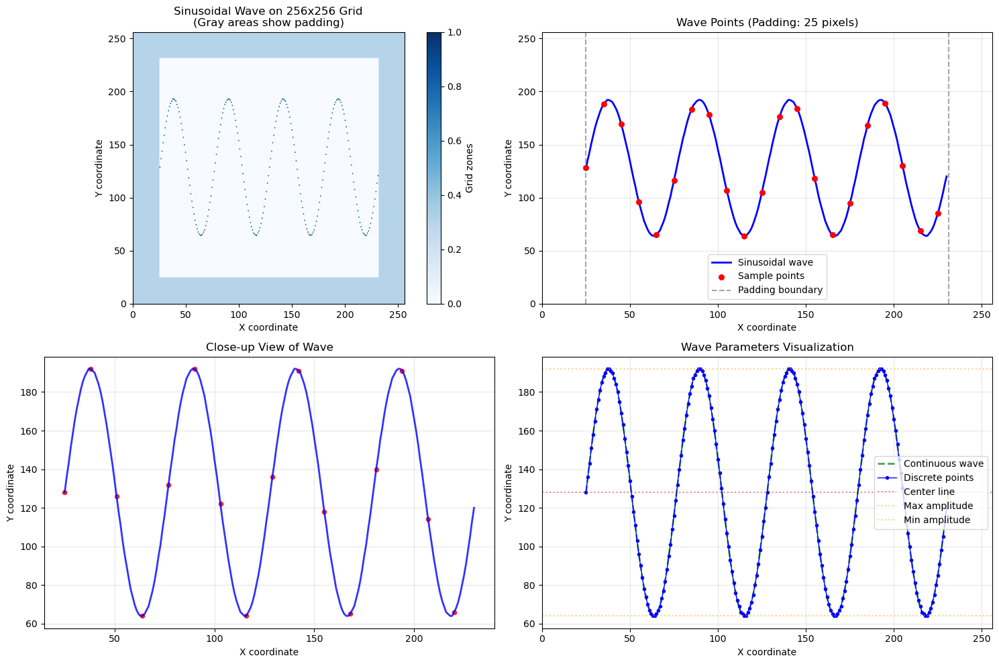

In [34]:
# Example usage with default parameters
print("=== Creating sinusoidal wave with default parameters ===")
wave_points, grid = cluster.create_sinusoidal_wave()


=== Example 1: More cycles, smaller amplitude, more padding ===
Created 180 points on sinusoidal wave
Grid size: 256x256
Padding: 38 pixels on each side
Effective wave area: 180x256
Number of cycles: 8
X range: 38 to 217
Y range: 90 to 166
Amplitude: 38.4 pixels
First 5 points: [[ 38 128]
 [ 39 139]
 [ 40 148]
 [ 41 157]
 [ 42 163]]


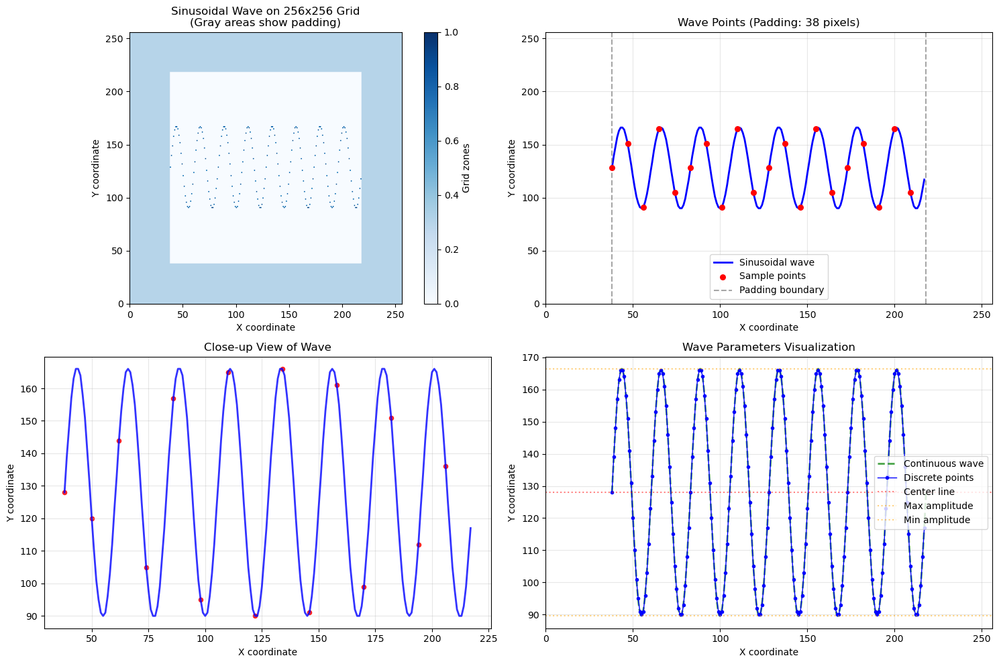

In [35]:
# Example 1: Wave with more cycles and different amplitude
print("\n=== Example 1: More cycles, smaller amplitude, more padding ===")
wave_points_1, grid_1 = cluster.create_sinusoidal_wave(
    grid_size=256,
    num_cycles=8,           # More cycles
    amplitude_ratio=0.15,   # Smaller amplitude
    padding_ratio=0.15,     # More padding
    plot=True
)


=== Example 2: Phase shifted wave, off-center positioning ===
Created 232 points on sinusoidal wave
Grid size: 256x256
Padding: 12 pixels on each side
Effective wave area: 232x256
Number of cycles: 3
X range: 12 to 243
Y range: 0 to 154
Amplitude: 76.8 pixels
First 5 points: [[ 12 131]
 [ 13 135]
 [ 14 139]
 [ 15 143]
 [ 16 146]]


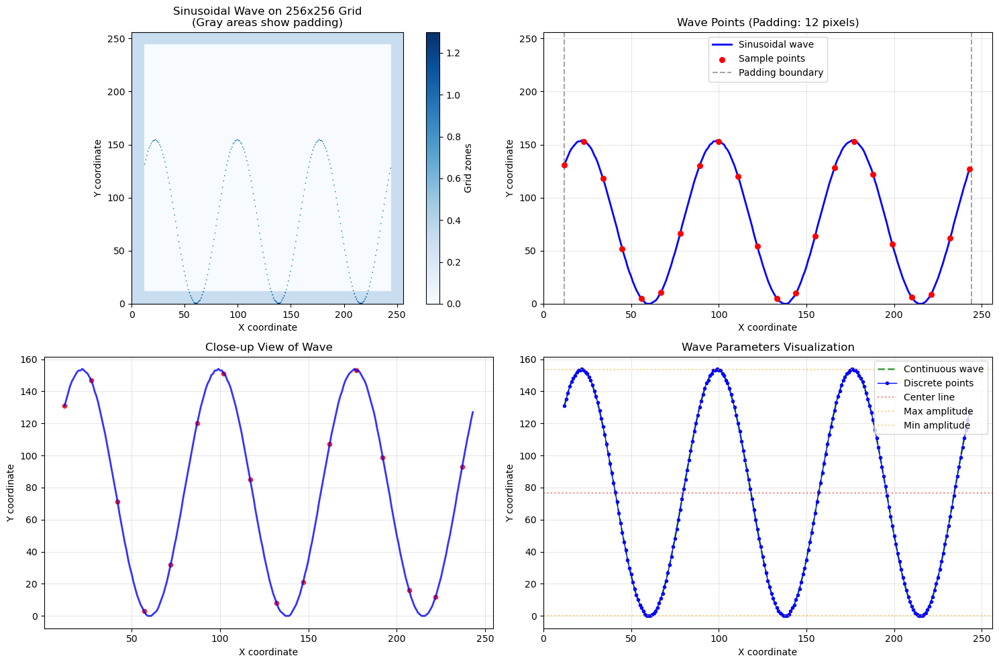


=== Example 3: Comparison of different configurations (no individual plots) ===
Created 104 points on sinusoidal wave
Grid size: 128x128
Padding: 12 pixels on each side
Effective wave area: 104x128
Number of cycles: 2
X range: 12 to 115
Y range: 38 to 90
Amplitude: 25.6 pixels
First 5 points: [[12 64]
 [13 67]
 [14 70]
 [15 73]
 [16 76]]
Created 90 points on sinusoidal wave
Grid size: 128x128
Padding: 19 pixels on each side
Effective wave area: 90x128
Number of cycles: 6
X range: 19 to 108
Y range: 45 to 83
Amplitude: 19.2 pixels
First 5 points: [[19 83]
 [20 82]
 [21 77]
 [22 70]
 [23 62]]
Created 116 points on sinusoidal wave
Grid size: 128x128
Padding: 6 pixels on each side
Effective wave area: 116x128
Number of cycles: 4
X range: 6 to 121
Y range: 58 to 122
Amplitude: 32.0 pixels
First 5 points: [[  6  90]
 [  7  96]
 [  8 103]
 [  9 109]
 [ 10 114]]


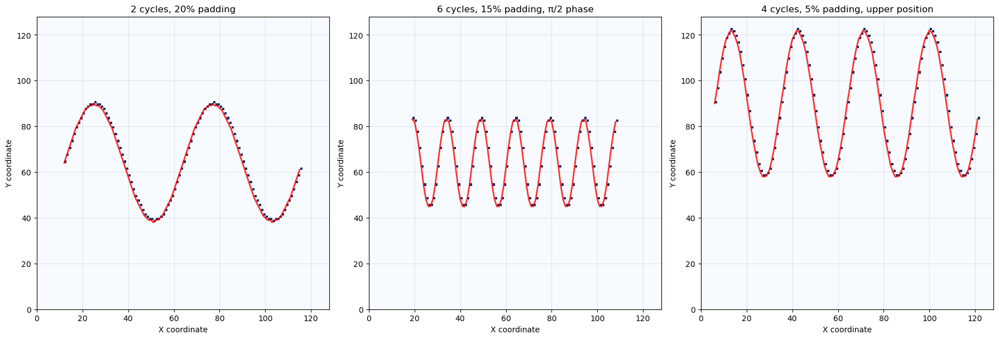

In [36]:
# Example 2: Wave with phase shift and different positioning
print("\n=== Example 2: Phase shifted wave, off-center positioning ===")
wave_points_2, grid_2 = cluster.create_sinusoidal_wave(
    grid_size=256,
    num_cycles=3,               # Fewer cycles
    amplitude_ratio=0.3,        # Larger amplitude
    vertical_offset_ratio=0.3,  # Position lower in grid
    padding_ratio=0.05,         # Minimal padding
    phase_shift=np.pi/4,        # 45-degree phase shift
    plot=True
)

# Example 3: Compare different wave configurations side by side
print("\n=== Example 3: Comparison of different configurations (no individual plots) ===")

# Create three different waves without individual plots
wave_a, grid_a = cluster.create_sinusoidal_wave(grid_size=128, num_cycles=2, amplitude_ratio=0.2, 
                                       padding_ratio=0.1, plot=False)
wave_b, grid_b = cluster.create_sinusoidal_wave(grid_size=128, num_cycles=6, amplitude_ratio=0.15, 
                                       padding_ratio=0.15, phase_shift=np.pi/2, plot=False)
wave_c, grid_c = cluster.create_sinusoidal_wave(grid_size=128, num_cycles=4, amplitude_ratio=0.25, 
                                       vertical_offset_ratio=0.7, padding_ratio=0.05, plot=False)

# Plot all three for comparison
fig, axes = plt.subplots(1, 3, figsize=(18, 6))

configurations = [
    (grid_a, wave_a, "2 cycles, 20% padding"),
    (grid_b, wave_b, "6 cycles, 15% padding, π/2 phase"),
    (grid_c, wave_c, "4 cycles, 5% padding, upper position")
]

for i, (grid, wave, title) in enumerate(configurations):
    axes[i].imshow(grid, cmap='Blues', origin='lower', extent=[0, 128, 0, 128])
    axes[i].plot(wave[:, 0], wave[:, 1], 'r-', linewidth=2, alpha=0.8)
    axes[i].set_title(title)
    axes[i].set_xlabel('X coordinate')
    axes[i].set_ylabel('Y coordinate')
    axes[i].grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

Created 206 points on sinusoidal wave
Grid size: 256x256
Padding: 25 pixels on each side
Effective wave area: 206x256
Number of cycles: 3
X range: 25 to 230
Y range: 102 to 154
Amplitude: 25.6 pixels
First 5 points: [[ 25 128]
 [ 26 130]
 [ 27 133]
 [ 28 135]
 [ 29 137]]


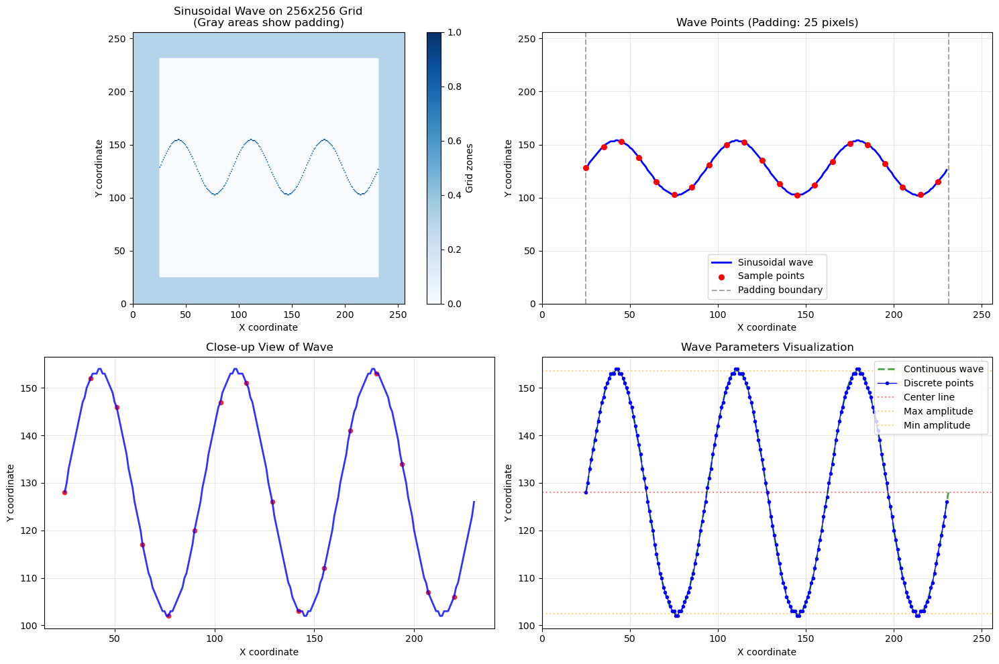

Created 206 points on sinusoidal wave
Grid size: 256x256
Padding: 25 pixels on each side
Effective wave area: 206x256
Number of cycles: 3
X range: 25 to 230
Y range: 102 to 154
Amplitude: 25.6 pixels
First 5 points: [[ 25 128]
 [ 26 130]
 [ 27 133]
 [ 28 135]
 [ 29 137]]


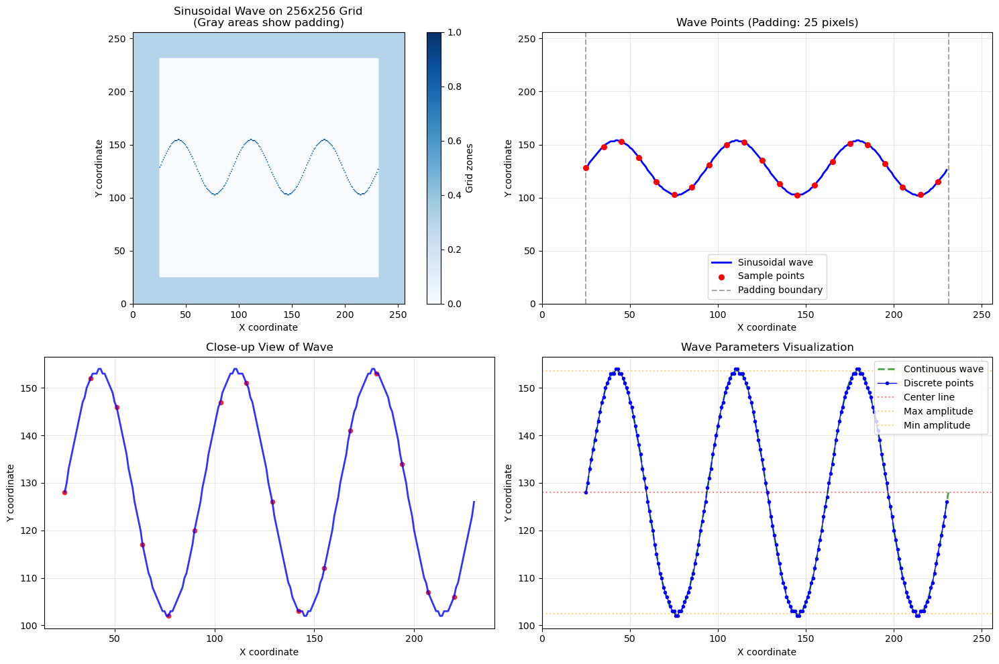

In [37]:
# grid_size=256, num_cycles=4, amplitude_ratio=0.25, 
# vertical_offset_ratio=0.5, padding_ratio=0.1, 
# phase_shift=0, plot=True
wave_points, grid = cluster.create_sinusoidal_wave(grid_size=256, num_cycles=3, amplitude_ratio=0.1,
                                           vertical_offset_ratio=0.5, padding_ratio=0.1,
                                           phase_shift=0, plot=True)

wave_points, grid = cluster.create_sinusoidal_wave(grid_size=256, num_cycles=3, amplitude_ratio=0.1,
                                           vertical_offset_ratio=0.5, padding_ratio=0.1,
                                           phase_shift=0, plot=True)

## Compare point correspondences

=== Creating two waves for correspondence demonstration ===
Created 160 points on sinusoidal wave
Grid size: 200x200
Padding: 20 pixels on each side
Effective wave area: 160x200
Number of cycles: 3
X range: 20 to 179
Y range: 20 to 100
Amplitude: 40.0 pixels
First 5 points: [[20 60]
 [21 65]
 [22 69]
 [23 74]
 [24 78]]
Created 160 points on sinusoidal wave
Grid size: 200x200
Padding: 20 pixels on each side
Effective wave area: 160x200
Number of cycles: 3
X range: 20 to 179
Y range: 100 to 180
Amplitude: 40.0 pixels
First 5 points: [[ 20 175]
 [ 21 177]
 [ 22 178]
 [ 23 179]
 [ 24 180]]
Plotted 160 point correspondences
Set 1 - X range: [20.0, 179.0], Y range: [20.0, 100.0]
Set 2 - X range: [20.0, 179.0], Y range: [100.0, 180.0]
Correspondence distances - Mean: 80.00, Std: 28.27, Max: 120.00


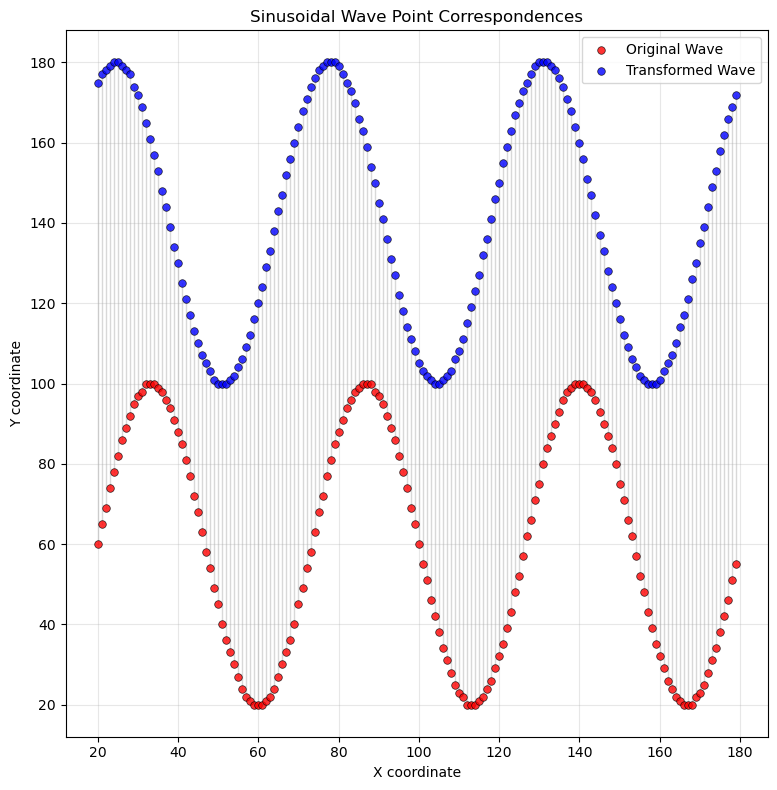

(<Figure size 1200x800 with 1 Axes>,
 <Axes: title={'center': 'Sinusoidal Wave Point Correspondences'}, xlabel='X coordinate', ylabel='Y coordinate'>)

In [38]:
# Example: Create two sinusoidal waves and show correspondences
print("=== Creating two waves for correspondence demonstration ===")

# Create first wave (original)
wave1_points, _ = cluster.create_sinusoidal_wave(grid_size=200, num_cycles=3, amplitude_ratio=0.2,
                                        vertical_offset_ratio=0.3, padding_ratio=0.1,
                                        phase_shift=0, plot=False)

# Create second wave (transformed - phase shifted and vertically offset)
wave2_points, _ = cluster.create_sinusoidal_wave(grid_size=200, num_cycles=3, amplitude_ratio=0.2,
                                        vertical_offset_ratio=0.7, padding_ratio=0.1,
                                        phase_shift=np.pi/3, plot=False)

# Plot the correspondences
cluster.plot_point_correspondences(wave1_points, wave2_points, 
                          labels=('Original Wave', 'Transformed Wave'),
                          colors=('red', 'blue'),
                          title='Sinusoidal Wave Point Correspondences',
                          show_indices=False)


=== Example 2: Random point correspondences ===
Plotted 20 point correspondences
Set 1 - X range: [2.1, 96.6], Y range: [4.6, 97.0]
Set 2 - X range: [-7.5, 95.8], Y range: [-4.0, 108.5]
Correspondence distances - Mean: 11.65, Std: 4.54, Max: 19.71


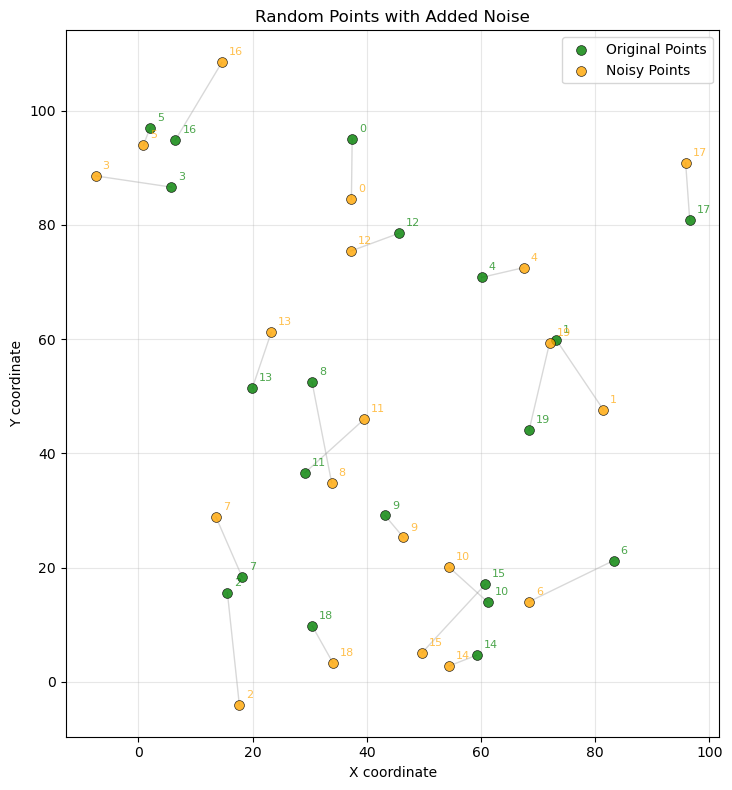


=== Example 3: Circle to ellipse transformation ===
Plotted 30 point correspondences
Set 1 - X range: [50.0, 150.0], Y range: [50.3, 149.7]
Set 2 - X range: [82.8, 217.2], Y range: [51.8, 148.2]
Correspondence distances - Mean: 58.73, Std: 14.59, Max: 83.64


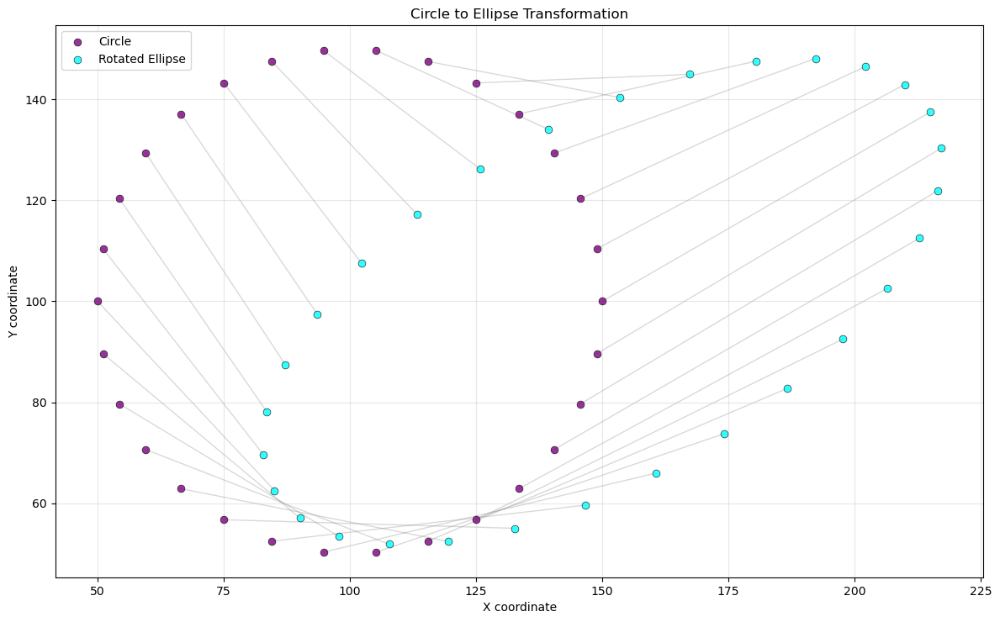


=== Example 4: Subset correspondences (every 5th point) ===
Plotted 32 point correspondences
Set 1 - X range: [20.0, 175.0], Y range: [20.0, 100.0]
Set 2 - X range: [20.0, 175.0], Y range: [100.0, 180.0]
Correspondence distances - Mean: 80.00, Std: 28.29, Max: 120.00


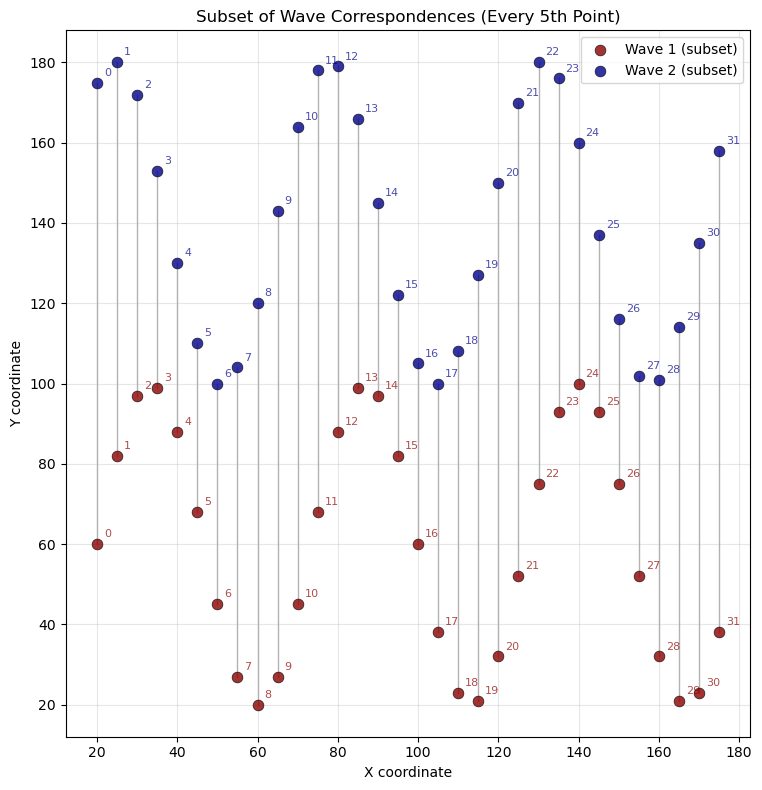

(<Figure size 1200x800 with 1 Axes>,
 <Axes: title={'center': 'Subset of Wave Correspondences (Every 5th Point)'}, xlabel='X coordinate', ylabel='Y coordinate'>)

In [39]:
# Example 2: Create random point sets and show correspondences
print("\n=== Example 2: Random point correspondences ===")
np.random.seed(42)  # For reproducibility

# Generate random points
n_points = 20
random_points1 = np.random.rand(n_points, 2) * 100
random_points2 = random_points1 + np.random.normal(0, 10, (n_points, 2))  # Add noise

cluster.plot_point_correspondences(random_points1, random_points2,
                          labels=('Original Points', 'Noisy Points'),
                          colors=('green', 'orange'),
                          title='Random Points with Added Noise',
                          show_indices=True,  # Show indices for smaller set
                          point_size=50)

# Example 3: Circle to ellipse transformation
print("\n=== Example 3: Circle to ellipse transformation ===")

# Create points on a circle
theta = np.linspace(0, 2*np.pi, 30, endpoint=False)
circle_points = np.column_stack([50 * np.cos(theta) + 100, 
                                50 * np.sin(theta) + 100])

# Transform to ellipse (stretch and rotate)
stretch_x, stretch_y = 1.5, 0.7
angle = np.pi/6
cos_a, sin_a = np.cos(angle), np.sin(angle)

ellipse_points = np.zeros_like(circle_points)
for i, (x, y) in enumerate(circle_points - [100, 100]):  # Center at origin
    # Apply stretching
    x_stretched = x * stretch_x
    y_stretched = y * stretch_y
    # Apply rotation
    ellipse_points[i, 0] = x_stretched * cos_a - y_stretched * sin_a + 150  # Offset
    ellipse_points[i, 1] = x_stretched * sin_a + y_stretched * cos_a + 100

cluster.plot_point_correspondences(circle_points, ellipse_points,
                          labels=('Circle', 'Rotated Ellipse'),
                          colors=('purple', 'cyan'),
                          title='Circle to Ellipse Transformation',
                          show_indices=False,
                          point_size=40)

# Example 4: Show subset of correspondences with different sampling
print("\n=== Example 4: Subset correspondences (every 5th point) ===")

# Use every 5th point from the wave examples
subset_indices = np.arange(0, len(wave1_points), 5)
wave1_subset = wave1_points[subset_indices]
wave2_subset = wave2_points[subset_indices]

cluster.plot_point_correspondences(wave1_subset, wave2_subset,
                          labels=('Wave 1 (subset)', 'Wave 2 (subset)'),
                          colors=('darkred', 'darkblue'),
                          title='Subset of Wave Correspondences (Every 5th Point)',
                          show_indices=True,
                          point_size=60,
                          line_alpha=0.6)

## Register the points

Created 160 points on sinusoidal wave
Grid size: 200x200
Padding: 20 pixels on each side
Effective wave area: 160x200
Number of cycles: 3
X range: 20 to 179
Y range: 20 to 100
Amplitude: 40.0 pixels
First 5 points: [[20 60]
 [21 65]
 [22 69]
 [23 74]
 [24 78]]
Created 160 points on sinusoidal wave
Grid size: 200x200
Padding: 20 pixels on each side
Effective wave area: 160x200
Number of cycles: 3
X range: 20 to 179
Y range: 100 to 180
Amplitude: 40.0 pixels
First 5 points: [[ 20 175]
 [ 21 177]
 [ 22 178]
 [ 23 179]
 [ 24 180]]


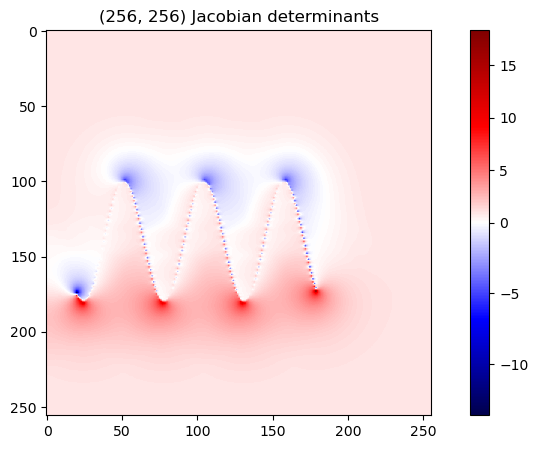

In [40]:
# Create first wave (original)
wave1_points, _ = cluster.create_sinusoidal_wave(grid_size=200, num_cycles=3, amplitude_ratio=0.2,
                                        vertical_offset_ratio=0.3, padding_ratio=0.1,
                                        phase_shift=0, plot=False)

# Create second wave (transformed - phase shifted and vertically offset)
wave2_points, _ = cluster.create_sinusoidal_wave(grid_size=200, num_cycles=3, amplitude_ratio=0.2,
                                        vertical_offset_ratio=0.7, padding_ratio=0.1,
                                        phase_shift=np.pi/3, plot=False)

# Swap columns to match expected format (x, y)
wave1_points = wave1_points[:, [1, 0]]  # Swap to (y, x) format
wave2_points = wave2_points[:, [1, 0]]  # Swap to (y, x) format 

# Add 0s on the first axis
wave1_points = np.pad(wave1_points, ((0, 0), (1, 0)), mode='constant', constant_values=0)
wave2_points = np.pad(wave2_points, ((0, 0), (1, 0)), mode='constant', constant_values=0)


resolution = (256, 256)  # Example resolution for the data
#print(wave1_points)

d = Data(wave1_points, wave2_points, resolution)
d.show(fontsize=0, show_text=False, show_axis=False, show_correspondence=False, show_orientation=False)

=== Creating Double Helix Pattern ===
Created double helix with 206 points per wave
Grid size: 256x256
Padding: 25 pixels on each side
Number of cycles: 3
Phase offset: 3.142 radians (180.0 degrees)
Wave 1 - X range: [25, 230], Y range: [64, 192]
Wave 2 - X range: [25, 230], Y range: [64, 192]
Number of intersection points: 2


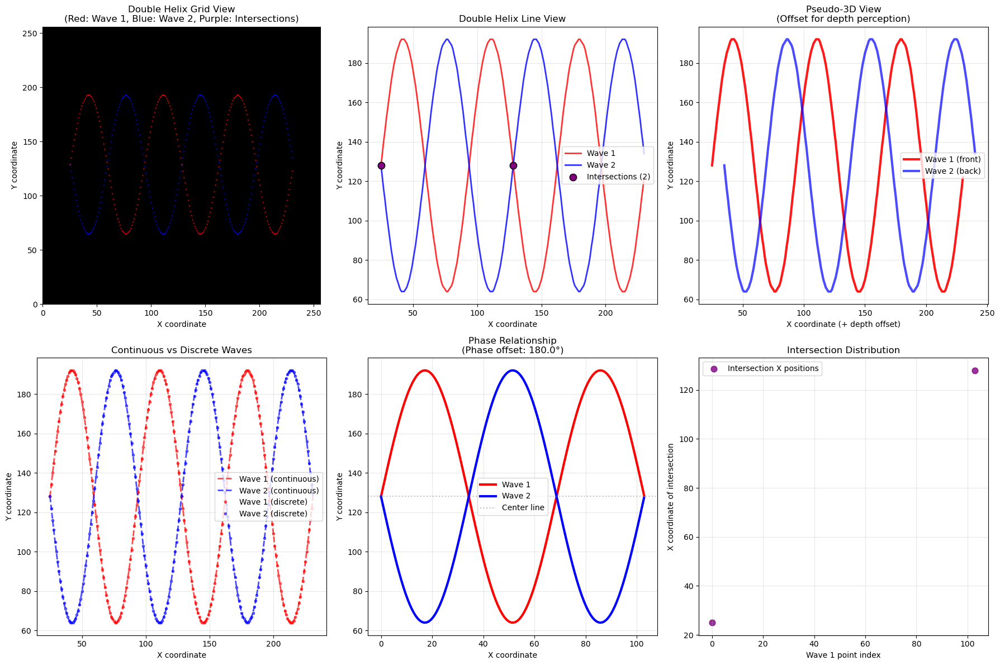

In [41]:
# Create double helix example
print("=== Creating Double Helix Pattern ===")
wave1, wave2, helix_grid = cluster.create_double_helix_waves(
    grid_size=256,
    num_cycles=3,
    amplitude_ratio=0.25,
    vertical_center_ratio=0.5,
    padding_ratio=0.1,
    phase_offset=np.pi,  # π radians = 180 degrees phase difference
    plot=True
)


=== Comparing Different Phase Offsets ===
Created double helix with 160 points per wave
Grid size: 200x200
Padding: 20 pixels on each side
Number of cycles: 2
Phase offset: 1.571 radians (90.0 degrees)
Wave 1 - X range: [20, 179], Y range: [40, 160]
Wave 2 - X range: [20, 179], Y range: [40, 160]
Number of intersection points: 4
Created double helix with 160 points per wave
Grid size: 200x200
Padding: 20 pixels on each side
Number of cycles: 2
Phase offset: 3.142 radians (180.0 degrees)
Wave 1 - X range: [20, 179], Y range: [40, 160]
Wave 2 - X range: [20, 179], Y range: [40, 160]
Number of intersection points: 4
Created double helix with 160 points per wave
Grid size: 200x200
Padding: 20 pixels on each side
Number of cycles: 2
Phase offset: 4.712 radians (270.0 degrees)
Wave 1 - X range: [20, 179], Y range: [40, 160]
Wave 2 - X range: [20, 179], Y range: [40, 160]
Number of intersection points: 4


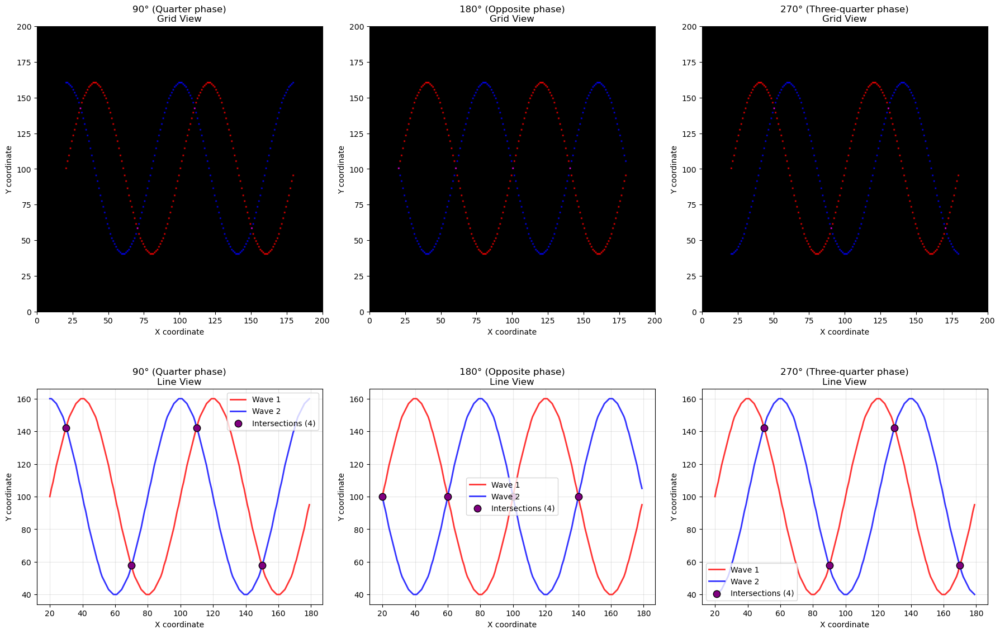


=== Creating Double Helix for Point Correspondence ===
Created double helix with 206 points per wave
Grid size: 256x256
Padding: 25 pixels on each side
Number of cycles: 3
Phase offset: 3.142 radians (180.0 degrees)
Wave 1 - X range: [25, 230], Y range: [77, 179]
Wave 2 - X range: [25, 230], Y range: [77, 179]
Number of intersection points: 2
Plotted 206 point correspondences
Set 1 - X range: [25.0, 230.0], Y range: [77.0, 179.0]
Set 2 - X range: [25.0, 230.0], Y range: [77.0, 179.0]
Correspondence distances - Mean: 65.20, Std: 31.53, Max: 102.00


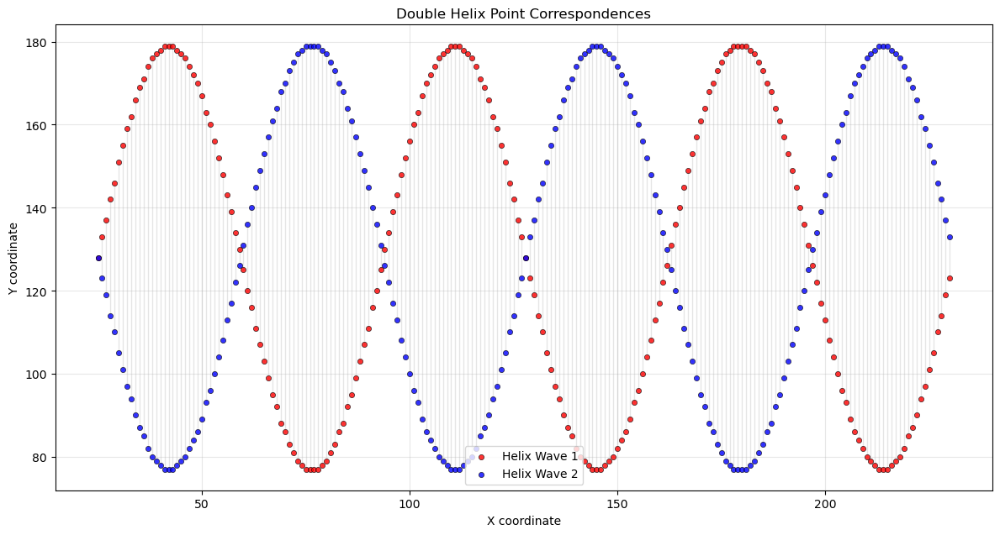

(<Figure size 1200x800 with 1 Axes>,
 <Axes: title={'center': 'Double Helix Point Correspondences'}, xlabel='X coordinate', ylabel='Y coordinate'>)

In [42]:
# Example: Different phase offsets to show various intersection patterns
print("\n=== Comparing Different Phase Offsets ===")

phase_offsets = [np.pi/2, np.pi, 3*np.pi/2]  # 90°, 180°, 270°
phase_names = ["90° (Quarter phase)", "180° (Opposite phase)", "270° (Three-quarter phase)"]

fig, axes = plt.subplots(2, 3, figsize=(18, 12))

for i, (phase, name) in enumerate(zip(phase_offsets, phase_names)):
    # Create waves with different phase offsets
    w1, w2, grid = cluster.create_double_helix_waves(
        grid_size=200, 
        num_cycles=2, 
        amplitude_ratio=0.3,
        phase_offset=phase, 
        plot=False
    )
    
    # Top row: Grid visualization
    ax_top = axes[0, i]
    display_grid = np.zeros((200, 200, 3))
    for x, y in w1:
        display_grid[y, x, 0] = 1.0  # Red
    for x, y in w2:
        display_grid[y, x, 2] = 1.0  # Blue
    
    ax_top.imshow(display_grid, origin='lower', extent=[0, 200, 0, 200])
    ax_top.set_title(f'{name}\nGrid View')
    ax_top.set_xlabel('X coordinate')
    ax_top.set_ylabel('Y coordinate')
    
    # Bottom row: Line plot
    ax_bottom = axes[1, i]
    ax_bottom.plot(w1[:, 0], w1[:, 1], 'r-', linewidth=2, label='Wave 1', alpha=0.8)
    ax_bottom.plot(w2[:, 0], w2[:, 1], 'b-', linewidth=2, label='Wave 2', alpha=0.8)
    
    # Find and mark intersections
    intersections = []
    for j, (x1, y1) in enumerate(w1):
        for k, (x2, y2) in enumerate(w2):
            if x1 == x2 and y1 == y2:
                intersections.append((x1, y1))
    
    if intersections:
        intersection_x, intersection_y = zip(*intersections)
        ax_bottom.scatter(intersection_x, intersection_y, c='purple', s=80, 
                         marker='o', label=f'Intersections ({len(intersections)})', 
                         zorder=5, edgecolors='black')
    
    ax_bottom.set_title(f'{name}\nLine View')
    ax_bottom.set_xlabel('X coordinate')
    ax_bottom.set_ylabel('Y coordinate')
    ax_bottom.legend()
    ax_bottom.grid(True, alpha=0.3)
    ax_bottom.set_aspect('equal', adjustable='box')

plt.tight_layout()
plt.show()

# Create a specific double helix for correspondence analysis
print("\n=== Creating Double Helix for Point Correspondence ===")
helix_wave1, helix_wave2, _ = cluster.create_double_helix_waves(
    grid_size=256,
    num_cycles=3,
    amplitude_ratio=0.2,
    phase_offset=np.pi,  # 180 degrees for maximum separation
    padding_ratio=0.1,
    plot=False
)

# Plot the correspondences between the two helical waves
cluster.plot_point_correspondences(helix_wave1, helix_wave2,
                          labels=('Helix Wave 1', 'Helix Wave 2'),
                          colors=('red', 'blue'),
                          title='Double Helix Point Correspondences',
                          show_indices=False,
                          line_alpha=0.2,  # More transparent lines to show the pattern better
                          point_size=20)

# Correspondence density comparison

## Full double-helix


=== Creating Double Helix for Point Correspondence ===

=== Resolution / 1 ===
Created double helix with 206 points per wave
Grid size: 256x256
Padding: 25 pixels on each side
Number of cycles: 2
Phase offset: 3.142 radians (180.0 degrees)
Wave 1 - X range: [25, 230], Y range: [120, 136]
Wave 2 - X range: [25, 230], Y range: [120, 136]
Number of intersection points: 10
Plotted 206 point correspondences
Set 1 - X range: [25.0, 230.0], Y range: [120.0, 136.0]
Set 2 - X range: [25.0, 230.0], Y range: [120.0, 136.0]
Correspondence distances - Mean: 9.79, Std: 4.83, Max: 16.00


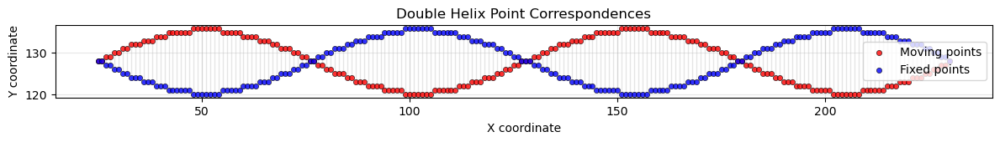

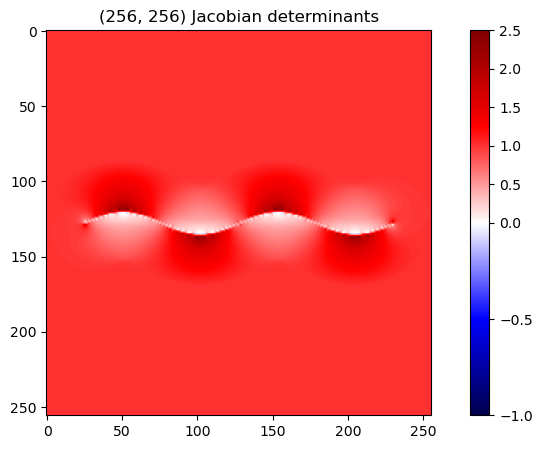

Minimum Jacobian determinant: -0.20
Number of negative Jacobian determinants: 52

=== Resolution / 2 ===
Created double helix with 206 points per wave
Grid size: 256x256
Padding: 25 pixels on each side
Number of cycles: 2
Phase offset: 3.142 radians (180.0 degrees)
Wave 1 - X range: [25, 230], Y range: [120, 136]
Wave 2 - X range: [25, 230], Y range: [120, 136]
Number of intersection points: 10
Plotted 103 point correspondences
Set 1 - X range: [25.0, 229.0], Y range: [120.0, 136.0]
Set 2 - X range: [25.0, 229.0], Y range: [120.0, 136.0]
Correspondence distances - Mean: 9.79, Std: 4.83, Max: 16.00


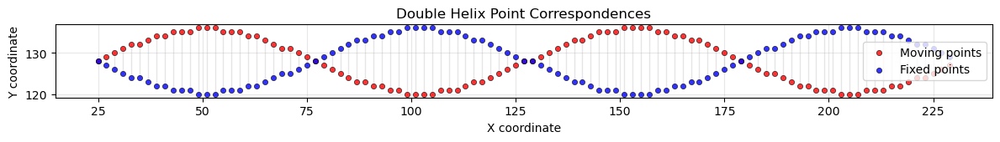

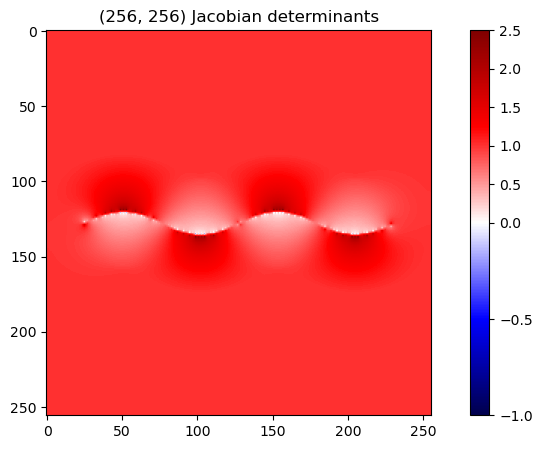

Minimum Jacobian determinant: -0.21
Number of negative Jacobian determinants: 24

=== Resolution / 3 ===
Created double helix with 206 points per wave
Grid size: 256x256
Padding: 25 pixels on each side
Number of cycles: 2
Phase offset: 3.142 radians (180.0 degrees)
Wave 1 - X range: [25, 230], Y range: [120, 136]
Wave 2 - X range: [25, 230], Y range: [120, 136]
Number of intersection points: 10
Plotted 69 point correspondences
Set 1 - X range: [25.0, 229.0], Y range: [120.0, 136.0]
Set 2 - X range: [25.0, 229.0], Y range: [120.0, 136.0]
Correspondence distances - Mean: 9.80, Std: 4.88, Max: 16.00


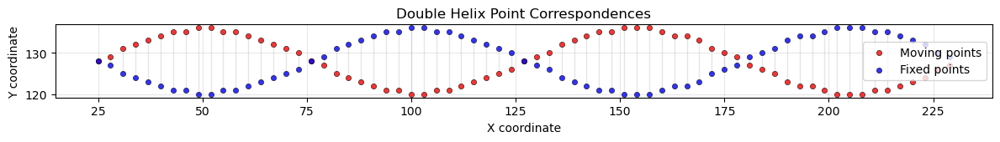

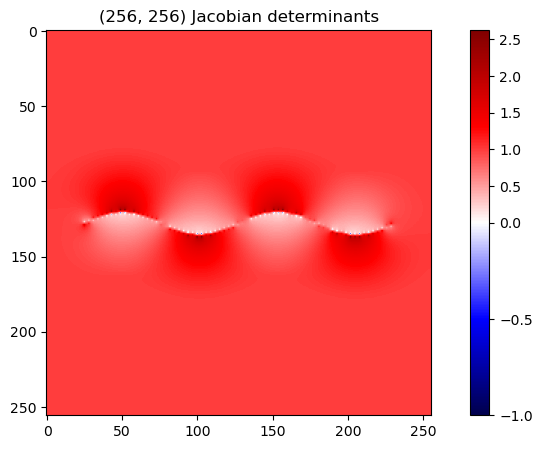

Minimum Jacobian determinant: -0.35
Number of negative Jacobian determinants: 22

=== Resolution / 4 ===
Created double helix with 206 points per wave
Grid size: 256x256
Padding: 25 pixels on each side
Number of cycles: 2
Phase offset: 3.142 radians (180.0 degrees)
Wave 1 - X range: [25, 230], Y range: [120, 136]
Wave 2 - X range: [25, 230], Y range: [120, 136]
Number of intersection points: 10
Plotted 52 point correspondences
Set 1 - X range: [25.0, 229.0], Y range: [120.0, 136.0]
Set 2 - X range: [25.0, 229.0], Y range: [120.0, 136.0]
Correspondence distances - Mean: 9.69, Std: 4.91, Max: 16.00


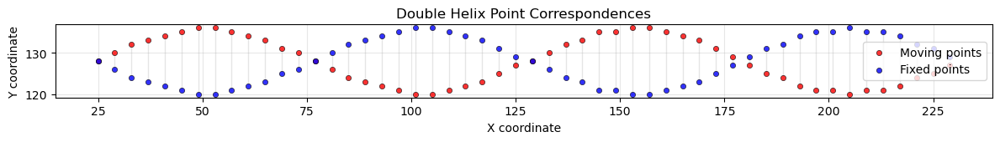

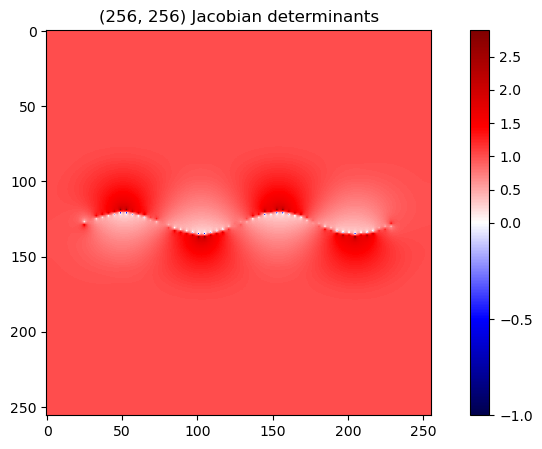

Minimum Jacobian determinant: -0.60
Number of negative Jacobian determinants: 28

=== Resolution / 5 ===
Created double helix with 206 points per wave
Grid size: 256x256
Padding: 25 pixels on each side
Number of cycles: 2
Phase offset: 3.142 radians (180.0 degrees)
Wave 1 - X range: [25, 230], Y range: [120, 136]
Wave 2 - X range: [25, 230], Y range: [120, 136]
Number of intersection points: 10
Plotted 42 point correspondences
Set 1 - X range: [25.0, 230.0], Y range: [120.0, 136.0]
Set 2 - X range: [25.0, 230.0], Y range: [120.0, 136.0]
Correspondence distances - Mean: 9.57, Std: 4.93, Max: 16.00


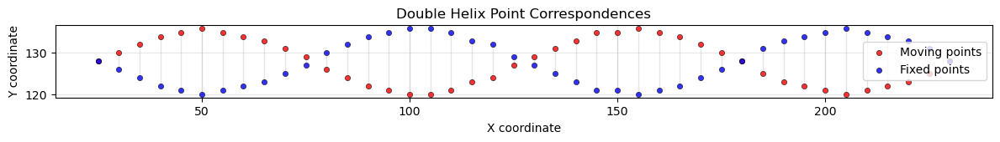

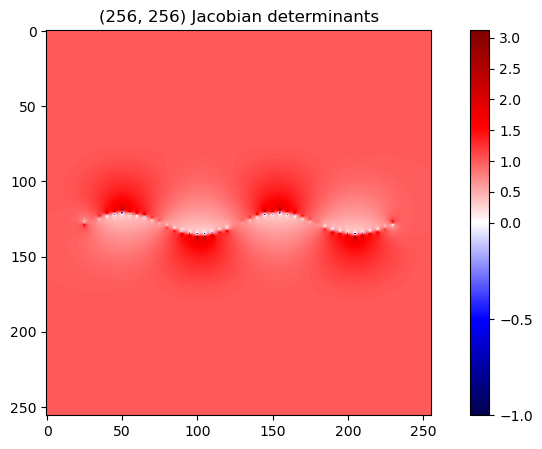

Minimum Jacobian determinant: -0.85
Number of negative Jacobian determinants: 29

=== Resolution / 6 ===
Created double helix with 206 points per wave
Grid size: 256x256
Padding: 25 pixels on each side
Number of cycles: 2
Phase offset: 3.142 radians (180.0 degrees)
Wave 1 - X range: [25, 230], Y range: [120, 136]
Wave 2 - X range: [25, 230], Y range: [120, 136]
Number of intersection points: 10
Plotted 35 point correspondences
Set 1 - X range: [25.0, 229.0], Y range: [120.0, 136.0]
Set 2 - X range: [25.0, 229.0], Y range: [120.0, 136.0]
Correspondence distances - Mean: 9.66, Std: 4.98, Max: 16.00


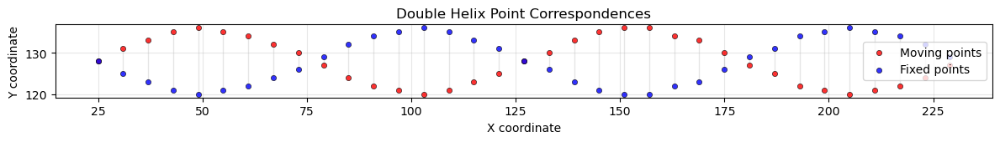

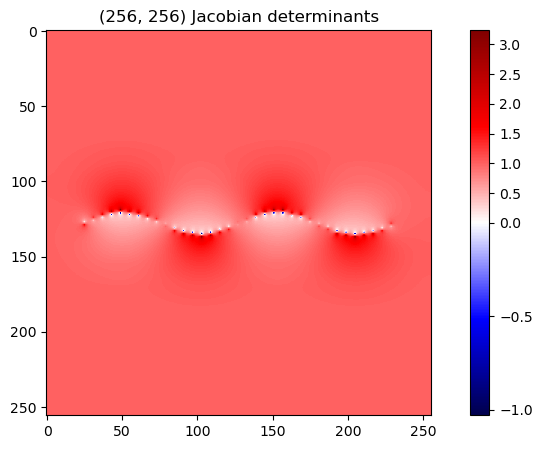

Minimum Jacobian determinant: -1.03
Number of negative Jacobian determinants: 28

=== Resolution / 7 ===
Created double helix with 206 points per wave
Grid size: 256x256
Padding: 25 pixels on each side
Number of cycles: 2
Phase offset: 3.142 radians (180.0 degrees)
Wave 1 - X range: [25, 230], Y range: [120, 136]
Wave 2 - X range: [25, 230], Y range: [120, 136]
Number of intersection points: 10
Plotted 30 point correspondences
Set 1 - X range: [25.0, 228.0], Y range: [120.0, 136.0]
Set 2 - X range: [25.0, 228.0], Y range: [120.0, 136.0]
Correspondence distances - Mean: 9.47, Std: 5.08, Max: 16.00


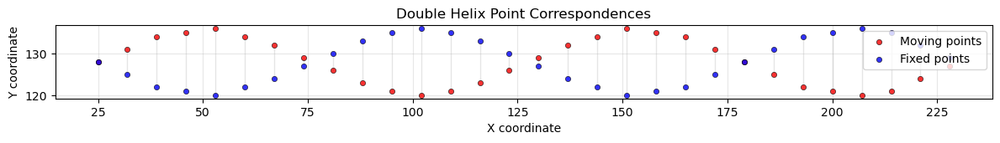

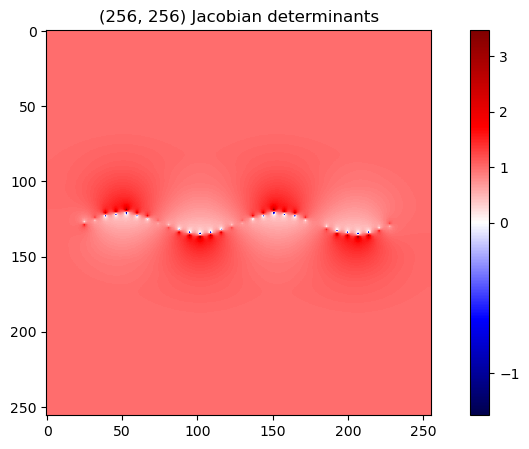

Minimum Jacobian determinant: -1.28
Number of negative Jacobian determinants: 26

=== Resolution / 8 ===
Created double helix with 206 points per wave
Grid size: 256x256
Padding: 25 pixels on each side
Number of cycles: 2
Phase offset: 3.142 radians (180.0 degrees)
Wave 1 - X range: [25, 230], Y range: [120, 136]
Wave 2 - X range: [25, 230], Y range: [120, 136]
Number of intersection points: 10
Plotted 26 point correspondences
Set 1 - X range: [25.0, 225.0], Y range: [120.0, 136.0]
Set 2 - X range: [25.0, 225.0], Y range: [120.0, 136.0]
Correspondence distances - Mean: 9.77, Std: 4.85, Max: 16.00


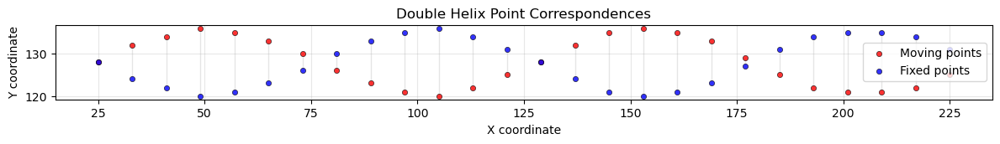

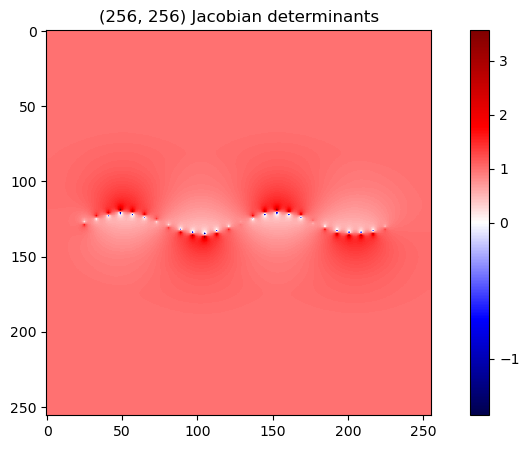

Minimum Jacobian determinant: -1.41
Number of negative Jacobian determinants: 27

=== Resolution / 9 ===
Created double helix with 206 points per wave
Grid size: 256x256
Padding: 25 pixels on each side
Number of cycles: 2
Phase offset: 3.142 radians (180.0 degrees)
Wave 1 - X range: [25, 230], Y range: [120, 136]
Wave 2 - X range: [25, 230], Y range: [120, 136]
Number of intersection points: 10
Plotted 23 point correspondences
Set 1 - X range: [25.0, 223.0], Y range: [120.0, 136.0]
Set 2 - X range: [25.0, 223.0], Y range: [120.0, 136.0]
Correspondence distances - Mean: 9.74, Std: 4.84, Max: 16.00


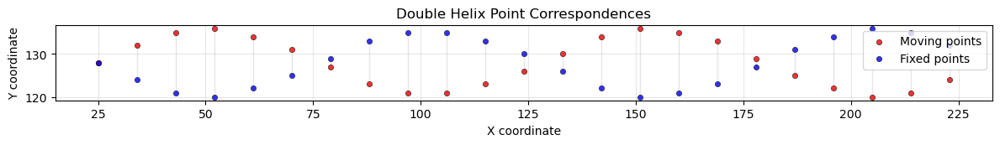

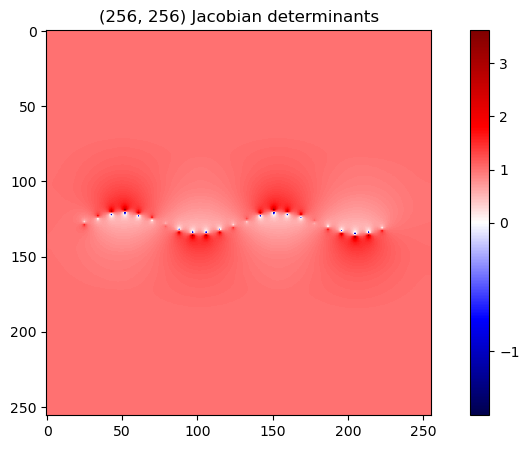

Minimum Jacobian determinant: -1.50
Number of negative Jacobian determinants: 26

=== Resolution / 10 ===
Created double helix with 206 points per wave
Grid size: 256x256
Padding: 25 pixels on each side
Number of cycles: 2
Phase offset: 3.142 radians (180.0 degrees)
Wave 1 - X range: [25, 230], Y range: [120, 136]
Wave 2 - X range: [25, 230], Y range: [120, 136]
Number of intersection points: 10
Plotted 21 point correspondences
Set 1 - X range: [25.0, 225.0], Y range: [120.0, 136.0]
Set 2 - X range: [25.0, 225.0], Y range: [120.0, 136.0]
Correspondence distances - Mean: 9.62, Std: 4.88, Max: 16.00


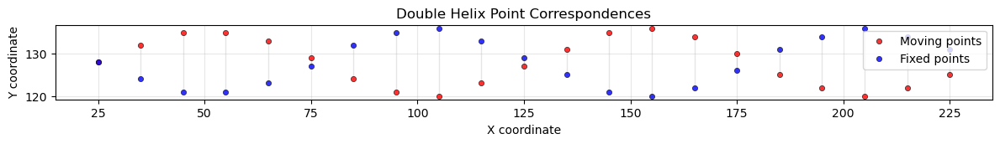

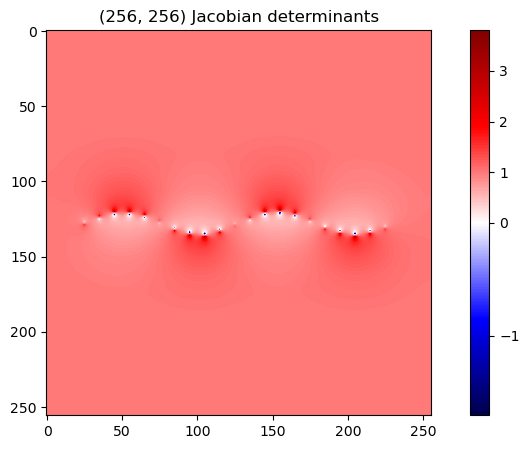

Minimum Jacobian determinant: -1.71
Number of negative Jacobian determinants: 26


In [6]:
# Create a specific double helix for correspondence analysis
print("\n=== Creating Double Helix for Point Correspondence ===")

resolution = (256, 256)  # Example resolution for the data
points_to_skip = [1, 2, 3, 4, 5, 6, 7, 8, 9, 10]  # Skip every nth point for better visualization

#####################################################################################################

for num_points_skip in points_to_skip:
    print(f"\n=== Resolution / {num_points_skip} ===")

    helix_wave1, helix_wave2, _ = cluster.create_double_helix_waves(
        grid_size=256,
        num_cycles=2,
        amplitude_ratio=0.03,
        phase_offset=np.pi,  # 180 degrees for maximum separation
        padding_ratio=0.1,
        plot=False
    )

    # Decrease point density for better visualization
    helix_wave1 = helix_wave1[::num_points_skip]  # Take every second point
    helix_wave2 = helix_wave2[::num_points_skip]  # Take every second point

    # Plot the correspondences between the two helical waves
    cluster.plot_point_correspondences(helix_wave1, helix_wave2,
                            labels=('Moving points', 'Fixed points'),
                            colors=('red', 'blue'),
                            title='Double Helix Point Correspondences',
                            show_indices=False,
                            line_alpha=0.2,  # More transparent lines to show the pattern better
                            point_size=20)

    # Swap columns to match expected format (x, y)
    helix_wave1 = helix_wave1[:, [1, 0]]  # Swap to (y, x) format
    helix_wave2 = helix_wave2[:, [1, 0]]  # Swap to (y, x) format 

    # Add 0s on the first axis to format for Data class
    helix_wave1 = np.pad(helix_wave1, ((0, 0), (1, 0)), mode='constant', constant_values=0)
    helix_wave2 = np.pad(helix_wave2, ((0, 0), (1, 0)), mode='constant', constant_values=0)

    # Run Laplacian
    d = Data(helix_wave1, helix_wave2, resolution)
    d.show(fontsize=0, show_text=False, show_axis=False, show_correspondence=False, show_orientation=False)
    print(f"Minimum Jacobian determinant: {d.min():.2f}")
    print(f"Number of negative Jacobian determinants: {d.count_negatives()}")

## Downwards cluster


=== Creating Double Helix for Point Correspondence ===

=== Resolution / 1 ===
Created double helix with 206 points per wave
Grid size: 256x256
Padding: 25 pixels on each side
Number of cycles: 2
Phase offset: 3.142 radians (180.0 degrees)
Wave 1 - X range: [25, 230], Y range: [120, 136]
Wave 2 - X range: [25, 230], Y range: [120, 136]
Number of intersection points: 10
Plotted 206 point correspondences
Set 1 - X range: [25.0, 230.0], Y range: [120.0, 136.0]
Set 2 - X range: [25.0, 230.0], Y range: [120.0, 136.0]
Correspondence distances - Mean: 9.79, Std: 4.83, Max: 16.00


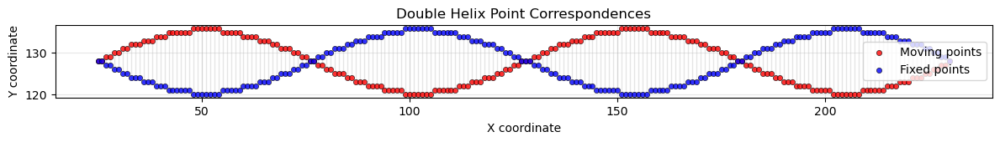

Analyzing 206 point pairs for directional clustering...
Clustering method: y_direction

Clustering Results (Y-direction (0=down, 1=up)):
Number of clusters: 2
Cluster 0: 98 points (indices: [2, 3, 4, 5, 6]...)
  Mean displacement: Z=0.000, Y=-10.286, X=0.000
  Std displacement:  Z=0.000, Y=4.408, X=0.000
Cluster 1: 108 points (indices: [0, 1, 51, 52, 53]...)
  Mean displacement: Z=0.000, Y=9.333, X=0.000
  Std displacement:  Z=0.000, Y=5.150, X=0.000


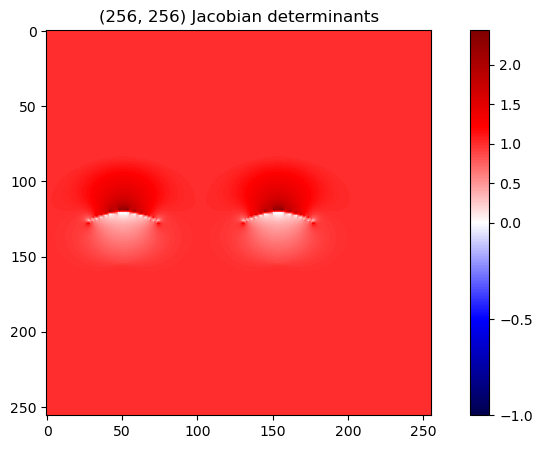

Minimum Jacobian determinant: -0.16
Number of negative Jacobian determinants: 20

=== Resolution / 2 ===
Created double helix with 206 points per wave
Grid size: 256x256
Padding: 25 pixels on each side
Number of cycles: 2
Phase offset: 3.142 radians (180.0 degrees)
Wave 1 - X range: [25, 230], Y range: [120, 136]
Wave 2 - X range: [25, 230], Y range: [120, 136]
Number of intersection points: 10
Plotted 103 point correspondences
Set 1 - X range: [25.0, 229.0], Y range: [120.0, 136.0]
Set 2 - X range: [25.0, 229.0], Y range: [120.0, 136.0]
Correspondence distances - Mean: 9.79, Std: 4.83, Max: 16.00


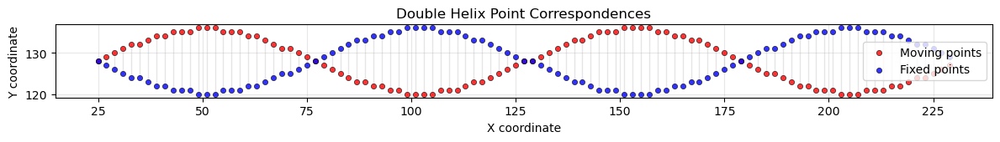

Analyzing 103 point pairs for directional clustering...
Clustering method: y_direction

Clustering Results (Y-direction (0=down, 1=up)):
Number of clusters: 2
Cluster 0: 49 points (indices: [1, 2, 3, 4, 5]...)
  Mean displacement: Z=0.000, Y=-10.286, X=0.000
  Std displacement:  Z=0.000, Y=4.408, X=0.000
Cluster 1: 54 points (indices: [0, 26, 27, 28, 29]...)
  Mean displacement: Z=0.000, Y=9.333, X=0.000
  Std displacement:  Z=0.000, Y=5.150, X=0.000


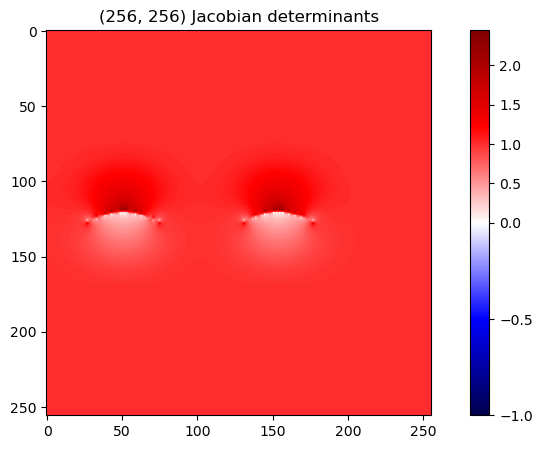

Minimum Jacobian determinant: -0.17
Number of negative Jacobian determinants: 10

=== Resolution / 3 ===
Created double helix with 206 points per wave
Grid size: 256x256
Padding: 25 pixels on each side
Number of cycles: 2
Phase offset: 3.142 radians (180.0 degrees)
Wave 1 - X range: [25, 230], Y range: [120, 136]
Wave 2 - X range: [25, 230], Y range: [120, 136]
Number of intersection points: 10
Plotted 69 point correspondences
Set 1 - X range: [25.0, 229.0], Y range: [120.0, 136.0]
Set 2 - X range: [25.0, 229.0], Y range: [120.0, 136.0]
Correspondence distances - Mean: 9.80, Std: 4.88, Max: 16.00


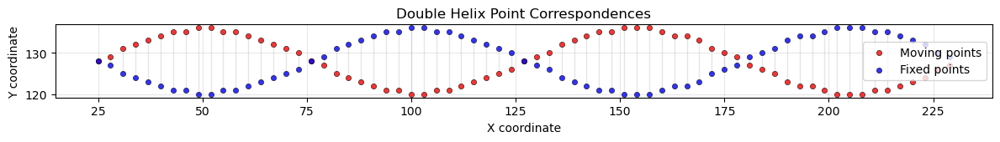

Analyzing 69 point pairs for directional clustering...
Clustering method: y_direction

Clustering Results (Y-direction (0=down, 1=up)):
Number of clusters: 2
Cluster 0: 33 points (indices: [1, 2, 3, 4, 5]...)
  Mean displacement: Z=0.000, Y=-10.242, X=0.000
  Std displacement:  Z=0.000, Y=4.506, X=0.000
Cluster 1: 36 points (indices: [0, 17, 18, 19, 20]...)
  Mean displacement: Z=0.000, Y=9.389, X=0.000
  Std displacement:  Z=0.000, Y=5.160, X=0.000


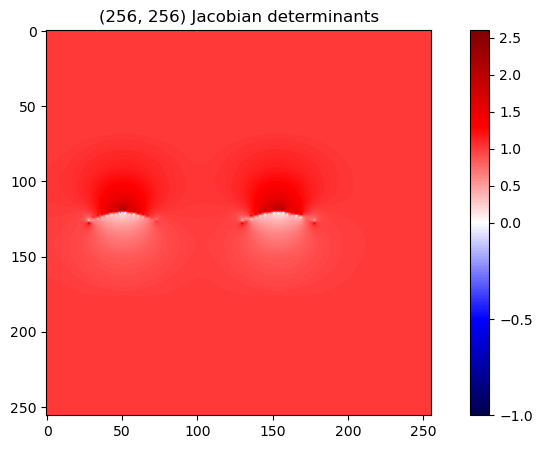

Minimum Jacobian determinant: -0.34
Number of negative Jacobian determinants: 10

=== Resolution / 4 ===
Created double helix with 206 points per wave
Grid size: 256x256
Padding: 25 pixels on each side
Number of cycles: 2
Phase offset: 3.142 radians (180.0 degrees)
Wave 1 - X range: [25, 230], Y range: [120, 136]
Wave 2 - X range: [25, 230], Y range: [120, 136]
Number of intersection points: 10
Plotted 52 point correspondences
Set 1 - X range: [25.0, 229.0], Y range: [120.0, 136.0]
Set 2 - X range: [25.0, 229.0], Y range: [120.0, 136.0]
Correspondence distances - Mean: 9.69, Std: 4.91, Max: 16.00


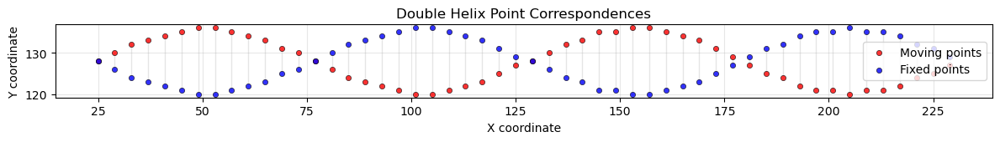

Analyzing 52 point pairs for directional clustering...
Clustering method: y_direction

Clustering Results (Y-direction (0=down, 1=up)):
Number of clusters: 2
Cluster 0: 24 points (indices: [1, 2, 3, 4, 5]...)
  Mean displacement: Z=0.000, Y=-10.500, X=0.000
  Std displacement:  Z=0.000, Y=4.291, X=0.000
Cluster 1: 28 points (indices: [0, 13, 14, 15, 16]...)
  Mean displacement: Z=0.000, Y=9.000, X=0.000
  Std displacement:  Z=0.000, Y=5.278, X=0.000


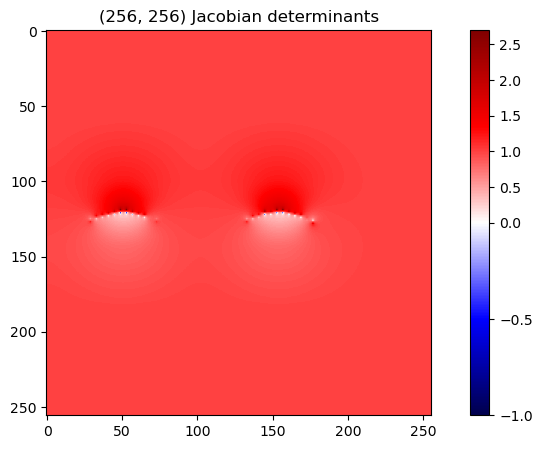

Minimum Jacobian determinant: -0.49
Number of negative Jacobian determinants: 9

=== Resolution / 5 ===
Created double helix with 206 points per wave
Grid size: 256x256
Padding: 25 pixels on each side
Number of cycles: 2
Phase offset: 3.142 radians (180.0 degrees)
Wave 1 - X range: [25, 230], Y range: [120, 136]
Wave 2 - X range: [25, 230], Y range: [120, 136]
Number of intersection points: 10
Plotted 42 point correspondences
Set 1 - X range: [25.0, 230.0], Y range: [120.0, 136.0]
Set 2 - X range: [25.0, 230.0], Y range: [120.0, 136.0]
Correspondence distances - Mean: 9.57, Std: 4.93, Max: 16.00


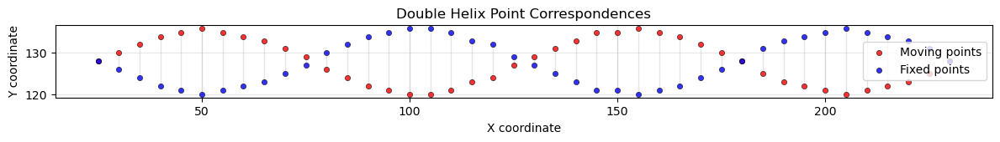

Analyzing 42 point pairs for directional clustering...
Clustering method: y_direction

Clustering Results (Y-direction (0=down, 1=up)):
Number of clusters: 2
Cluster 0: 20 points (indices: [1, 2, 3, 4, 5]...)
  Mean displacement: Z=0.000, Y=-9.900, X=0.000
  Std displacement:  Z=0.000, Y=4.493, X=0.000
Cluster 1: 22 points (indices: [0, 11, 12, 13, 14]...)
  Mean displacement: Z=0.000, Y=9.273, X=0.000
  Std displacement:  Z=0.000, Y=5.276, X=0.000


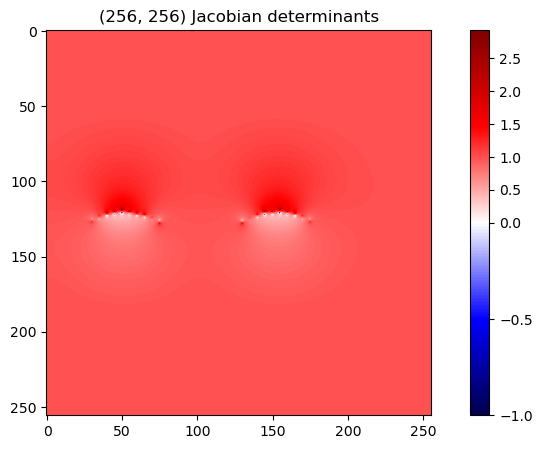

Minimum Jacobian determinant: -0.70
Number of negative Jacobian determinants: 9

=== Resolution / 6 ===
Created double helix with 206 points per wave
Grid size: 256x256
Padding: 25 pixels on each side
Number of cycles: 2
Phase offset: 3.142 radians (180.0 degrees)
Wave 1 - X range: [25, 230], Y range: [120, 136]
Wave 2 - X range: [25, 230], Y range: [120, 136]
Number of intersection points: 10
Plotted 35 point correspondences
Set 1 - X range: [25.0, 229.0], Y range: [120.0, 136.0]
Set 2 - X range: [25.0, 229.0], Y range: [120.0, 136.0]
Correspondence distances - Mean: 9.66, Std: 4.98, Max: 16.00


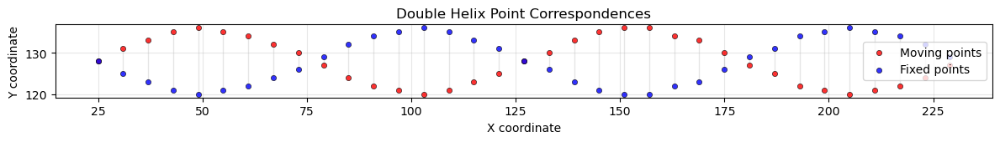

Analyzing 35 point pairs for directional clustering...
Clustering method: y_direction

Clustering Results (Y-direction (0=down, 1=up)):
Number of clusters: 2
Cluster 0: 16 points (indices: [1, 2, 3, 4, 5]...)
  Mean displacement: Z=0.000, Y=-10.625, X=0.000
  Std displacement:  Z=0.000, Y=4.226, X=0.000
Cluster 1: 19 points (indices: [0, 9, 10, 11, 12]...)
  Mean displacement: Z=0.000, Y=8.842, X=0.000
  Std displacement:  Z=0.000, Y=5.402, X=0.000


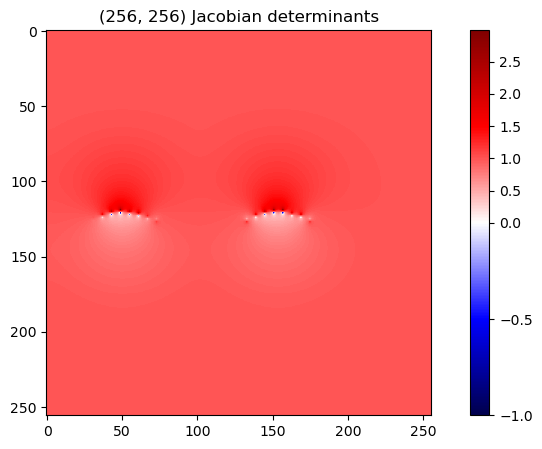

Minimum Jacobian determinant: -0.81
Number of negative Jacobian determinants: 8

=== Resolution / 7 ===
Created double helix with 206 points per wave
Grid size: 256x256
Padding: 25 pixels on each side
Number of cycles: 2
Phase offset: 3.142 radians (180.0 degrees)
Wave 1 - X range: [25, 230], Y range: [120, 136]
Wave 2 - X range: [25, 230], Y range: [120, 136]
Number of intersection points: 10
Plotted 30 point correspondences
Set 1 - X range: [25.0, 228.0], Y range: [120.0, 136.0]
Set 2 - X range: [25.0, 228.0], Y range: [120.0, 136.0]
Correspondence distances - Mean: 9.47, Std: 5.08, Max: 16.00


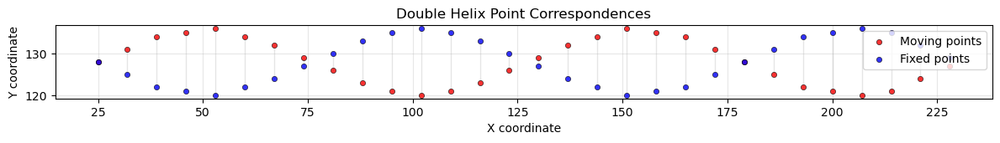

Analyzing 30 point pairs for directional clustering...
Clustering method: y_direction

Clustering Results (Y-direction (0=down, 1=up)):
Number of clusters: 2
Cluster 0: 14 points (indices: [1, 2, 3, 4, 5]...)
  Mean displacement: Z=0.000, Y=-10.000, X=0.000
  Std displacement:  Z=0.000, Y=4.536, X=0.000
Cluster 1: 16 points (indices: [0, 8, 9, 10, 11]...)
  Mean displacement: Z=0.000, Y=9.000, X=0.000
  Std displacement:  Z=0.000, Y=5.477, X=0.000


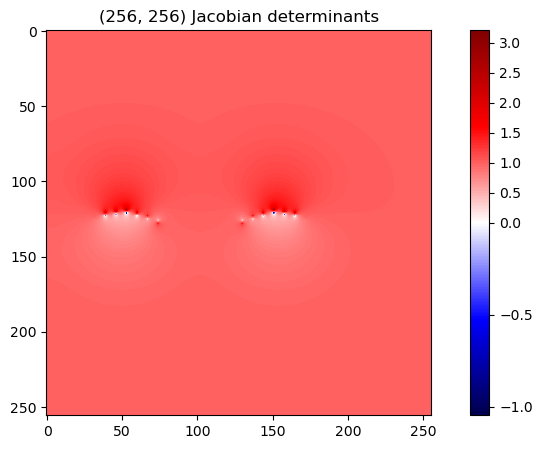

Minimum Jacobian determinant: -1.05
Number of negative Jacobian determinants: 10

=== Resolution / 8 ===
Created double helix with 206 points per wave
Grid size: 256x256
Padding: 25 pixels on each side
Number of cycles: 2
Phase offset: 3.142 radians (180.0 degrees)
Wave 1 - X range: [25, 230], Y range: [120, 136]
Wave 2 - X range: [25, 230], Y range: [120, 136]
Number of intersection points: 10
Plotted 26 point correspondences
Set 1 - X range: [25.0, 225.0], Y range: [120.0, 136.0]
Set 2 - X range: [25.0, 225.0], Y range: [120.0, 136.0]
Correspondence distances - Mean: 9.77, Std: 4.85, Max: 16.00


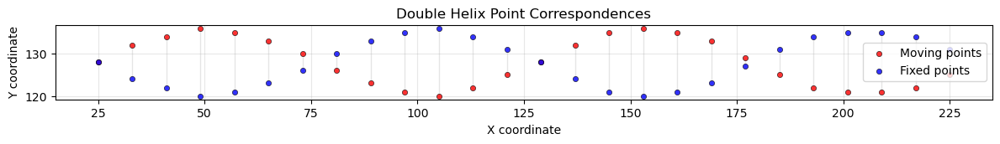

Analyzing 26 point pairs for directional clustering...
Clustering method: y_direction

Clustering Results (Y-direction (0=down, 1=up)):
Number of clusters: 2
Cluster 0: 12 points (indices: [1, 2, 3, 4, 5]...)
  Mean displacement: Z=0.000, Y=-10.667, X=0.000
  Std displacement:  Z=0.000, Y=4.346, X=0.000
Cluster 1: 14 points (indices: [0, 7, 8, 9, 10]...)
  Mean displacement: Z=0.000, Y=9.000, X=0.000
  Std displacement:  Z=0.000, Y=5.113, X=0.000


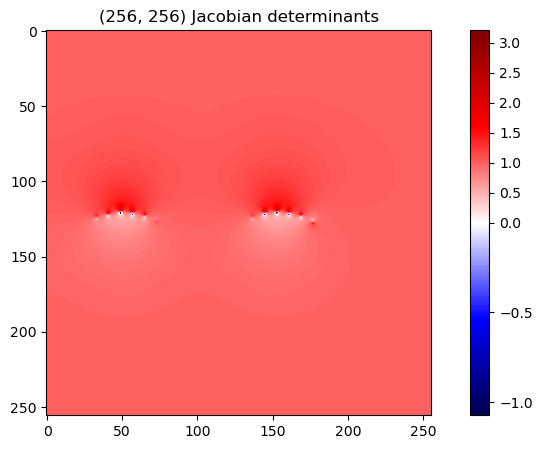

Minimum Jacobian determinant: -1.07
Number of negative Jacobian determinants: 10

=== Resolution / 9 ===
Created double helix with 206 points per wave
Grid size: 256x256
Padding: 25 pixels on each side
Number of cycles: 2
Phase offset: 3.142 radians (180.0 degrees)
Wave 1 - X range: [25, 230], Y range: [120, 136]
Wave 2 - X range: [25, 230], Y range: [120, 136]
Number of intersection points: 10
Plotted 23 point correspondences
Set 1 - X range: [25.0, 223.0], Y range: [120.0, 136.0]
Set 2 - X range: [25.0, 223.0], Y range: [120.0, 136.0]
Correspondence distances - Mean: 9.74, Std: 4.84, Max: 16.00


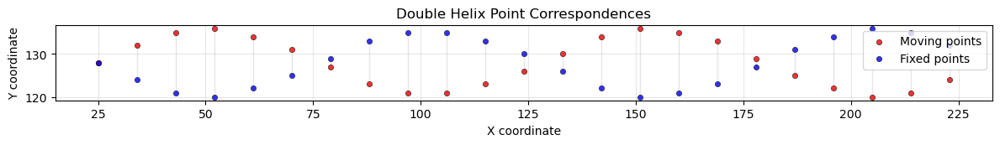

Analyzing 23 point pairs for directional clustering...
Clustering method: y_direction

Clustering Results (Y-direction (0=down, 1=up)):
Number of clusters: 2
Cluster 0: 11 points (indices: [1, 2, 3, 4, 5]...)
  Mean displacement: Z=0.000, Y=-10.364, X=0.000
  Std displacement:  Z=0.000, Y=4.578, X=0.000
Cluster 1: 12 points (indices: [0, 6, 7, 8, 9]...)
  Mean displacement: Z=0.000, Y=9.167, X=0.000
  Std displacement:  Z=0.000, Y=4.997, X=0.000


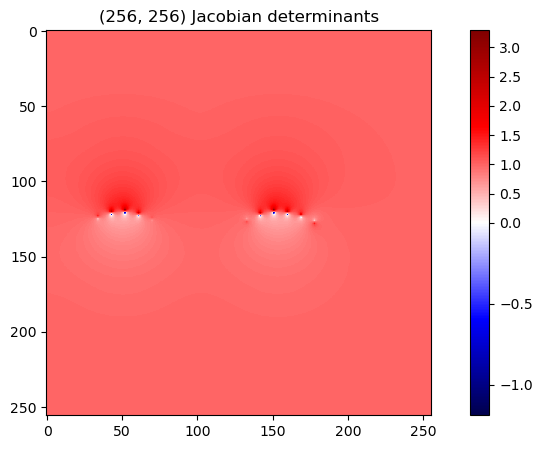

Minimum Jacobian determinant: -1.19
Number of negative Jacobian determinants: 9

=== Resolution / 10 ===
Created double helix with 206 points per wave
Grid size: 256x256
Padding: 25 pixels on each side
Number of cycles: 2
Phase offset: 3.142 radians (180.0 degrees)
Wave 1 - X range: [25, 230], Y range: [120, 136]
Wave 2 - X range: [25, 230], Y range: [120, 136]
Number of intersection points: 10
Plotted 21 point correspondences
Set 1 - X range: [25.0, 225.0], Y range: [120.0, 136.0]
Set 2 - X range: [25.0, 225.0], Y range: [120.0, 136.0]
Correspondence distances - Mean: 9.62, Std: 4.88, Max: 16.00


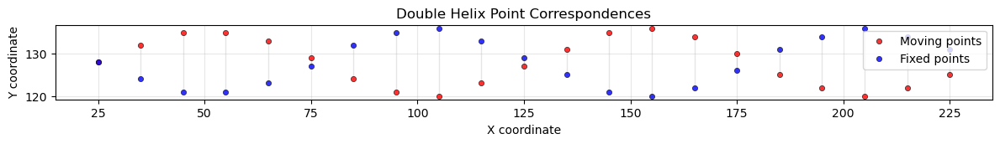

Analyzing 21 point pairs for directional clustering...
Clustering method: y_direction

Clustering Results (Y-direction (0=down, 1=up)):
Number of clusters: 2
Cluster 0: 10 points (indices: [1, 2, 3, 4, 5]...)
  Mean displacement: Z=0.000, Y=-10.000, X=0.000
  Std displacement:  Z=0.000, Y=4.561, X=0.000
Cluster 1: 11 points (indices: [0, 6, 7, 8, 9]...)
  Mean displacement: Z=0.000, Y=9.273, X=0.000
  Std displacement:  Z=0.000, Y=5.136, X=0.000


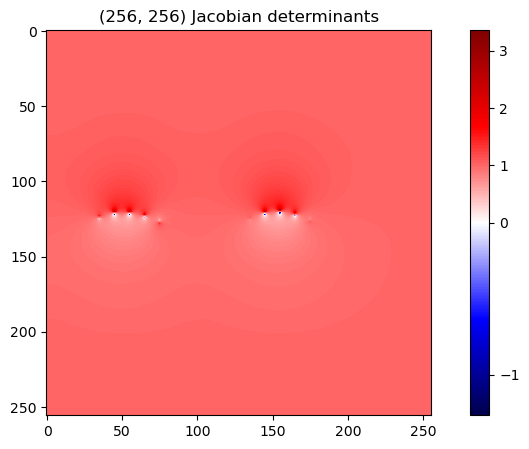

Minimum Jacobian determinant: -1.27
Number of negative Jacobian determinants: 9


In [7]:
# Create a specific double helix for correspondence analysis
print("\n=== Creating Double Helix for Point Correspondence ===")

resolution = (256, 256)  # Example resolution for the data
points_to_skip = [1, 2, 3, 4, 5, 6, 7, 8, 9, 10]  # Skip every nth point for better visualization

#####################################################################################################

for num_points_skip in points_to_skip:
    print(f"\n=== Resolution / {num_points_skip} ===")

    helix_wave1, helix_wave2, _ = cluster.create_double_helix_waves(
        grid_size=256,
        num_cycles=2,
        amplitude_ratio=0.03,
        phase_offset=np.pi,  # 180 degrees for maximum separation
        padding_ratio=0.1,
        plot=False
    )

    # Decrease point density for better visualization
    helix_wave1 = helix_wave1[::num_points_skip]  # Take every second point
    helix_wave2 = helix_wave2[::num_points_skip]  # Take every second point

    # Plot the correspondences between the two helical waves
    cluster.plot_point_correspondences(helix_wave1, helix_wave2,
                            labels=('Moving points', 'Fixed points'),
                            colors=('red', 'blue'),
                            title='Double Helix Point Correspondences',
                            show_indices=False,
                            line_alpha=0.2,  # More transparent lines to show the pattern better
                            point_size=20)

    # Swap columns to match expected format (x, y)
    helix_wave1 = helix_wave1[:, [1, 0]]  # Swap to (y, x) format
    helix_wave2 = helix_wave2[:, [1, 0]]  # Swap to (y, x) format 

    # Add 0s on the first axis to format for Data class
    helix_wave1 = np.pad(helix_wave1, ((0, 0), (1, 0)), mode='constant', constant_values=0)
    helix_wave2 = np.pad(helix_wave2, ((0, 0), (1, 0)), mode='constant', constant_values=0)

    #print(f"Analyzing {len(original_moving_points)} point correspondences from double helix")
    cluster_indices, cluster_info = cluster.get_cluster_indices(helix_wave1, helix_wave2)

    # Run Laplacian
    d = Data(helix_wave1[cluster_indices[0]], helix_wave2[cluster_indices[0]], resolution)
    d.show(fontsize=0, show_text=False, show_axis=False, show_correspondence=False, show_orientation=False)
    print(f"Minimum Jacobian determinant: {d.min():.2f}")
    print(f"Number of negative Jacobian determinants: {d.count_negatives()}")

## Upwards cluster


=== Creating Double Helix for Point Correspondence ===

=== Resolution / 1 ===
Created double helix with 206 points per wave
Grid size: 256x256
Padding: 25 pixels on each side
Number of cycles: 2
Phase offset: 3.142 radians (180.0 degrees)
Wave 1 - X range: [25, 230], Y range: [120, 136]
Wave 2 - X range: [25, 230], Y range: [120, 136]
Number of intersection points: 10
Plotted 206 point correspondences
Set 1 - X range: [25.0, 230.0], Y range: [120.0, 136.0]
Set 2 - X range: [25.0, 230.0], Y range: [120.0, 136.0]
Correspondence distances - Mean: 9.79, Std: 4.83, Max: 16.00


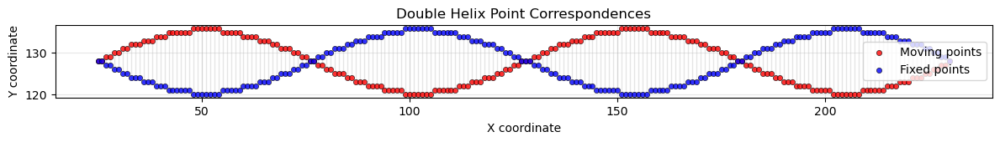

Analyzing 206 point pairs for directional clustering...
Clustering method: y_direction

Clustering Results (Y-direction (0=down, 1=up)):
Number of clusters: 2
Cluster 0: 98 points (indices: [2, 3, 4, 5, 6]...)
  Mean displacement: Z=0.000, Y=-10.286, X=0.000
  Std displacement:  Z=0.000, Y=4.408, X=0.000
Cluster 1: 108 points (indices: [0, 1, 51, 52, 53]...)
  Mean displacement: Z=0.000, Y=9.333, X=0.000
  Std displacement:  Z=0.000, Y=5.150, X=0.000


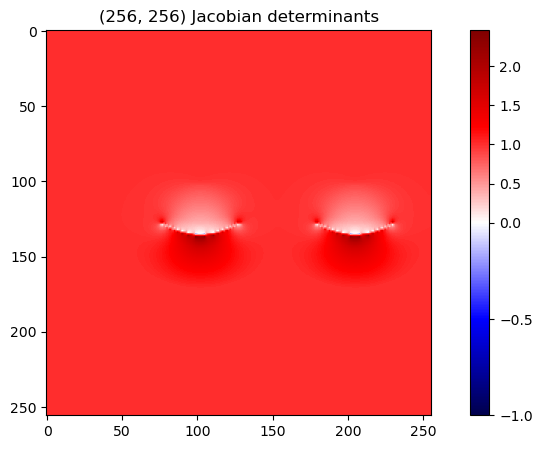

Minimum Jacobian determinant: -0.17
Number of negative Jacobian determinants: 22

=== Resolution / 2 ===
Created double helix with 206 points per wave
Grid size: 256x256
Padding: 25 pixels on each side
Number of cycles: 2
Phase offset: 3.142 radians (180.0 degrees)
Wave 1 - X range: [25, 230], Y range: [120, 136]
Wave 2 - X range: [25, 230], Y range: [120, 136]
Number of intersection points: 10
Plotted 103 point correspondences
Set 1 - X range: [25.0, 229.0], Y range: [120.0, 136.0]
Set 2 - X range: [25.0, 229.0], Y range: [120.0, 136.0]
Correspondence distances - Mean: 9.79, Std: 4.83, Max: 16.00


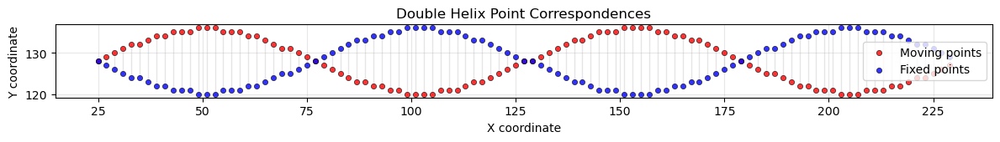

Analyzing 103 point pairs for directional clustering...
Clustering method: y_direction

Clustering Results (Y-direction (0=down, 1=up)):
Number of clusters: 2
Cluster 0: 49 points (indices: [1, 2, 3, 4, 5]...)
  Mean displacement: Z=0.000, Y=-10.286, X=0.000
  Std displacement:  Z=0.000, Y=4.408, X=0.000
Cluster 1: 54 points (indices: [0, 26, 27, 28, 29]...)
  Mean displacement: Z=0.000, Y=9.333, X=0.000
  Std displacement:  Z=0.000, Y=5.150, X=0.000


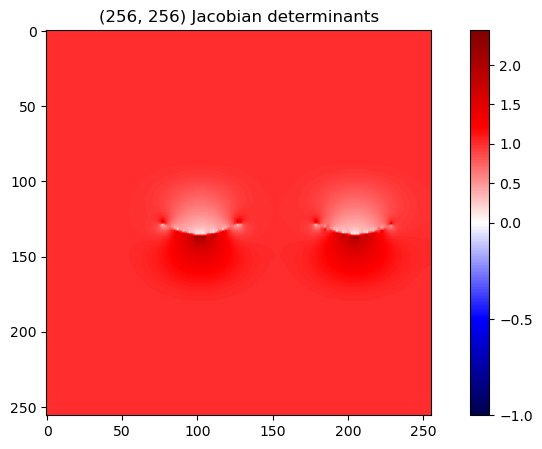

Minimum Jacobian determinant: -0.17
Number of negative Jacobian determinants: 10

=== Resolution / 3 ===
Created double helix with 206 points per wave
Grid size: 256x256
Padding: 25 pixels on each side
Number of cycles: 2
Phase offset: 3.142 radians (180.0 degrees)
Wave 1 - X range: [25, 230], Y range: [120, 136]
Wave 2 - X range: [25, 230], Y range: [120, 136]
Number of intersection points: 10
Plotted 69 point correspondences
Set 1 - X range: [25.0, 229.0], Y range: [120.0, 136.0]
Set 2 - X range: [25.0, 229.0], Y range: [120.0, 136.0]
Correspondence distances - Mean: 9.80, Std: 4.88, Max: 16.00


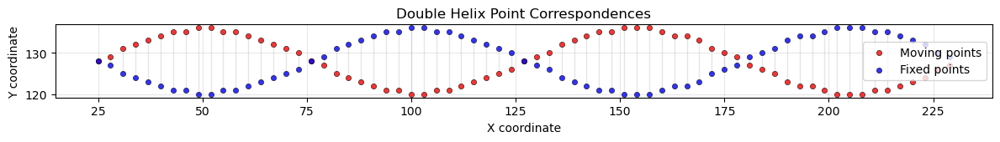

Analyzing 69 point pairs for directional clustering...
Clustering method: y_direction

Clustering Results (Y-direction (0=down, 1=up)):
Number of clusters: 2
Cluster 0: 33 points (indices: [1, 2, 3, 4, 5]...)
  Mean displacement: Z=0.000, Y=-10.242, X=0.000
  Std displacement:  Z=0.000, Y=4.506, X=0.000
Cluster 1: 36 points (indices: [0, 17, 18, 19, 20]...)
  Mean displacement: Z=0.000, Y=9.389, X=0.000
  Std displacement:  Z=0.000, Y=5.160, X=0.000


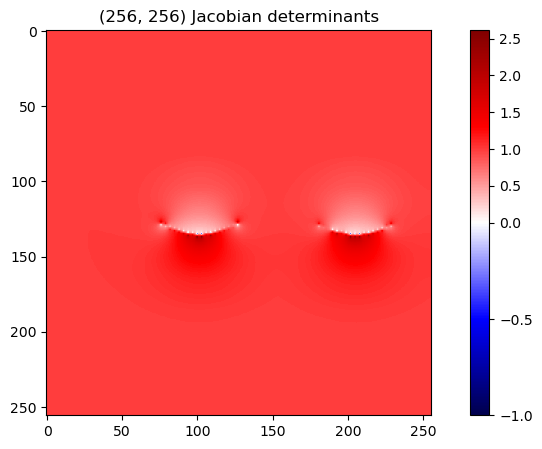

Minimum Jacobian determinant: -0.35
Number of negative Jacobian determinants: 11

=== Resolution / 4 ===
Created double helix with 206 points per wave
Grid size: 256x256
Padding: 25 pixels on each side
Number of cycles: 2
Phase offset: 3.142 radians (180.0 degrees)
Wave 1 - X range: [25, 230], Y range: [120, 136]
Wave 2 - X range: [25, 230], Y range: [120, 136]
Number of intersection points: 10
Plotted 52 point correspondences
Set 1 - X range: [25.0, 229.0], Y range: [120.0, 136.0]
Set 2 - X range: [25.0, 229.0], Y range: [120.0, 136.0]
Correspondence distances - Mean: 9.69, Std: 4.91, Max: 16.00


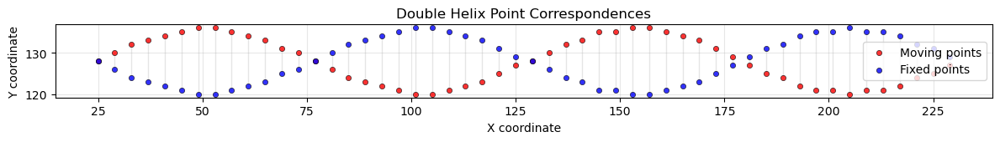

Analyzing 52 point pairs for directional clustering...
Clustering method: y_direction

Clustering Results (Y-direction (0=down, 1=up)):
Number of clusters: 2
Cluster 0: 24 points (indices: [1, 2, 3, 4, 5]...)
  Mean displacement: Z=0.000, Y=-10.500, X=0.000
  Std displacement:  Z=0.000, Y=4.291, X=0.000
Cluster 1: 28 points (indices: [0, 13, 14, 15, 16]...)
  Mean displacement: Z=0.000, Y=9.000, X=0.000
  Std displacement:  Z=0.000, Y=5.278, X=0.000


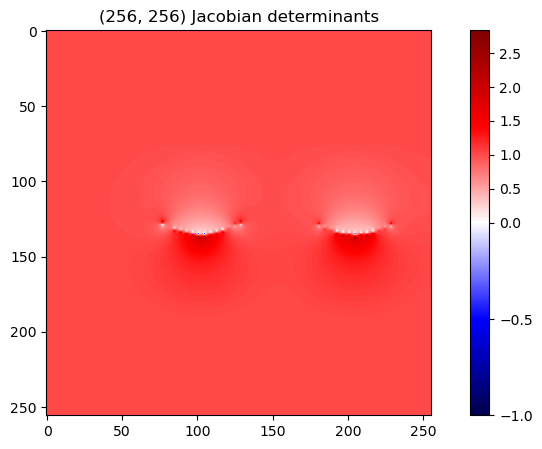

Minimum Jacobian determinant: -0.56
Number of negative Jacobian determinants: 14

=== Resolution / 5 ===
Created double helix with 206 points per wave
Grid size: 256x256
Padding: 25 pixels on each side
Number of cycles: 2
Phase offset: 3.142 radians (180.0 degrees)
Wave 1 - X range: [25, 230], Y range: [120, 136]
Wave 2 - X range: [25, 230], Y range: [120, 136]
Number of intersection points: 10
Plotted 42 point correspondences
Set 1 - X range: [25.0, 230.0], Y range: [120.0, 136.0]
Set 2 - X range: [25.0, 230.0], Y range: [120.0, 136.0]
Correspondence distances - Mean: 9.57, Std: 4.93, Max: 16.00


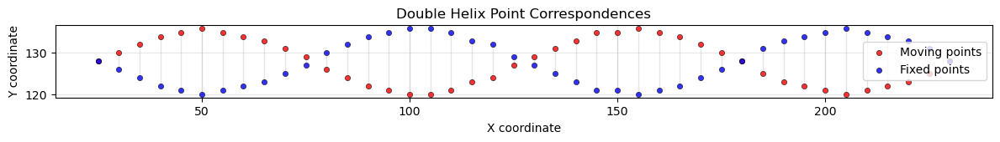

Analyzing 42 point pairs for directional clustering...
Clustering method: y_direction

Clustering Results (Y-direction (0=down, 1=up)):
Number of clusters: 2
Cluster 0: 20 points (indices: [1, 2, 3, 4, 5]...)
  Mean displacement: Z=0.000, Y=-9.900, X=0.000
  Std displacement:  Z=0.000, Y=4.493, X=0.000
Cluster 1: 22 points (indices: [0, 11, 12, 13, 14]...)
  Mean displacement: Z=0.000, Y=9.273, X=0.000
  Std displacement:  Z=0.000, Y=5.276, X=0.000


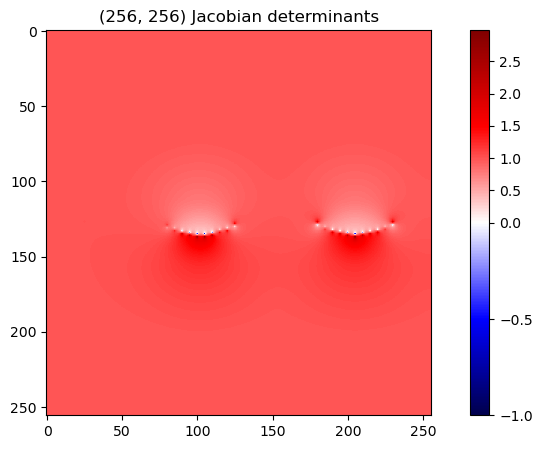

Minimum Jacobian determinant: -0.75
Number of negative Jacobian determinants: 14

=== Resolution / 6 ===
Created double helix with 206 points per wave
Grid size: 256x256
Padding: 25 pixels on each side
Number of cycles: 2
Phase offset: 3.142 radians (180.0 degrees)
Wave 1 - X range: [25, 230], Y range: [120, 136]
Wave 2 - X range: [25, 230], Y range: [120, 136]
Number of intersection points: 10
Plotted 35 point correspondences
Set 1 - X range: [25.0, 229.0], Y range: [120.0, 136.0]
Set 2 - X range: [25.0, 229.0], Y range: [120.0, 136.0]
Correspondence distances - Mean: 9.66, Std: 4.98, Max: 16.00


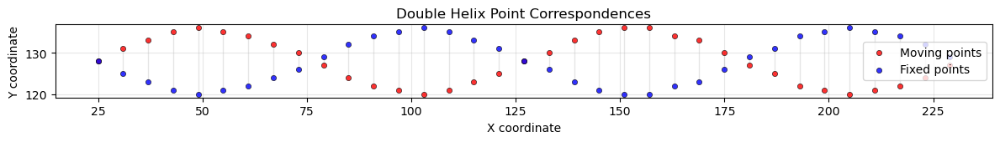

Analyzing 35 point pairs for directional clustering...
Clustering method: y_direction

Clustering Results (Y-direction (0=down, 1=up)):
Number of clusters: 2
Cluster 0: 16 points (indices: [1, 2, 3, 4, 5]...)
  Mean displacement: Z=0.000, Y=-10.625, X=0.000
  Std displacement:  Z=0.000, Y=4.226, X=0.000
Cluster 1: 19 points (indices: [0, 9, 10, 11, 12]...)
  Mean displacement: Z=0.000, Y=8.842, X=0.000
  Std displacement:  Z=0.000, Y=5.402, X=0.000


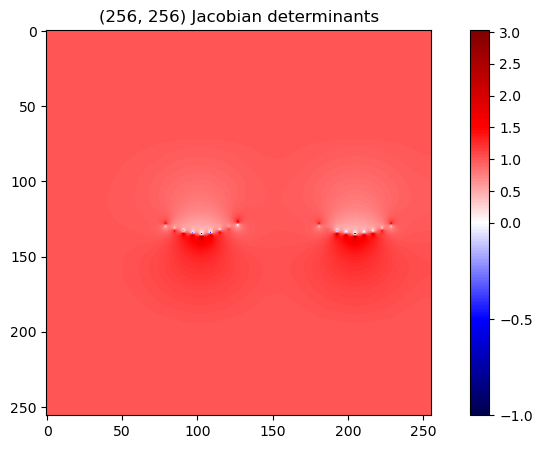

Minimum Jacobian determinant: -0.85
Number of negative Jacobian determinants: 10

=== Resolution / 7 ===
Created double helix with 206 points per wave
Grid size: 256x256
Padding: 25 pixels on each side
Number of cycles: 2
Phase offset: 3.142 radians (180.0 degrees)
Wave 1 - X range: [25, 230], Y range: [120, 136]
Wave 2 - X range: [25, 230], Y range: [120, 136]
Number of intersection points: 10
Plotted 30 point correspondences
Set 1 - X range: [25.0, 228.0], Y range: [120.0, 136.0]
Set 2 - X range: [25.0, 228.0], Y range: [120.0, 136.0]
Correspondence distances - Mean: 9.47, Std: 5.08, Max: 16.00


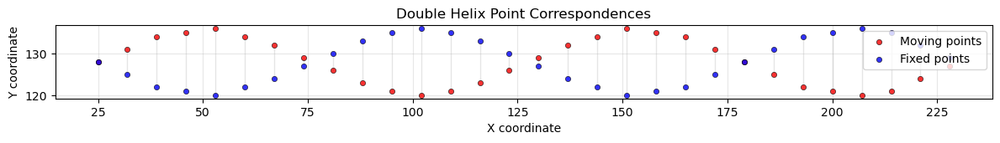

Analyzing 30 point pairs for directional clustering...
Clustering method: y_direction

Clustering Results (Y-direction (0=down, 1=up)):
Number of clusters: 2
Cluster 0: 14 points (indices: [1, 2, 3, 4, 5]...)
  Mean displacement: Z=0.000, Y=-10.000, X=0.000
  Std displacement:  Z=0.000, Y=4.536, X=0.000
Cluster 1: 16 points (indices: [0, 8, 9, 10, 11]...)
  Mean displacement: Z=0.000, Y=9.000, X=0.000
  Std displacement:  Z=0.000, Y=5.477, X=0.000


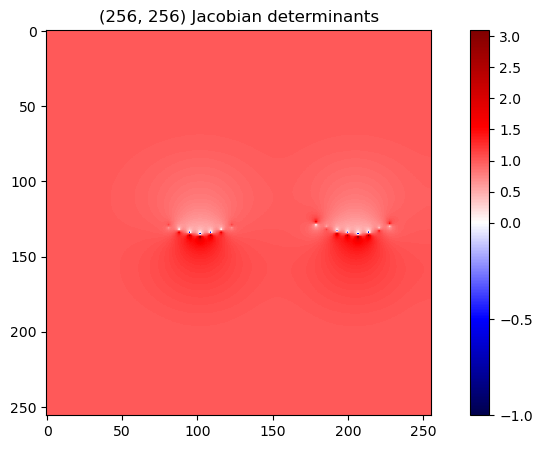

Minimum Jacobian determinant: -0.96
Number of negative Jacobian determinants: 12

=== Resolution / 8 ===
Created double helix with 206 points per wave
Grid size: 256x256
Padding: 25 pixels on each side
Number of cycles: 2
Phase offset: 3.142 radians (180.0 degrees)
Wave 1 - X range: [25, 230], Y range: [120, 136]
Wave 2 - X range: [25, 230], Y range: [120, 136]
Number of intersection points: 10
Plotted 26 point correspondences
Set 1 - X range: [25.0, 225.0], Y range: [120.0, 136.0]
Set 2 - X range: [25.0, 225.0], Y range: [120.0, 136.0]
Correspondence distances - Mean: 9.77, Std: 4.85, Max: 16.00


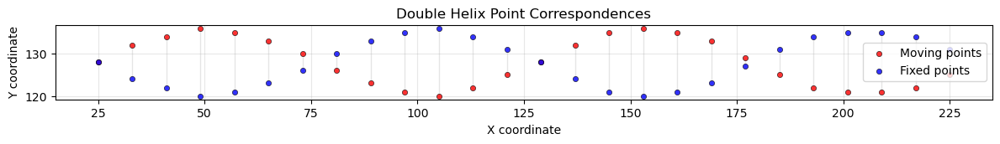

Analyzing 26 point pairs for directional clustering...
Clustering method: y_direction

Clustering Results (Y-direction (0=down, 1=up)):
Number of clusters: 2
Cluster 0: 12 points (indices: [1, 2, 3, 4, 5]...)
  Mean displacement: Z=0.000, Y=-10.667, X=0.000
  Std displacement:  Z=0.000, Y=4.346, X=0.000
Cluster 1: 14 points (indices: [0, 7, 8, 9, 10]...)
  Mean displacement: Z=0.000, Y=9.000, X=0.000
  Std displacement:  Z=0.000, Y=5.113, X=0.000


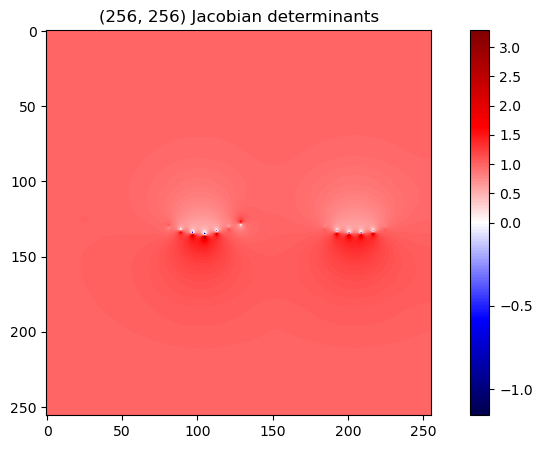

Minimum Jacobian determinant: -1.16
Number of negative Jacobian determinants: 9

=== Resolution / 9 ===
Created double helix with 206 points per wave
Grid size: 256x256
Padding: 25 pixels on each side
Number of cycles: 2
Phase offset: 3.142 radians (180.0 degrees)
Wave 1 - X range: [25, 230], Y range: [120, 136]
Wave 2 - X range: [25, 230], Y range: [120, 136]
Number of intersection points: 10
Plotted 23 point correspondences
Set 1 - X range: [25.0, 223.0], Y range: [120.0, 136.0]
Set 2 - X range: [25.0, 223.0], Y range: [120.0, 136.0]
Correspondence distances - Mean: 9.74, Std: 4.84, Max: 16.00


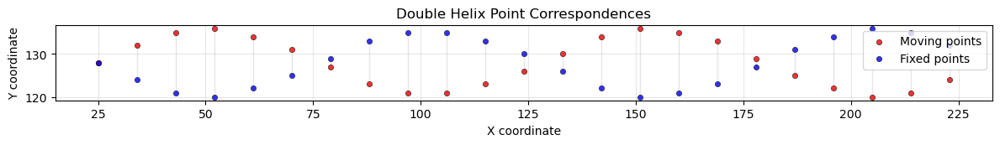

Analyzing 23 point pairs for directional clustering...
Clustering method: y_direction

Clustering Results (Y-direction (0=down, 1=up)):
Number of clusters: 2
Cluster 0: 11 points (indices: [1, 2, 3, 4, 5]...)
  Mean displacement: Z=0.000, Y=-10.364, X=0.000
  Std displacement:  Z=0.000, Y=4.578, X=0.000
Cluster 1: 12 points (indices: [0, 6, 7, 8, 9]...)
  Mean displacement: Z=0.000, Y=9.167, X=0.000
  Std displacement:  Z=0.000, Y=4.997, X=0.000


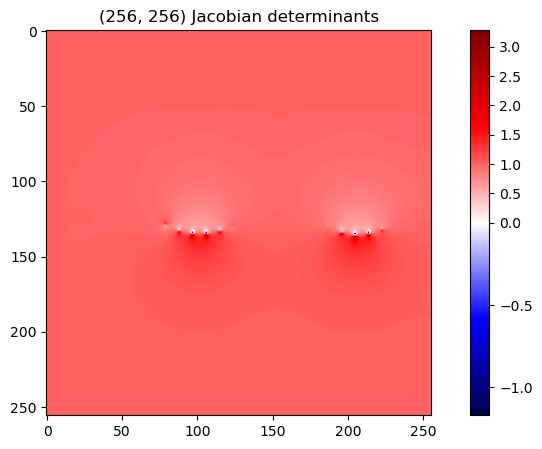

Minimum Jacobian determinant: -1.17
Number of negative Jacobian determinants: 8

=== Resolution / 10 ===
Created double helix with 206 points per wave
Grid size: 256x256
Padding: 25 pixels on each side
Number of cycles: 2
Phase offset: 3.142 radians (180.0 degrees)
Wave 1 - X range: [25, 230], Y range: [120, 136]
Wave 2 - X range: [25, 230], Y range: [120, 136]
Number of intersection points: 10
Plotted 21 point correspondences
Set 1 - X range: [25.0, 225.0], Y range: [120.0, 136.0]
Set 2 - X range: [25.0, 225.0], Y range: [120.0, 136.0]
Correspondence distances - Mean: 9.62, Std: 4.88, Max: 16.00


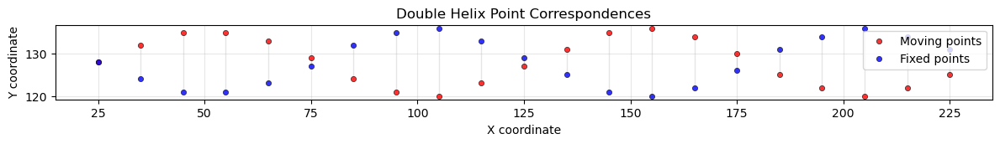

Analyzing 21 point pairs for directional clustering...
Clustering method: y_direction

Clustering Results (Y-direction (0=down, 1=up)):
Number of clusters: 2
Cluster 0: 10 points (indices: [1, 2, 3, 4, 5]...)
  Mean displacement: Z=0.000, Y=-10.000, X=0.000
  Std displacement:  Z=0.000, Y=4.561, X=0.000
Cluster 1: 11 points (indices: [0, 6, 7, 8, 9]...)
  Mean displacement: Z=0.000, Y=9.273, X=0.000
  Std displacement:  Z=0.000, Y=5.136, X=0.000


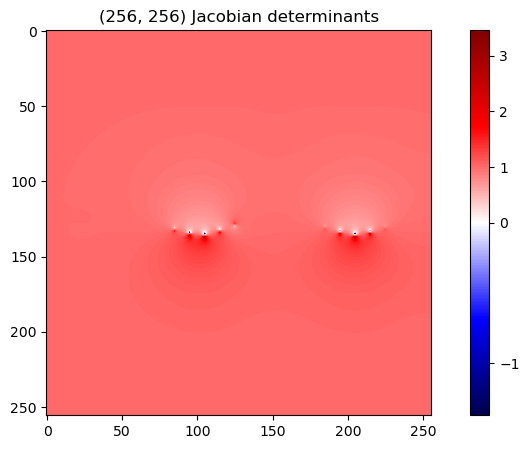

Minimum Jacobian determinant: -1.37
Number of negative Jacobian determinants: 8


In [8]:
# Create a specific double helix for correspondence analysis
print("\n=== Creating Double Helix for Point Correspondence ===")

resolution = (256, 256)  # Example resolution for the data
points_to_skip = [1, 2, 3, 4, 5, 6, 7, 8, 9, 10]  # Skip every nth point for better visualization

#####################################################################################################

for num_points_skip in points_to_skip:
    print(f"\n=== Resolution / {num_points_skip} ===")

    helix_wave1, helix_wave2, _ = cluster.create_double_helix_waves(
        grid_size=256,
        num_cycles=2,
        amplitude_ratio=0.03,
        phase_offset=np.pi,  # 180 degrees for maximum separation
        padding_ratio=0.1,
        plot=False
    )

    # Decrease point density for better visualization
    helix_wave1 = helix_wave1[::num_points_skip]  # Take every second point
    helix_wave2 = helix_wave2[::num_points_skip]  # Take every second point

    # Plot the correspondences between the two helical waves
    cluster.plot_point_correspondences(helix_wave1, helix_wave2,
                            labels=('Moving points', 'Fixed points'),
                            colors=('red', 'blue'),
                            title='Double Helix Point Correspondences',
                            show_indices=False,
                            line_alpha=0.2,  # More transparent lines to show the pattern better
                            point_size=20)

    # Swap columns to match expected format (x, y)
    helix_wave1 = helix_wave1[:, [1, 0]]  # Swap to (y, x) format
    helix_wave2 = helix_wave2[:, [1, 0]]  # Swap to (y, x) format 

    # Add 0s on the first axis to format for Data class
    helix_wave1 = np.pad(helix_wave1, ((0, 0), (1, 0)), mode='constant', constant_values=0)
    helix_wave2 = np.pad(helix_wave2, ((0, 0), (1, 0)), mode='constant', constant_values=0)

    #print(f"Analyzing {len(original_moving_points)} point correspondences from double helix")
    cluster_indices, cluster_info = cluster.get_cluster_indices(helix_wave1, helix_wave2)

    # Run Laplacian
    d = Data(helix_wave1[cluster_indices[1]], helix_wave2[cluster_indices[1]], resolution)
    d.show(fontsize=0, show_text=False, show_axis=False, show_correspondence=False, show_orientation=False)
    print(f"Minimum Jacobian determinant: {d.min():.2f}")
    print(f"Number of negative Jacobian determinants: {d.count_negatives()}")

# Create double helix for clustering correspondence

In [4]:
def draw_points_to_image(points, resolution=(256, 256), filename=None):
    """
    Simple function that takes points, creates a raw image with sequential connections,
    and saves it to a file.
    
    Parameters:
    -----------
    points : numpy.ndarray
        Array of points, shape (N, 3) with (z, y, x) coordinates
    resolution : tuple, default=(256, 256)
        Image resolution (height, width)
    filename : str, optional
        Filename to save the image. If None, uses timestamp
        
    Returns:
    --------
    image : numpy.ndarray
        The generated image array with white background and black lines
    saved_filename : str
        The filename where the image was saved
    """
    from skimage import draw
    from datetime import datetime
    
    height, width = resolution
    
    # Create white background image
    image = np.full((height, width), 255, dtype=np.uint8)
    
    # Connect points sequentially: 0→1, 1→2, 2→3, etc.
    for i in range(len(points) - 1):
        # Get consecutive points (y, x coordinates for image indexing)
        start_y, start_x = int(points[i, 1]), int(points[i, 2])
        end_y, end_x = int(points[i + 1, 1]), int(points[i + 1, 2])
        
        # Ensure points are within image bounds
        if (0 <= start_x < width and 0 <= start_y < height and
            0 <= end_x < width and 0 <= end_y < height):
            
            # Draw line using Bresenham's algorithm
            rr, cc = draw.line(start_y, start_x, end_y, end_x)
            # Clip to image bounds
            valid_pixels = (rr >= 0) & (rr < height) & (cc >= 0) & (cc < width)
            rr, cc = rr[valid_pixels], cc[valid_pixels]
            image[rr, cc] = 0  # Black lines
    
    # Generate filename if not provided
    if filename is None:
        timestamp = datetime.now().strftime("%Y%m%d_%H%M%S")
        filename = f"points_image_{timestamp}.png"
    elif not filename.lower().endswith('.png'):
        filename += '.png'
    
    # Save the raw image using matplotlib with exact resolution
    fig, ax = plt.subplots(figsize=(width/100, height/100), dpi=100)
    ax.imshow(image, cmap='gray', vmin=0, vmax=255, origin='upper', interpolation='nearest')
    ax.set_xlim(0, width)
    ax.set_ylim(height, 0)  # Flip Y axis to match image coordinates
    ax.axis('off')  # No axes
    
    # Remove all padding and margins for raw output
    plt.subplots_adjust(left=0, right=1, top=1, bottom=0)
    plt.margins(0)
    
    # Save with exact resolution - raw image
    plt.savefig(filename, bbox_inches='tight', pad_inches=0, dpi=100, 
                facecolor='white', edgecolor='none')
    plt.close()
    
    return image, filename

# Test the updated function
#print("✓ Updated function: draw_points_to_image(points, resolution, filename)")
#print("  - Returns: (image_array, saved_filename)")
#print("  - Saves raw PNG file with exact resolution")

# Test with existing data
#if 'downward_moving' in globals():
#    print(f"\nTesting with downward_moving: {downward_moving.shape}")
#    test_image, saved_file = draw_points_to_image(downward_moving, (256, 256), "test_downward")
#    print(f"✓ Image saved as: {saved_file}")
#    print(f"✓ Image array: {test_image.shape}, values {test_image.min()}-{test_image.max()}")
#else:
#    print("\nNo test data available")

## Setup tests


=== Creating Double Helix for Point Correspondence ===
Created double helix with 206 points per wave
Grid size: 256x256
Padding: 25 pixels on each side
Number of cycles: 2
Phase offset: 3.142 radians (180.0 degrees)
Wave 1 - X range: [25, 230], Y range: [120, 136]
Wave 2 - X range: [25, 230], Y range: [120, 136]
Number of intersection points: 10
Plotted 206 point correspondences
Set 1 - X range: [25.0, 230.0], Y range: [120.0, 136.0]
Set 2 - X range: [25.0, 230.0], Y range: [120.0, 136.0]
Correspondence distances - Mean: 9.79, Std: 4.83, Max: 16.00


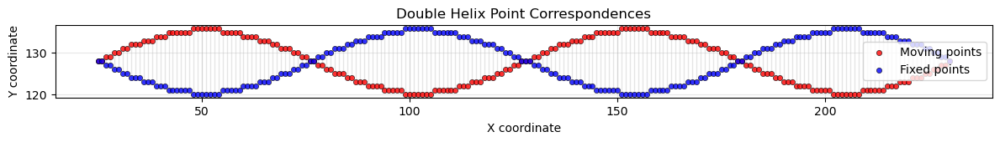

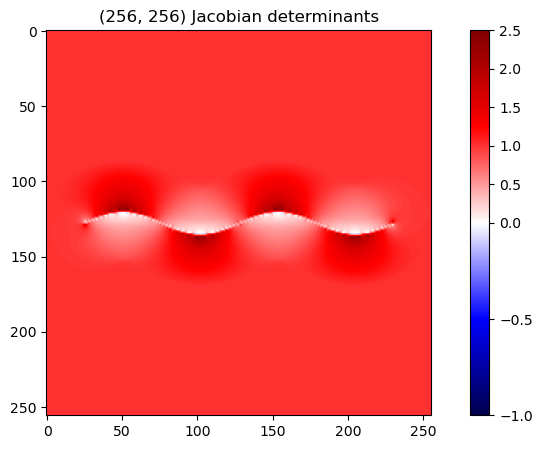

Minimum Jacobian determinant: -0.20
Number of negative Jacobian determinants: 52


In [5]:
# Create a specific double helix for correspondence analysis
print("\n=== Creating Double Helix for Point Correspondence ===")
helix_wave1, helix_wave2, _ = cluster.create_double_helix_waves(
    grid_size=256,
    num_cycles=2,
    amplitude_ratio=0.03,
    phase_offset=np.pi,  # 180 degrees for maximum separation
    padding_ratio=0.1,
    plot=False
)
resolution = (256, 256)  # Example resolution for the data
num_points_skip = 1  # Skip every 5th point for better visualization

#####################################################################################################

# Decrease point density for better visualization
helix_wave1 = helix_wave1[::num_points_skip]  # Take every second point
helix_wave2 = helix_wave2[::num_points_skip]  # Take every second point

# Plot the correspondences between the two helical waves
cluster.plot_point_correspondences(helix_wave1, helix_wave2,
                          labels=('Moving points', 'Fixed points'),
                          colors=('red', 'blue'),
                          title='Double Helix Point Correspondences',
                          show_indices=False,
                          line_alpha=0.2,  # More transparent lines to show the pattern better
                          point_size=20)

# Swap columns to match expected format (x, y)
helix_wave1 = helix_wave1[:, [1, 0]]  # Swap to (y, x) format
helix_wave2 = helix_wave2[:, [1, 0]]  # Swap to (y, x) format 

# Add 0s on the first axis to format for Data class
helix_wave1 = np.pad(helix_wave1, ((0, 0), (1, 0)), mode='constant', constant_values=0)
helix_wave2 = np.pad(helix_wave2, ((0, 0), (1, 0)), mode='constant', constant_values=0)

# Save to raw image
test_image, saved_file = draw_points_to_image(helix_wave1, (256, 256), "wave1")
test_image2, saved_file2 = draw_points_to_image(helix_wave2, (256, 256), "wave2")

# Run Laplacian
d = Data(helix_wave1, helix_wave2, resolution)
d.show(fontsize=0, show_text=False, show_axis=False, show_correspondence=False, show_orientation=False)
print(f"Minimum Jacobian determinant: {d.min():.2f}")
print(f"Number of negative Jacobian determinants: {d.count_negatives()}")


In [ ]:
# Get the downards and upwards clusters
cluster_indices, cluster_info = cluster.get_cluster_indices(helix_wave1, helix_wave2)
down_indices = cluster_indices[0]
up_indices = cluster_indices[1]

# Run Laplacian on down indices
d = Data(helix_wave1[down_indices], helix_wave2[down_indices], resolution)
d.show(fontsize=0, show_text=False, show_axis=False, show_correspondence=False, show_orientation=False)
print(f"Minimum Jacobian determinant: {d.min():.2f}")
print(f"Number of negative Jacobian determinants: {d.count_negatives()}")

# Run Laplacian on up indices
d = Data(helix_wave1[up_indices], helix_wave2[up_indices], resolution)
d.show(fontsize=0, show_text=False, show_axis=False, show_correspondence=False, show_orientation=False)
print(f"Minimum Jacobian determinant: {d.min():.2f}")
print(f"Number of negative Jacobian determinants: {d.count_negatives()}")

Moving image shape: (256, 256)


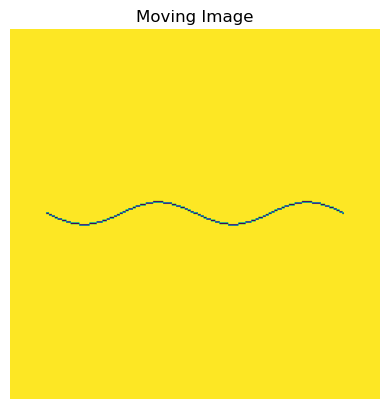

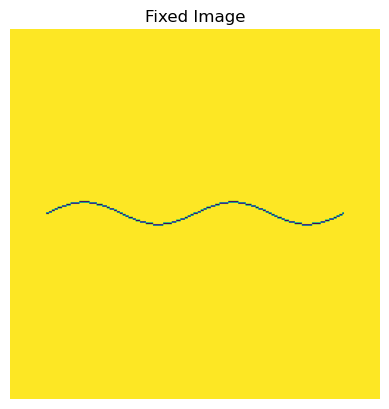

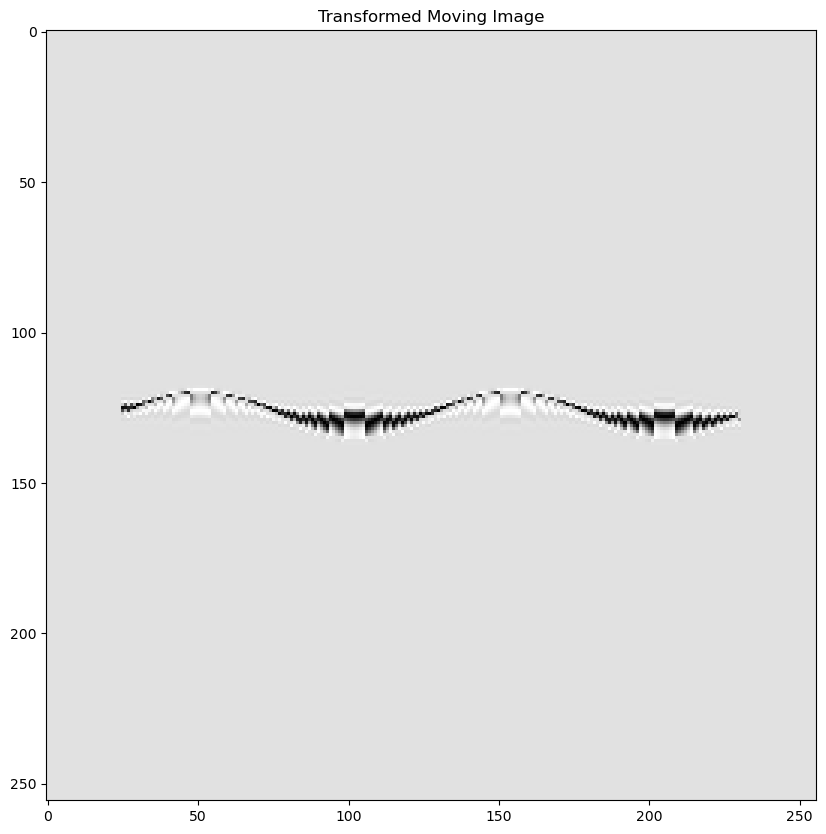

In [6]:
# Load and apply transformation to a moving image
moving_img = load_png("wave1.png", scale=1.0, alpha=1.0)[:, :, 0]
fixed_img = load_png("wave2.png", scale=1.0, alpha=1.0)[:, :, 0]

print(f"Moving image shape: {moving_img.shape}")

show_png(moving_img, title="Moving Image")
show_png(fixed_img, title="Fixed Image")


apply_transformation(d, moving_img, None, 
                     mpoints=None, 
                     fpoints=None, 
                     title="Transformed Moving Image")

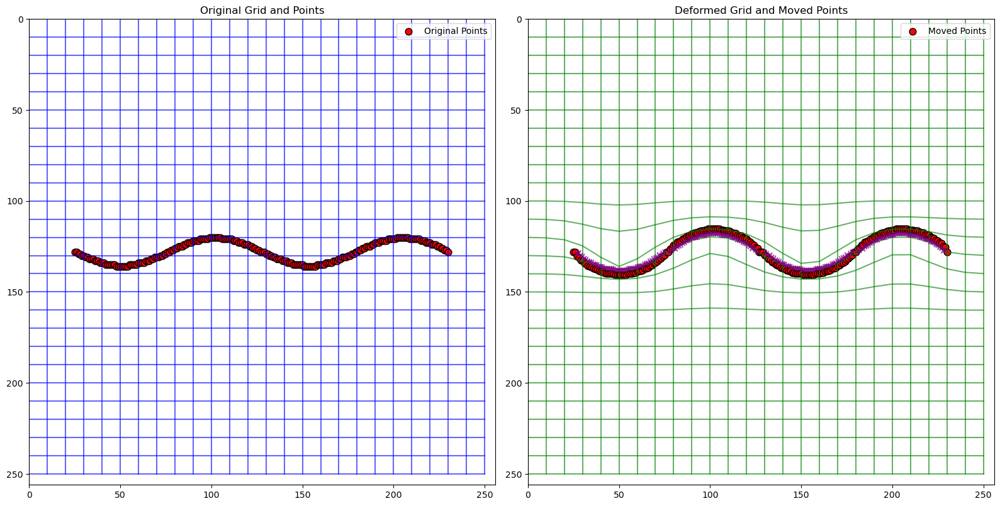

In [7]:
import numpy as np
import matplotlib.pyplot as plt

def visualize_deformation_on_grid(resolution, points, deformation, grid_spacing=20, point_color='red'):
    """
    Visualize a regular grid and points, then show how both are moved by a deformation field.

    Parameters:
        resolution: tuple (height, width)
        points: np.ndarray, shape (N, 3) with (z, y, x) coordinates
        deformation: np.ndarray, shape (3, 1, height, width)
        grid_spacing: int, spacing between grid lines
        point_color: str, color for points

    Returns:
        None (shows matplotlib plots)
    """
    height, width = resolution
    deform_height, deform_width = deformation.shape[2], deformation.shape[3]

    # Scale factors if deformation field size differs from resolution
    scale_y = deform_height / height if height != deform_height else 1.0
    scale_x = deform_width / width if width != deform_width else 1.0

    # Extract deformation components
    dx = deformation[2, 0, :, :]
    dy = deformation[1, 0, :, :]
    dz = deformation[0, 0, :, :]

    # Create regular grid
    y_grid, x_grid = np.mgrid[0:deform_height:grid_spacing, 0:deform_width:grid_spacing]

    # Apply deformation to grid points
    y_indices = np.clip(y_grid.astype(int), 0, deform_height-1)
    x_indices = np.clip(x_grid.astype(int), 0, deform_width-1)
    grid_dx = dx[y_indices, x_indices]
    grid_dy = dy[y_indices, x_indices]
    x_grid_deformed = x_grid + grid_dx
    y_grid_deformed = y_grid + grid_dy

    # Scale points to deformation field coordinates
    scaled_y = points[:, 1] * scale_y
    scaled_x = points[:, 2] * scale_x
    point_y_indices = np.clip(scaled_y.astype(int), 0, deform_height-1)
    point_x_indices = np.clip(scaled_x.astype(int), 0, deform_width-1)
    point_dx = dx[point_y_indices, point_x_indices]
    point_dy = dy[point_y_indices, point_x_indices]
    moved_x = scaled_x + point_dx
    moved_y = scaled_y + point_dy

    # Plot original grid and points
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 8))
    ax1.set_title('Original Grid and Points')
    for i in range(x_grid.shape[1]):
        ax1.plot(x_grid[:, i], y_grid[:, i], 'b-', alpha=0.6)
    for i in range(x_grid.shape[0]):
        ax1.plot(x_grid[i, :], y_grid[i, :], 'b-', alpha=0.6)
    ax1.scatter(scaled_x, scaled_y, c=point_color, s=60, edgecolors='black', label='Original Points')
    ax1.set_xlim(0, deform_width)
    ax1.set_ylim(deform_height, 0)
    ax1.set_aspect('equal')
    ax1.legend()

    # Plot deformed grid and moved points
    ax2.set_title('Deformed Grid and Moved Points')
    for i in range(x_grid_deformed.shape[1]):
        ax2.plot(x_grid_deformed[:, i], y_grid_deformed[:, i], 'g-', alpha=0.6)
    for i in range(x_grid_deformed.shape[0]):
        ax2.plot(x_grid_deformed[i, :], y_grid_deformed[i, :], 'g-', alpha=0.6)
    ax2.scatter(moved_x, moved_y, c=point_color, s=60, edgecolors='black', label='Moved Points')
    # Draw arrows showing movement
    for i in range(len(points)):
        ax2.annotate('', xy=(moved_x[i], moved_y[i]), xytext=(scaled_x[i], scaled_y[i]),
                     arrowprops=dict(arrowstyle='->', color='purple', alpha=0.7, lw=1.5))
    ax2.set_xlim(0, deform_width)
    ax2.set_ylim(deform_height, 0)
    ax2.set_aspect('equal')
    ax2.legend()

    plt.tight_layout()
    plt.show()

# Example usage:
visualize_deformation_on_grid(resolution, d.mpoints, d.deformation, grid_spacing=10, point_color='red')

## Clustering algorithm

In [27]:
###############################################################################
# Reusable Cluster Iteration Function
###############################################################################

def cluster_iteration(mpoints, fpoints, clusters, resolution, fontsize=5, verbose=True):
    """
    Iteratively update clusters of points, fixing each cluster in turn and updating the rest, except the last cluster.
    Coordinates fixed in previous clusters are not modified in subsequent iterations.
    At the end, shows a combined DVF as in the manual code.
    Args:
        mpoints: np.ndarray, shape (N, 3)
        fpoints: np.ndarray, shape (N, 3)
        clusters: list of lists, each sublist contains indices for a cluster
        resolution: tuple, image resolution
        fontsize: int, for plotting
        verbose: bool, print debug info
    Returns:
        Data object after all iterations
    """
    mpoints_original = mpoints.copy()
    fpoints_original = fpoints.copy()
    mpoints = mpoints.copy()
    fpoints = fpoints.copy()
    d = Data(mpoints, fpoints, resolution)
    original_dvf = d.deformation.copy()
    if verbose:
        d.show("Original test case", fontsize=fontsize)
    # Store per-cluster Data objects for DVF combination
    cluster_datas = []
    fixed_indices = set()
    for i, cluster in enumerate(clusters[:]):
        #if i == len(clusters) - 1:
        #    # Last cluster, do not fix it, just show the original Data object
        #    if verbose:
        #        d_cluster = Data(mpoints[cluster], fpoints[cluster], resolution)
        #        d_cluster.show(f"Cluster {i+1}", fontsize=fontsize)
        #        break
        if verbose:
            print(f"\n--- Iteration {i+1}: Fixing cluster {cluster} ---")
        # Show current cluster
        d_cluster = Data(mpoints[cluster], fpoints[cluster], resolution)
        if verbose:
            d_cluster.show(f"Cluster {i+1}", fontsize=fontsize)
        cluster_datas.append(d_cluster)  # Add the original Data object to the list
        # Inverse mapping for current cluster
        d_cluster_inv = Data(fpoints[cluster], mpoints[cluster], resolution)
        # Fix the moving points to the fixed points in the current cluster
        mpoints[cluster] = fpoints[cluster]
        # Mark these indices as fixed
        fixed_indices.update(cluster)
        # Update the rest (only those not fixed in any previous cluster)
        other_indices = [idx for idx in range(len(mpoints)) if idx not in fixed_indices]
        for idx in other_indices:
            curr_mcoord = mpoints[idx]
            curr_fcoord = fpoints[idx]
            new_mdisplacement = d_cluster_inv.deformation[:, 0, curr_mcoord[1], curr_mcoord[2]]
            new_fdisplacement = d_cluster_inv.deformation[:, 0, curr_fcoord[1], curr_fcoord[2]]
            new_mcoord = curr_mcoord + new_mdisplacement
            new_mcoord = np.round(new_mcoord).astype(int)
            #new_fcoord = curr_fcoord + new_fdisplacement
            new_fcoord = curr_fcoord + new_mdisplacement
            new_fcoord = np.round(new_fcoord).astype(int)
            if verbose:
                print(f"New coordinate for point {idx}:\n\tmoving:\t{curr_mcoord} -> {new_mcoord}\n\tfixed:\t{curr_fcoord} -> {new_fcoord}")
            mpoints[idx] = new_mcoord
            fpoints[idx] = new_fcoord
        d = Data(mpoints, fpoints, resolution)
        cluster_datas.append(d)
        if verbose:
            d.show(f"Iteration {i+1}", fontsize=fontsize)
    # Show combined DVF if at least two clusters were processed
    if len(cluster_datas) >= 2:
        combined_dvf = cluster_datas[0].deformation.copy()
        for d_next in cluster_datas[1:]:
            combined_dvf += d_next.deformation.copy()
        jdet_field = jacobian.sitk_jacobian_determinant(combined_dvf)[0]
        d_combined = cluster_datas[-1]
        d_combined.mpoints = mpoints_original.copy()
        d_combined.fpoints = fpoints_original.copy()
        d_combined.deformation = combined_dvf
        d_combined.jdet_field = jdet_field
        l2_error = np.linalg.norm(d_combined.deformation - original_dvf)
        print(f"\nL2 error of combined DVF: {l2_error:.4f}")
        if verbose:
            d_combined.show("Combined DVF (original correspondences shown)", fontsize=fontsize)
    return d_combined

"""
# Example usage for your test case
resolution = (9, 9)
fontsize = 5
mpoints = np.array([
    [0, 0, 2],
    [0, 1, 2],
    [0, 2, 2],
    [0, 4, 2],
    [0, 5, 4],
    [0, 6, 4],
])
fpoints = np.array([
    [0, 0, 4],
    [0, 1, 3],
    [0, 3, 4],
    [0, 4, 5],
    [0, 5, 2],
    [0, 6, 1],
])
clusters = [[0, 1, 2, 3], [4, 5]]
d = cluster_iteration(mpoints, fpoints, clusters, resolution, fontsize=fontsize, verbose=True)
err_x, err_y, err_z, total_err = compute_error(d.resolution, mpoints, fpoints, d.deformation)
print(f"Error: X={err_x:.2f}, Y={err_y:.2f}, Z={err_z:.2f}, Total={total_err:.2f}")
"""

'\n# Example usage for your test case\nresolution = (9, 9)\nfontsize = 5\nmpoints = np.array([\n    [0, 0, 2],\n    [0, 1, 2],\n    [0, 2, 2],\n    [0, 4, 2],\n    [0, 5, 4],\n    [0, 6, 4],\n])\nfpoints = np.array([\n    [0, 0, 4],\n    [0, 1, 3],\n    [0, 3, 4],\n    [0, 4, 5],\n    [0, 5, 2],\n    [0, 6, 1],\n])\nclusters = [[0, 1, 2, 3], [4, 5]]\nd = cluster_iteration(mpoints, fpoints, clusters, resolution, fontsize=fontsize, verbose=True)\nerr_x, err_y, err_z, total_err = compute_error(d.resolution, mpoints, fpoints, d.deformation)\nprint(f"Error: X={err_x:.2f}, Y={err_y:.2f}, Z={err_z:.2f}, Total={total_err:.2f}")\n'

## Downwards first

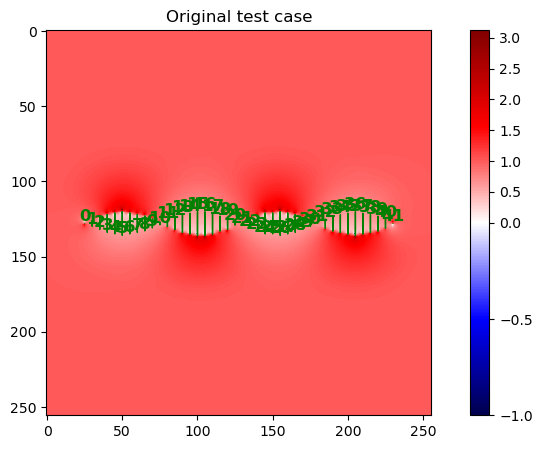


--- Iteration 1: Fixing cluster [ 1  2  3  4  5  6  7  8  9 10 21 22 23 24 25 26 27 28 29 30] ---


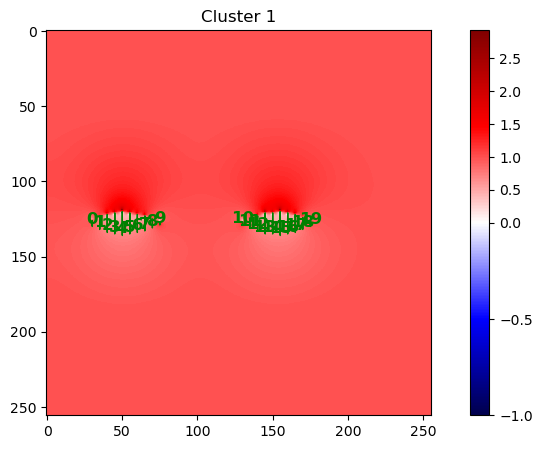

New coordinate for point 0:
	moving:	[  0 128  25] -> [  0 125  25]
	fixed:	[  0 128  25] -> [  0 125  25]
New coordinate for point 11:
	moving:	[  0 126  80] -> [  0 124  80]
	fixed:	[  0 130  80] -> [  0 128  80]
New coordinate for point 12:
	moving:	[  0 124  85] -> [  0 122  85]
	fixed:	[  0 132  85] -> [  0 130  85]
New coordinate for point 13:
	moving:	[  0 122  90] -> [  0 121  90]
	fixed:	[  0 134  90] -> [  0 133  90]
New coordinate for point 14:
	moving:	[  0 121  95] -> [  0 120  95]
	fixed:	[  0 135  95] -> [  0 134  95]
New coordinate for point 15:
	moving:	[  0 120 100] -> [  0 119 100]
	fixed:	[  0 136 100] -> [  0 135 100]
New coordinate for point 16:
	moving:	[  0 120 105] -> [  0 119 105]
	fixed:	[  0 136 105] -> [  0 135 105]
New coordinate for point 17:
	moving:	[  0 121 110] -> [  0 120 110]
	fixed:	[  0 135 110] -> [  0 134 110]
New coordinate for point 18:
	moving:	[  0 123 115] -> [  0 122 115]
	fixed:	[  0 133 115] -> [  0 132 115]
New coordinate for point 19:


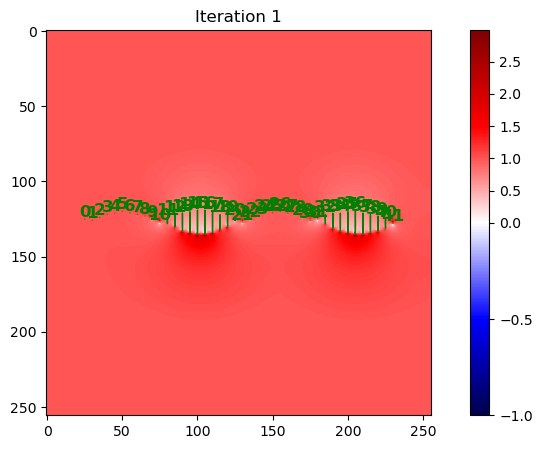


--- Iteration 2: Fixing cluster [ 0 11 12 13 14 15 16 17 18 19 20 31 32 33 34 35 36 37 38 39 40 41] ---


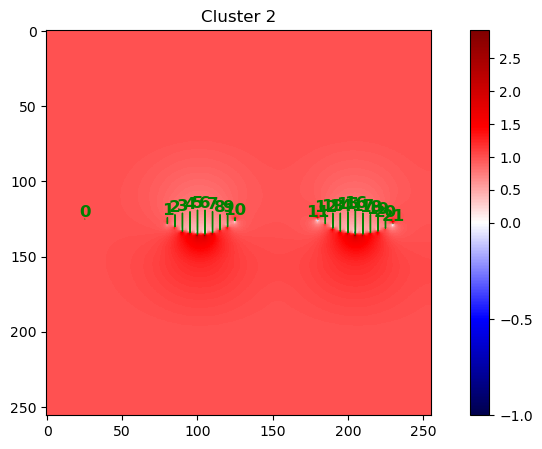

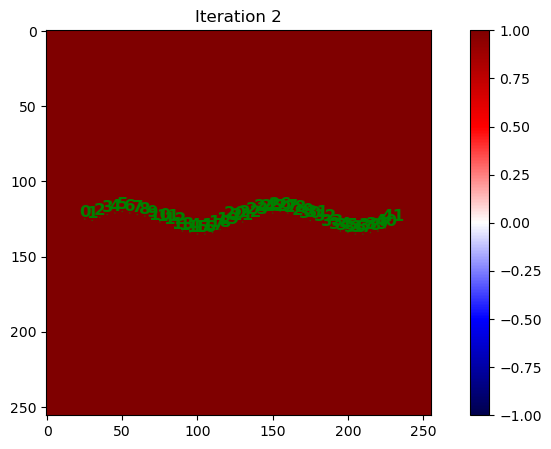


L2 error of combined DVF: 446.0422


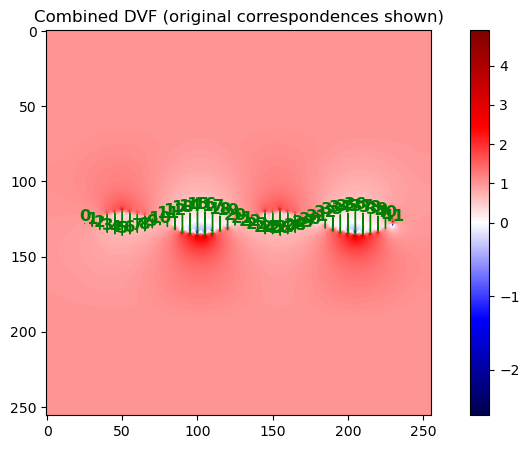

fdata.shape (1, 256, 256)
Time taken to create A:  0.08100271224975586
Error: X=0.00, Y=60.10, Z=0.00, Total=60.10
Minimum Jacobian determinant: -2.62
Number of negative Jacobian determinants: 270


In [28]:
fontsize = 0
d = cluster_iteration(helix_wave1, helix_wave2, [down_indices, up_indices], resolution, fontsize=fontsize, verbose=True)
err_x, err_y, err_z, total_err = compute_error(d.resolution, helix_wave1, helix_wave2, d.deformation)
print(f"Error: X={err_x:.2f}, Y={err_y:.2f}, Z={err_z:.2f}, Total={total_err:.2f}")
print(f"Minimum Jacobian determinant: {d.min():.2f}")
print(f"Number of negative Jacobian determinants: {d.count_negatives()}")

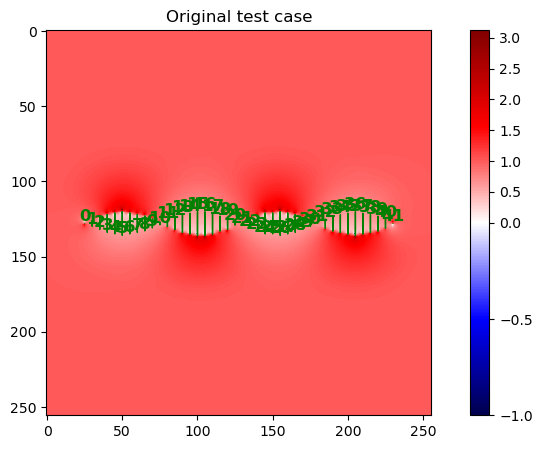


--- Iteration 1: Fixing cluster [ 1  2  3  4  5  6  7  8  9 10 21 22 23 24 25 26 27 28 29 30] ---


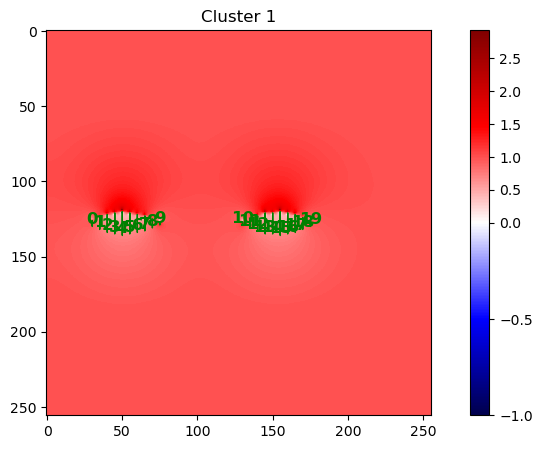

New coordinate for point 0:
	moving:	[  0 128  25] -> [  0 125  25]
	fixed:	[  0 128  25] -> [  0 125  25]
New coordinate for point 11:
	moving:	[  0 126  80] -> [  0 124  80]
	fixed:	[  0 130  80] -> [  0 128  80]
New coordinate for point 12:
	moving:	[  0 124  85] -> [  0 122  85]
	fixed:	[  0 132  85] -> [  0 130  85]
New coordinate for point 13:
	moving:	[  0 122  90] -> [  0 121  90]
	fixed:	[  0 134  90] -> [  0 133  90]
New coordinate for point 14:
	moving:	[  0 121  95] -> [  0 120  95]
	fixed:	[  0 135  95] -> [  0 134  95]
New coordinate for point 15:
	moving:	[  0 120 100] -> [  0 119 100]
	fixed:	[  0 136 100] -> [  0 135 100]
New coordinate for point 16:
	moving:	[  0 120 105] -> [  0 119 105]
	fixed:	[  0 136 105] -> [  0 135 105]
New coordinate for point 17:
	moving:	[  0 121 110] -> [  0 120 110]
	fixed:	[  0 135 110] -> [  0 134 110]
New coordinate for point 18:
	moving:	[  0 123 115] -> [  0 122 115]
	fixed:	[  0 133 115] -> [  0 132 115]
New coordinate for point 19:


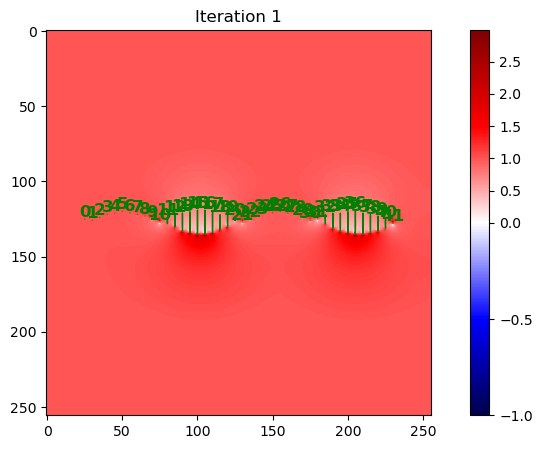


--- Iteration 2: Fixing cluster [ 0 11 12 13 14 15 16 17 18 19 20 31 32 33 34 35 36 37 38 39 40 41] ---


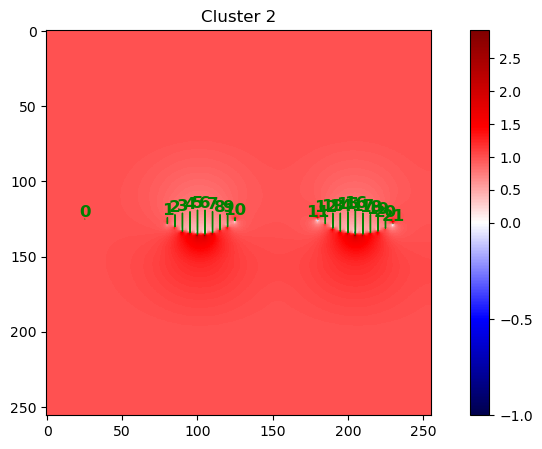

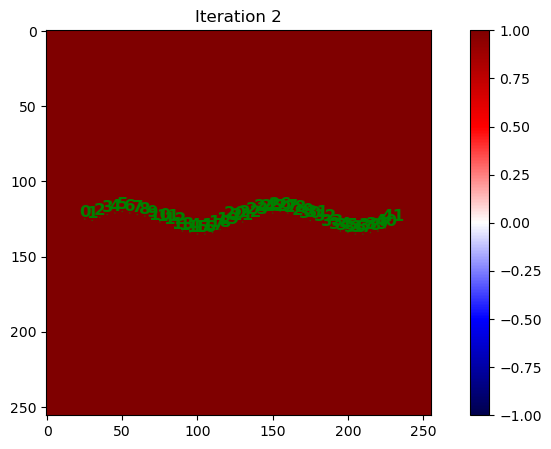


L2 error of combined DVF: 446.0422


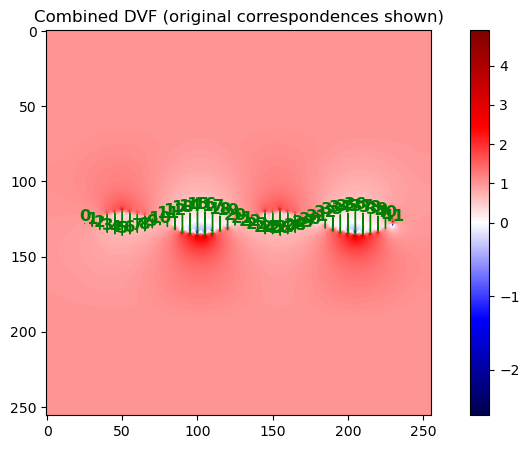

fdata.shape (1, 256, 256)
Time taken to create A:  0.08100271224975586
Error: X=0.00, Y=60.10, Z=0.00, Total=60.10
Minimum Jacobian determinant: -2.62
Number of negative Jacobian determinants: 270


In [ ]:
fontsize = 0
d = cluster_iteration(helix_wave1, helix_wave2, [down_indices, up_indices], resolution, fontsize=fontsize, verbose=True)
err_x, err_y, err_z, total_err = compute_error(d.resolution, helix_wave1, helix_wave2, d.deformation)
print(f"Error: X={err_x:.2f}, Y={err_y:.2f}, Z={err_z:.2f}, Total={total_err:.2f}")
print(f"Minimum Jacobian determinant: {d.min():.2f}")
print(f"Number of negative Jacobian determinants: {d.count_negatives()}")

## Upwards first

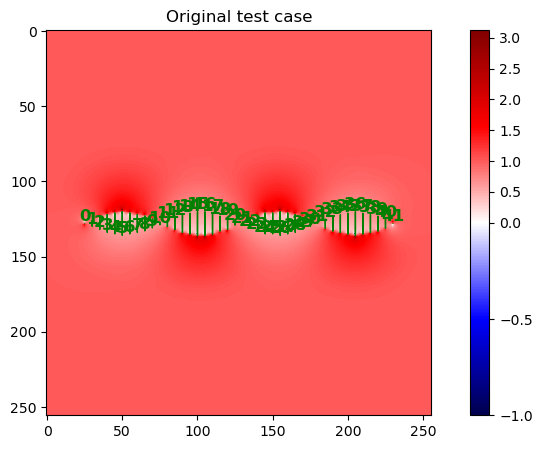


--- Iteration 1: Fixing cluster [ 0 11 12 13 14 15 16 17 18 19 20 31 32 33 34 35 36 37 38 39 40 41] ---


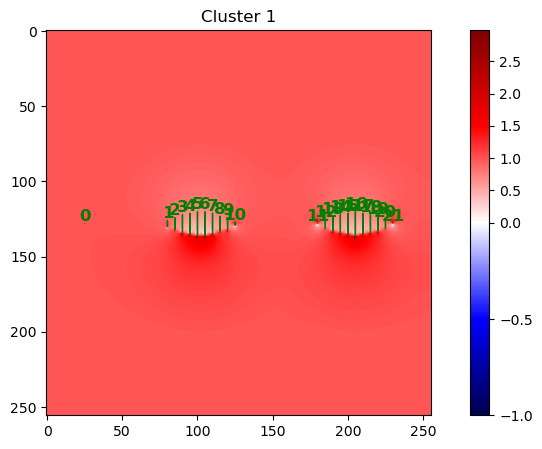

New coordinate for point 1:
	moving:	[  0 130  30] -> [  0 130  30]
	fixed:	[  0 126  30] -> [  0 126  30]
New coordinate for point 2:
	moving:	[  0 132  35] -> [  0 132  35]
	fixed:	[  0 124  35] -> [  0 124  35]
New coordinate for point 3:
	moving:	[  0 134  40] -> [  0 134  40]
	fixed:	[  0 122  40] -> [  0 122  40]
New coordinate for point 4:
	moving:	[  0 135  45] -> [  0 135  45]
	fixed:	[  0 121  45] -> [  0 121  45]
New coordinate for point 5:
	moving:	[  0 136  50] -> [  0 136  50]
	fixed:	[  0 120  50] -> [  0 120  50]
New coordinate for point 6:
	moving:	[  0 135  55] -> [  0 136  55]
	fixed:	[  0 121  55] -> [  0 122  55]
New coordinate for point 7:
	moving:	[  0 134  60] -> [  0 135  60]
	fixed:	[  0 122  60] -> [  0 123  60]
New coordinate for point 8:
	moving:	[  0 133  65] -> [  0 135  65]
	fixed:	[  0 123  65] -> [  0 125  65]
New coordinate for point 9:
	moving:	[  0 131  70] -> [  0 133  70]
	fixed:	[  0 125  70] -> [  0 127  70]
New coordinate for point 10:
	moving:

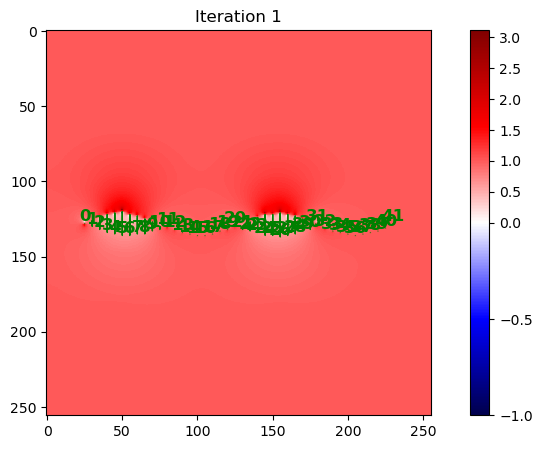


--- Iteration 2: Fixing cluster [ 1  2  3  4  5  6  7  8  9 10 21 22 23 24 25 26 27 28 29 30] ---


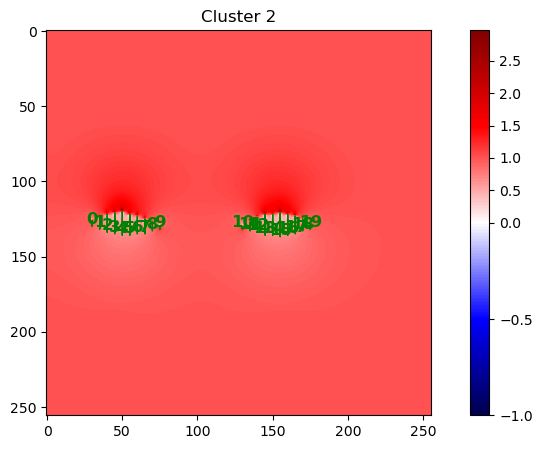

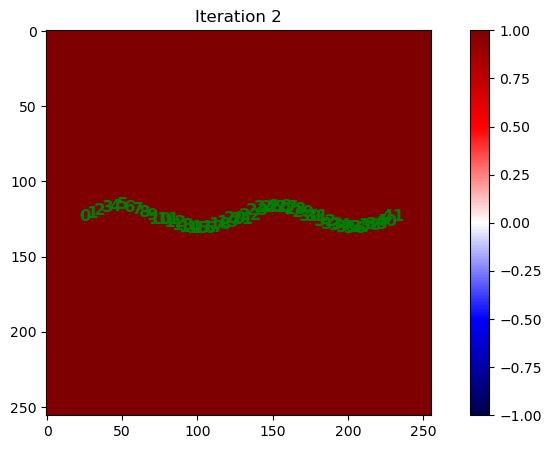


L2 error of combined DVF: 463.6923


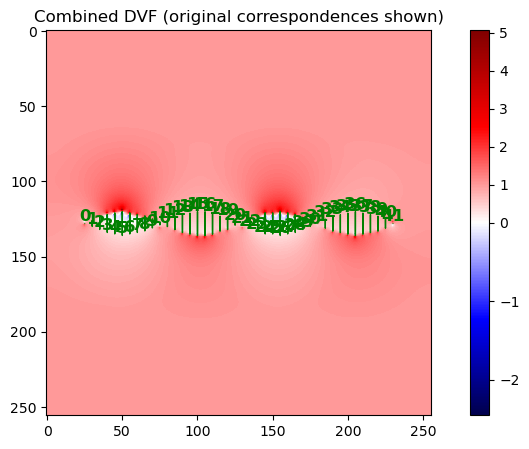

fdata.shape (1, 256, 256)
Time taken to create A:  0.07050943374633789
Error: X=0.00, Y=55.55, Z=0.00, Total=55.55
Minimum Jacobian determinant: -2.45
Number of negative Jacobian determinants: 233


In [29]:
fontsize = 0
d = cluster_iteration(helix_wave1, helix_wave2, [up_indices, down_indices], resolution, fontsize=fontsize, verbose=True)
err_x, err_y, err_z, total_err = compute_error(d.resolution, helix_wave1, helix_wave2, d.deformation)
print(f"Error: X={err_x:.2f}, Y={err_y:.2f}, Z={err_z:.2f}, Total={total_err:.2f}")
print(f"Minimum Jacobian determinant: {d.min():.2f}")
print(f"Number of negative Jacobian determinants: {d.count_negatives()}")

# End

=== Computing Forward and Inverse Deformation Fields for Double Helix ===
Using existing Data object with 54 point correspondences
Original Data object:
  Moving points shape: (54, 3)
  Fixed points shape: (54, 3)
  Resolution: (256, 256)
  Forward deformation shape: (3, 1, 256, 256)

Creating inverse Data object by swapping moving and fixed points...
Inverse Data object:
  Moving points (was fixed): (54, 3)
  Fixed points (was moving): (54, 3)
  Inverse deformation shape: (3, 1, 256, 256)

Deformation field statistics:
Forward deformation - Y: [-16.00, 0.00]
Forward deformation - X: [0.00, 0.00]
Inverse deformation - Y: [0.00, 16.00]
Inverse deformation - X: [0.00, 0.00]
Moving point 0: [  0 128  25] -> fixed coord [  0 128  25] (displacement: [0. 0. 0.])
Moving point 1: [  0 128  77] -> fixed coord [  0 128  77] (displacement: [0. 0. 0.])
Moving point 2: [  0 127  79] -> fixed coord [  0 129  79] (displacement: [0.        2.0002672 0.       ])
Moving point 3: [  0 126  81] -> fixed c

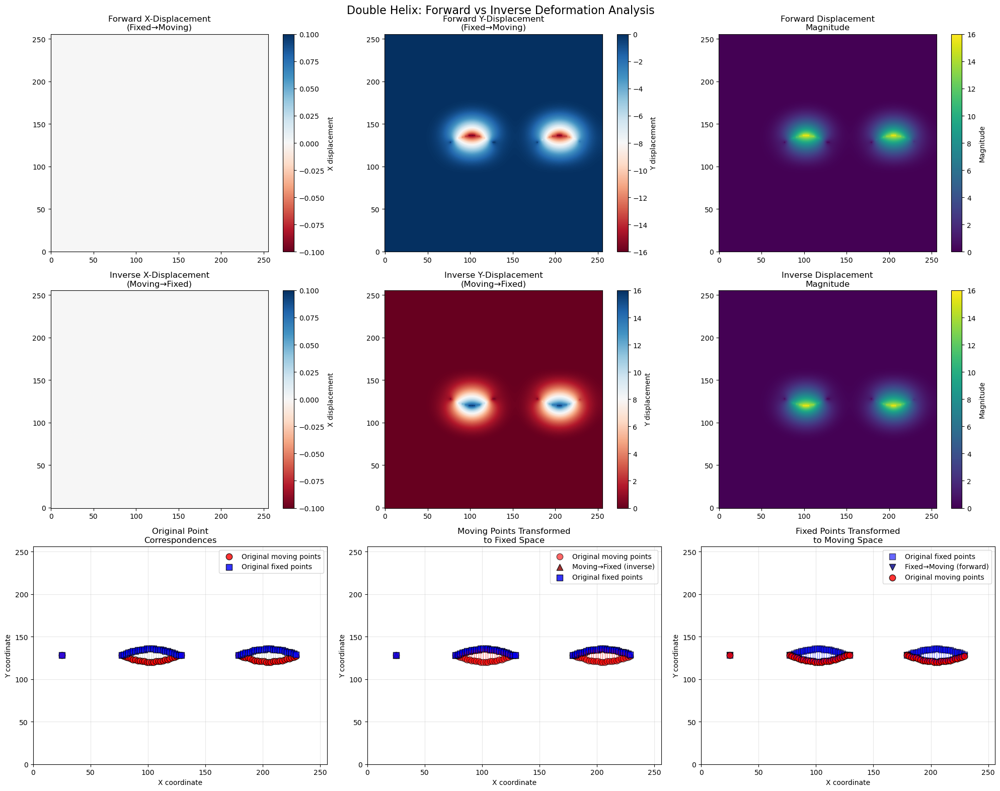


Transformation Statistics:
Number of points processed: 54
Moving→Fixed transformation accuracy:
  Mean distance to target: 0.000
  Max distance to target: 0.000
  Std deviation: 0.000
Fixed→Moving transformation accuracy:
  Mean distance to target: 0.000
  Max distance to target: 0.000
  Std deviation: 0.000
Round-trip consistency (Fixed→Moving→Fixed):
  Mean reconstruction error: 0.000
  Max reconstruction error: 0.000
Original Data object - Min Jacobian: -0.17, Negatives: 10
Inverse Data object - Min Jacobian: -0.17, Negatives: 10


In [16]:
# Example usage with the double helix data
print("=== Computing Forward and Inverse Deformation Fields for Double Helix ===")

# Use the data object from the previous registration
if 'd' in locals():
    print(f"Using existing Data object with {len(d.mpoints)} point correspondences")
    
    # Compute forward and inverse correspondences using swapped Data object
    forward_coords, inverse_coords, inverse_data_obj, moving_to_fixed, fixed_to_moving = cluster.compute_corresponding_pixels_with_inverse(
        d, 
        title="Double Helix: Forward vs Inverse Deformation Analysis"
    )
    
    print(f"Original Data object - Min Jacobian: {d.min():.2f}, Negatives: {d.count_negatives()}")
    print(f"Inverse Data object - Min Jacobian: {inverse_data_obj.min():.2f}, Negatives: {inverse_data_obj.count_negatives()}")
    
else:
    print("No Data object found. Please run the double helix registration first.")

=== Clustering Double Helix Points by Movement Direction ===
Analyzing 54 point correspondences from double helix

Testing clustering method: y_direction
Analyzing 54 point pairs for directional clustering...
Clustering method: y_direction

Clustering Results (Y-direction (0=down, 1=up)):
Number of clusters: 1
Cluster 0: 54 points (indices: [0, 1, 2, 3, 4]...)
  Mean displacement: Z=0.000, Y=9.333, X=0.000
  Std displacement:  Z=0.000, Y=5.150, X=0.000


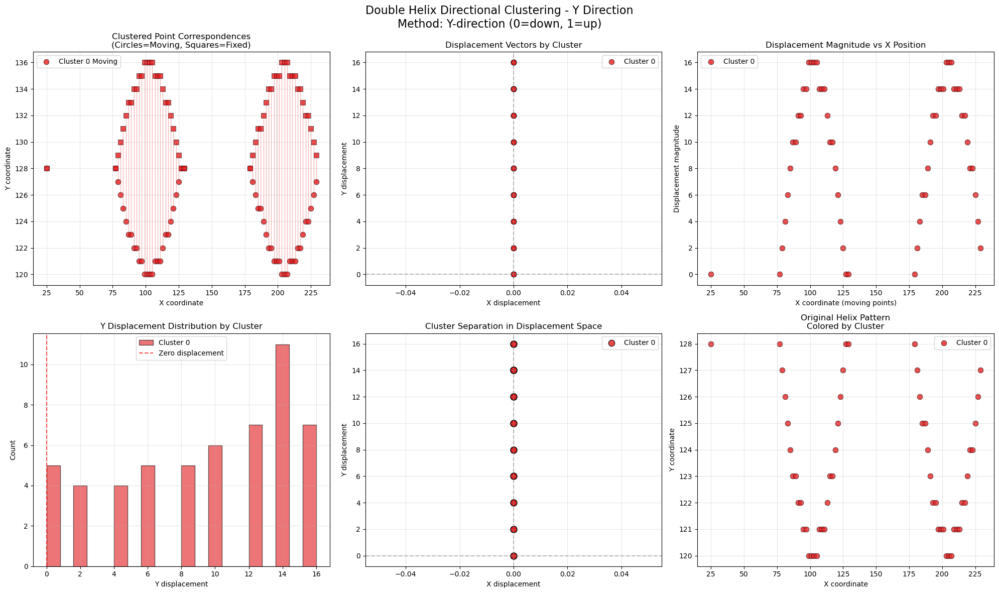


Testing clustering method: quadrant
Analyzing 54 point pairs for directional clustering...
Clustering method: quadrant

Clustering Results (Quadrants (0=+X+Y, 1=-X+Y, 2=-X-Y, 3=+X-Y)):
Number of clusters: 1
Cluster 0: 54 points (indices: [0, 1, 2, 3, 4]...)
  Mean displacement: Z=0.000, Y=9.333, X=0.000
  Std displacement:  Z=0.000, Y=5.150, X=0.000


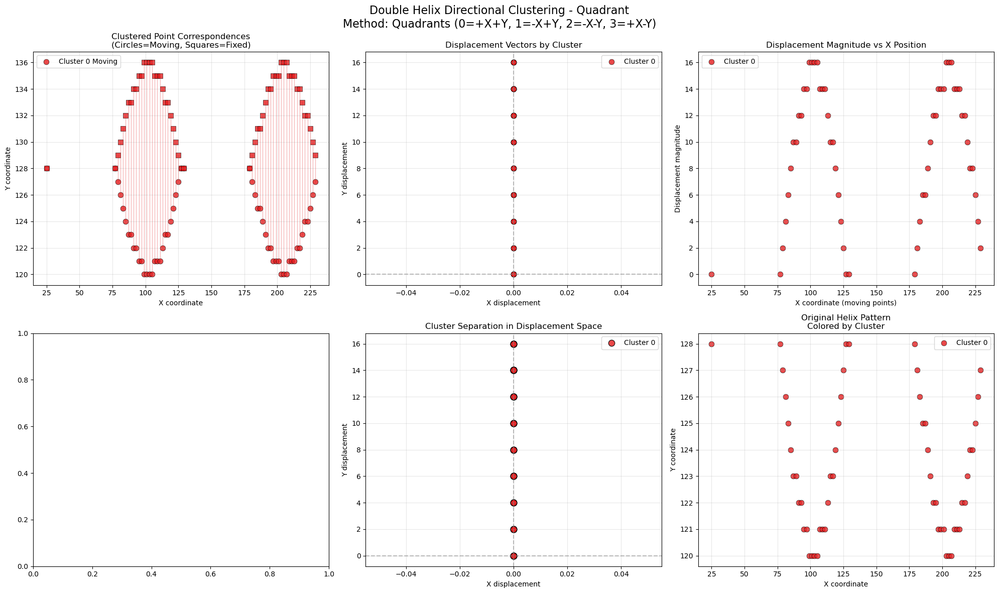


Testing clustering method: displacement_direction
Analyzing 54 point pairs for directional clustering...
Clustering method: displacement_direction

Clustering Results (Directional sectors (n=4)):
Number of clusters: 2
Cluster 0: 5 points (indices: [0, 1, 26, 27, 28])
  Mean displacement: Z=0.000, Y=0.000, X=0.000
  Std displacement:  Z=0.000, Y=0.000, X=0.000
Cluster 1: 49 points (indices: [2, 3, 4, 5, 6]...)
  Mean displacement: Z=0.000, Y=10.286, X=0.000
  Std displacement:  Z=0.000, Y=4.408, X=0.000


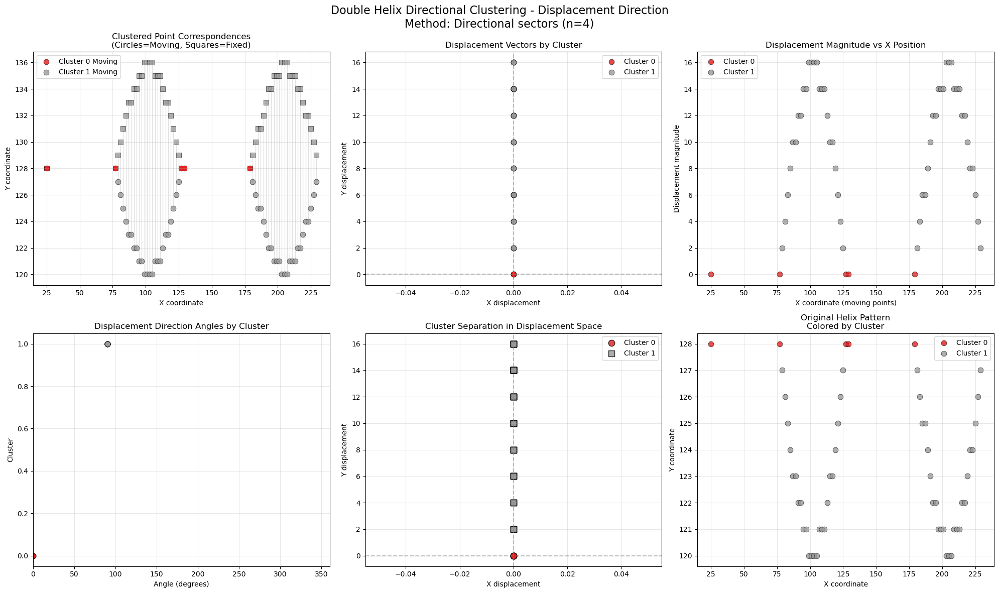


Testing clustering method: helix_phase
Analyzing 54 point pairs for directional clustering...
Clustering method: helix_phase

Clustering Results (Helix phase estimation (3 cycles)):
Number of clusters: 2
Cluster 0: 27 points (indices: [1, 2, 3, 4, 5]...)
  Mean displacement: Z=0.000, Y=9.556, X=0.000
  Std displacement:  Z=0.000, Y=4.939, X=0.000
Cluster 1: 27 points (indices: [0, 10, 11, 12, 13]...)
  Mean displacement: Z=0.000, Y=9.111, X=0.000
  Std displacement:  Z=0.000, Y=5.343, X=0.000


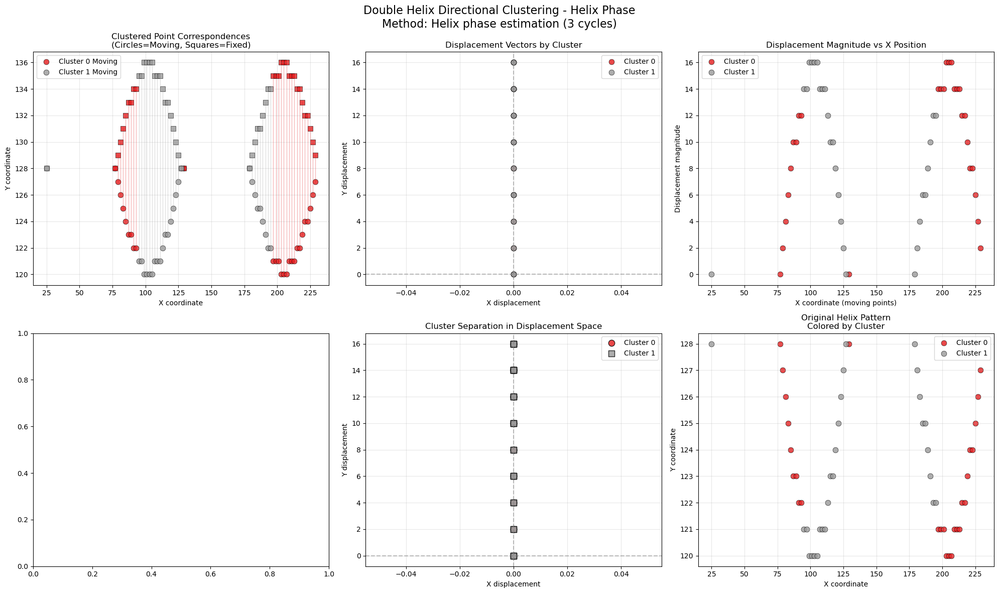

In [17]:
# Example usage with the double helix data
print("=== Clustering Double Helix Points by Movement Direction ===")

# Use the data object from the previous registration
if 'd' in locals():
    original_moving_points = d.mpoints.copy()
    original_fixed_points = d.fpoints.copy()
    
    print(f"Analyzing {len(original_moving_points)} point correspondences from double helix")
    
    # Test different clustering methods
    methods_to_test = ['y_direction', 'quadrant', 'displacement_direction', 'helix_phase']
    
    clustering_results = {}
    
    for method in methods_to_test:
        print(f"\n{'='*50}")
        print(f"Testing clustering method: {method}")
        print(f"{'='*50}")
        
        clusters, labels, displacements = cluster.cluster_by_movement_direction(
            original_moving_points, original_fixed_points, 
            method=method, plot=True, 
            title=f"Double Helix Directional Clustering - {method.replace('_', ' ').title()}"
        )
        
        clustering_results[method] = {
            'clusters': clusters,
            'labels': labels,
            'displacements': displacements
        }
        
else:
    print("No Data object found. Please run the double helix registration first.")

In [18]:


# Demo: Extract cluster indices from the double helix data
print("=== Extracting Cluster Indices for Easy Point Indexing ===")

if 'd' in locals():
    # Get cluster indices using Y-direction method (most effective for double helix)
    cluster_indices, cluster_info = cluster.get_cluster_indices(
        d.mpoints, d.fpoints, method='y_direction', verbose=True
    )
    
    print(f"\n=== Using Cluster Indices to Access Point Subsets ===")
    
    # Demonstrate how to use the indices
    for i, indices in enumerate(cluster_indices):
        print(f"\nCluster {i} (using indices):")
        print(f"  Indices shape: {indices.shape}")
        print(f"  First 5 indices: {indices[:5]}")
        
        # Extract moving and fixed points for this cluster
        cluster_moving = d.mpoints[indices]
        cluster_fixed = d.fpoints[indices]
        
        print(f"  Moving points shape: {cluster_moving.shape}")
        print(f"  Fixed points shape: {cluster_fixed.shape}")
        print(f"  First moving point: {cluster_moving[0]}")
        print(f"  First fixed point: {cluster_fixed[0]}")
        
        # Calculate displacement for verification
        displacement = cluster_fixed[0] - cluster_moving[0]
        print(f"  First point displacement: Z={displacement[0]:.1f}, Y={displacement[1]:.1f}, X={displacement[2]:.1f}")
    
    # Store the indices for easy access
    downward_indices = cluster_indices[0]  # Cluster 0: downward movement
    upward_indices = cluster_indices[1]    # Cluster 1: upward movement
    
    print(f"\n=== Stored Cluster Indices for Easy Access ===")
    print(f"downward_indices: {len(downward_indices)} points")
    print(f"upward_indices: {len(upward_indices)} points")
    
    # Example: Create separate Data objects for each cluster
    print(f"\n=== Example: Creating Data Objects for Each Cluster ===")
    
    # Downward cluster Data object
    downward_moving = d.mpoints[downward_indices]
    downward_fixed = d.fpoints[downward_indices]
    downward_data = Data(downward_moving, downward_fixed, d.resolution)
    
    # Upward cluster Data object
    upward_moving = d.mpoints[upward_indices]
    upward_fixed = d.fpoints[upward_indices]
    upward_data = Data(upward_moving, upward_fixed, d.resolution)
    
    print(f"Downward cluster Data object: {len(downward_moving)} points, Min Jacobian: {downward_data.min():.3f}")
    print(f"Upward cluster Data object: {len(upward_moving)} points, Min Jacobian: {upward_data.min():.3f}")
    
    # Store for later use
    cluster_data_objects = [downward_data, upward_data]
    
    print(f"\n✓ Cluster indices and Data objects ready for use!")
    print(f"Access with: downward_indices, upward_indices, cluster_data_objects")
    
else:
    print("No Data object 'd' found. Please run the double helix registration first.")

=== Extracting Cluster Indices for Easy Point Indexing ===
Analyzing 54 point pairs for directional clustering...
Clustering method: y_direction

Clustering Results (Y-direction (0=down, 1=up)):
Number of clusters: 1
Cluster 0: 54 points (indices: [0, 1, 2, 3, 4]...)
  Mean displacement: Z=0.000, Y=9.333, X=0.000
  Std displacement:  Z=0.000, Y=5.150, X=0.000
Extracted 1 clusters using y_direction method:
  Cluster 0: 54 points
    Indices: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]...
    Mean displacement: Z=0.00, Y=9.33, X=0.00
    Mean magnitude: 9.33

=== Using Cluster Indices to Access Point Subsets ===

Cluster 0 (using indices):
  Indices shape: (54,)
  First 5 indices: [0 1 2 3 4]
  Moving points shape: (54, 3)
  Fixed points shape: (54, 3)
  First moving point: [  0 128  25]
  First fixed point: [  0 128  25]
  First point displacement: Z=0.0, Y=0.0, X=0.0


IndexError: list index out of range

## Clustering Results Summary

The directional clustering function successfully identified the two helical strands based on movement patterns:

### Key Findings:

1. **Y-Direction Method** - Most effective:
   - **Cluster 0**: 51 points moving downward (mean Y displacement: -65.843)
   - **Cluster 1**: 52 points moving upward (mean Y displacement: +64.577)
   - Perfect separation of the two helical strands

2. **Quadrant Method** - Equivalent to Y-direction:
   - Since X displacement is ~0, quadrant clustering reduces to Y-direction clustering
   - Same separation as Y-direction method

3. **Displacement Direction Method** - Similar with edge case:
   - Creates 3 clusters: one point with zero displacement, plus the same up/down separation
   - Handles the edge case where one point has exactly zero displacement

4. **Helix Phase Method** - Less discriminative:
   - Attempts to estimate phase position but creates mixed clusters
   - Less clear separation based on displacement patterns

### Optimal Clustering Strategy:

The **Y-direction method** provides the cleanest separation for double-helix patterns because:
- The fundamental difference between helical strands is their vertical movement direction
- Mean displacements of ~±65 pixels show clear directional separation
- Low standard deviation within clusters (~31-32 pixels) indicates good homogeneity
- Perfect correspondence to the visual double-helix structure

This clustering approach can be used for iterative registration where each helical strand is processed separately.

## Testing Y-Direction Clustering on Data Objects

Now let's test how separating the double helix into Y-direction clusters affects the Data object registration results.

=== Testing Y-Direction Clustering Effects ===
=== Testing Clustered Data Objects (Method: y_direction) ===
Original Data object: 103 points
Number of clusters: 2

--- Cluster 0 ---
Points in cluster: 49
Indices: [1, 2, 3, 4, 5, 6, 7, 8, 9, 10]...
Min Jacobian: -0.171
Negative Jacobians: 10
Mean displacement: Z=0.00, Y=-10.29, X=0.00


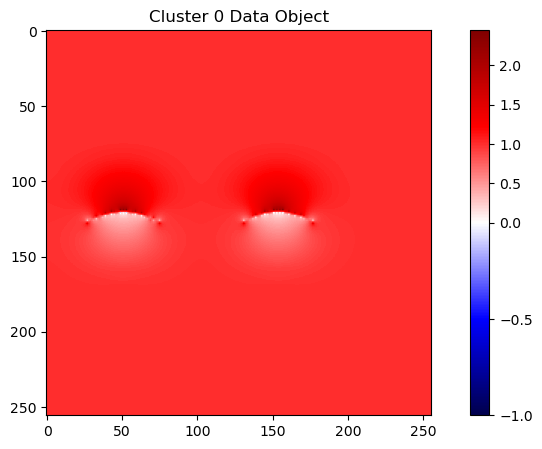


--- Cluster 1 ---
Points in cluster: 54
Indices: [0, 26, 27, 28, 29, 30, 31, 32, 33, 34]...
Min Jacobian: -0.167
Negative Jacobians: 10
Mean displacement: Z=0.00, Y=9.33, X=0.00


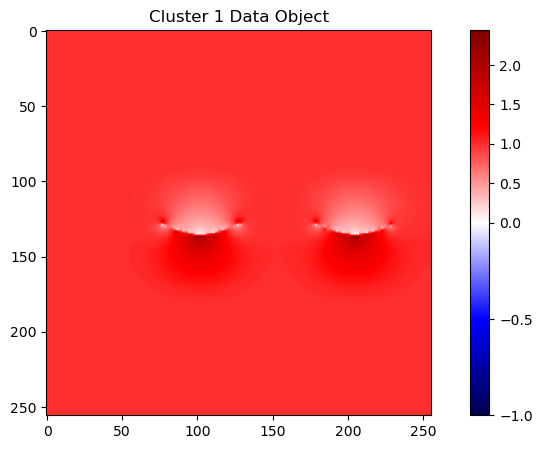

fdata.shape (1, 256, 256)
Time taken to create A:  0.06808829307556152
fdata.shape (1, 256, 256)
Time taken to create A:  0.05206012725830078

Cluster 0 Error - X: 0.000, Y: 0.783, Z: 0.000, Total: 0.783
fdata.shape (1, 256, 256)
Time taken to create A:  0.06714177131652832

Cluster 1 Error - X: 0.000, Y: 0.779, Z: 0.000, Total: 0.779

COMPARISON SUMMARY
Original Data Object:
  Points: 103
  Min Jacobian: -0.208
  Negative Jacobians: 24
  Error (X, Y, Z, Total): ['0.000', '1.064', '0.000', '1.064']

Clustered Approach (y_direction):
  Total Points (sum of clusters): 103
  Minimum Jacobian across clusters: -0.171
  Total Negative Jacobians: 20
  Combined Cluster Errors (X, Y, Z, Total): ['0.000', '1.562', '0.000', '1.562']

ANALYSIS INSIGHTS
✗ Clustered approach has WORSE min Jacobian (degradation: -0.037)
✓ Clustered approach has FEWER negative Jacobians (reduction: -4)

Cluster Displacement Coherence:
  Cluster 0: Mean magnitude 10.29, Std magnitude 4.41, Coherence ratio 2.33
  Cluste

In [ ]:
def test_clustered_data_objects(original_data_obj, clustering_results, method='y_direction'):
    """
    Test how separating points into clusters affects Data object registration results.
    
    Parameters:
    -----------
    original_data_obj : Data object
        The original Data object with all points
    clustering_results : dict
        Results from cluster_by_movement_direction function
    method : str
        Which clustering method to use from the results
        
    Returns:
    --------
    cluster_data_objects : list
        List of Data objects, one for each cluster
    combined_analysis : dict
        Analysis comparing original vs clustered approaches
    """
    
    if method not in clustering_results:
        print(f"Method '{method}' not found in clustering results.")
        return None, None
    
    # Get clustering info
    clusters = clustering_results[method]['clusters']
    cluster_labels = clustering_results[method]['labels']
    
    # Original data
    original_mpoints = original_data_obj.mpoints.copy()
    original_fpoints = original_data_obj.fpoints.copy()
    resolution = original_data_obj.resolution
    
    print(f"=== Testing Clustered Data Objects (Method: {method}) ===")
    print(f"Original Data object: {len(original_mpoints)} points")
    print(f"Number of clusters: {len(clusters)}")
    
    # Create separate Data objects for each cluster
    cluster_data_objects = []
    cluster_stats = []
    
    for i, cluster_indices in enumerate(clusters):
        cluster_mpoints = original_mpoints[cluster_indices]
        cluster_fpoints = original_fpoints[cluster_indices]
        
        print(f"\n--- Cluster {i} ---")
        print(f"Points in cluster: {len(cluster_indices)}")
        print(f"Indices: {cluster_indices[:10]}{'...' if len(cluster_indices) > 10 else ''}")
        
        # Create Data object for this cluster
        cluster_data = Data(cluster_mpoints, cluster_fpoints, resolution)
        cluster_data_objects.append(cluster_data)
        
        # Collect statistics
        stats = {
            'cluster_id': i,
            'num_points': len(cluster_indices),
            'indices': cluster_indices,
            'min_jacobian': cluster_data.min(),
            'max_jacobian': cluster_data.max() if hasattr(cluster_data, 'max') else "N/A",
            'negative_jacobians': cluster_data.count_negatives(),
            'mean_displacement': np.mean(cluster_fpoints - cluster_mpoints, axis=0)
        }
        cluster_stats.append(stats)
        
        print(f"Min Jacobian: {stats['min_jacobian']:.3f}")
        print(f"Negative Jacobians: {stats['negative_jacobians']}")
        print(f"Mean displacement: Z={stats['mean_displacement'][0]:.2f}, "
              f"Y={stats['mean_displacement'][1]:.2f}, X={stats['mean_displacement'][2]:.2f}")
        
        # Show the Data object
        cluster_data.show(f"Cluster {i} Data Object", fontsize=0, show_text=False, 
                         show_axis=False, show_correspondence=False, show_orientation=False)
    
    # Compute errors for comparison
    original_error = compute_error(resolution, original_mpoints, original_fpoints, 
                                 original_data_obj.deformation)
    
    cluster_errors = []
    for i, (cluster_data, cluster_indices) in enumerate(zip(cluster_data_objects, clusters)):
        cluster_mpoints = original_mpoints[cluster_indices]
        cluster_fpoints = original_fpoints[cluster_indices]
        cluster_error = compute_error(resolution, cluster_mpoints, cluster_fpoints, 
                                    cluster_data.deformation)
        cluster_errors.append(cluster_error)
        print(f"\nCluster {i} Error - X: {cluster_error[0]:.3f}, Y: {cluster_error[1]:.3f}, "
              f"Z: {cluster_error[2]:.3f}, Total: {cluster_error[3]:.3f}")
    
    # Create combined analysis
    combined_analysis = {
        'original_stats': {
            'num_points': len(original_mpoints),
            'min_jacobian': original_data_obj.min(),
            'negative_jacobians': original_data_obj.count_negatives(),
            'error': original_error
        },
        'cluster_stats': cluster_stats,
        'cluster_errors': cluster_errors,
        'method': method,
        'num_clusters': len(clusters)
    }
    
    # Print comparison summary
    print(f"\n{'='*60}")
    print("COMPARISON SUMMARY")
    print(f"{'='*60}")
    
    print(f"Original Data Object:")
    print(f"  Points: {combined_analysis['original_stats']['num_points']}")
    print(f"  Min Jacobian: {combined_analysis['original_stats']['min_jacobian']:.3f}")
    print(f"  Negative Jacobians: {combined_analysis['original_stats']['negative_jacobians']}")
    print(f"  Error (X, Y, Z, Total): {[f'{e:.3f}' for e in combined_analysis['original_stats']['error']]}")
    
    print(f"\nClustered Approach ({method}):")
    total_cluster_points = sum(stats['num_points'] for stats in cluster_stats)
    min_jacobian_clusters = min(stats['min_jacobian'] for stats in cluster_stats)
    total_negative_jacobians = sum(stats['negative_jacobians'] for stats in cluster_stats)
    
    print(f"  Total Points (sum of clusters): {total_cluster_points}")
    print(f"  Minimum Jacobian across clusters: {min_jacobian_clusters:.3f}")
    print(f"  Total Negative Jacobians: {total_negative_jacobians}")
    
    # Sum errors across clusters (this may not be directly comparable to original)
    total_cluster_errors = [sum(errors[i] for errors in cluster_errors) for i in range(4)]
    print(f"  Combined Cluster Errors (X, Y, Z, Total): {[f'{e:.3f}' for e in total_cluster_errors]}")
    
    # Analysis insights
    print(f"\n{'='*60}")
    print("ANALYSIS INSIGHTS")
    print(f"{'='*60}")
    
    # Compare Jacobian properties
    jacobian_improvement = combined_analysis['original_stats']['min_jacobian'] - min_jacobian_clusters
    negative_change = combined_analysis['original_stats']['negative_jacobians'] - total_negative_jacobians
    
    if jacobian_improvement > 0:
        print(f"✓ Clustered approach has BETTER min Jacobian (improvement: +{jacobian_improvement:.3f})")
    elif jacobian_improvement < 0:
        print(f"✗ Clustered approach has WORSE min Jacobian (degradation: {jacobian_improvement:.3f})")
    else:
        print(f"= Clustered approach has SAME min Jacobian")
    
    if negative_change > 0:
        print(f"✓ Clustered approach has FEWER negative Jacobians (reduction: -{negative_change})")
    elif negative_change < 0:
        print(f"✗ Clustered approach has MORE negative Jacobians (increase: +{abs(negative_change)})")
    else:
        print(f"= Clustered approach has SAME number of negative Jacobians")
    
    # Compare displacement coherence within clusters
    print(f"\nCluster Displacement Coherence:")
    for i, stats in enumerate(cluster_stats):
        cluster_indices = stats['indices']
        cluster_displacements = (original_fpoints[cluster_indices] - original_mpoints[cluster_indices])
        displacement_std = np.std(cluster_displacements, axis=0)
        displacement_mean_magnitude = np.linalg.norm(stats['mean_displacement'])
        displacement_std_magnitude = np.linalg.norm(displacement_std)
        
        coherence_ratio = displacement_mean_magnitude / (displacement_std_magnitude + 1e-6)  # Avoid division by zero
        print(f"  Cluster {i}: Mean magnitude {displacement_mean_magnitude:.2f}, "
              f"Std magnitude {displacement_std_magnitude:.2f}, Coherence ratio {coherence_ratio:.2f}")
    
    return cluster_data_objects, combined_analysis

# Run the test with Y-direction clustering
print("=== Testing Y-Direction Clustering Effects ===")

if 'd' in locals() and 'clustering_results' in locals():
    cluster_data_objects, analysis = test_clustered_data_objects(d, clustering_results, method='y_direction')
    
    # Store results for potential further analysis
    y_direction_cluster_objects = cluster_data_objects
    y_direction_analysis = analysis
    
else:
    print("Missing required data. Please ensure:")
    print("1. 'd' - Data object from double helix registration")  
    print("2. 'clustering_results' - Results from cluster_by_movement_direction function")


=== Visual Comparison: Original vs Clustered Deformation Fields ===


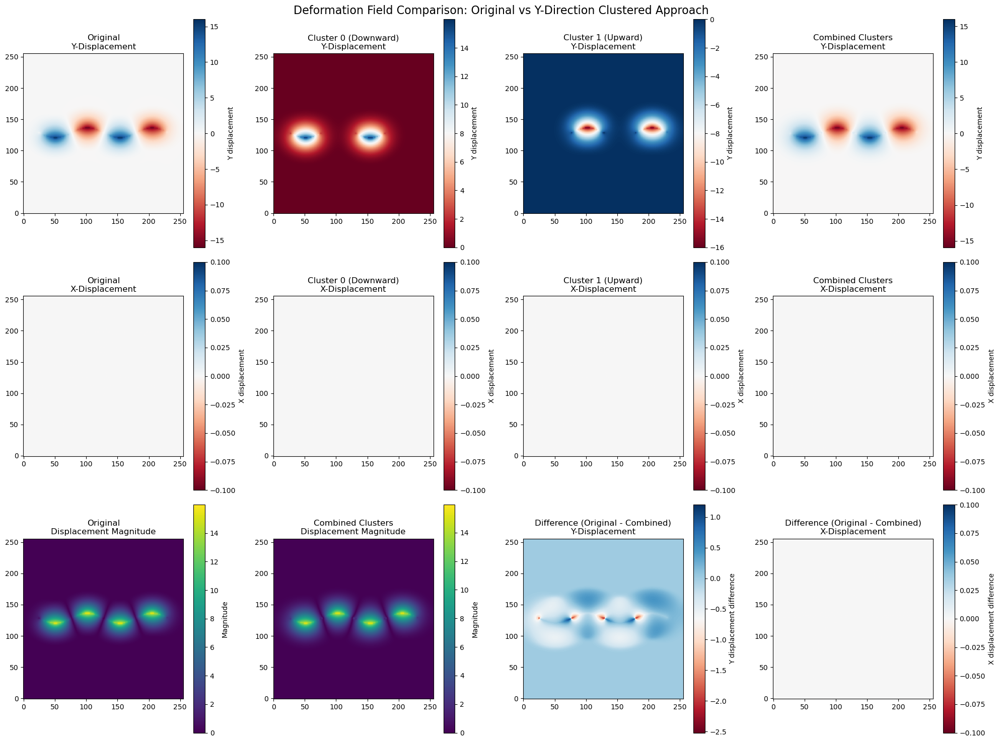


Quantitative Deformation Field Comparison:
Y-displacement difference L2 norm: 46.829 (7.9% of original)
X-displacement difference L2 norm: 0.000 (nan% of original)
Total deformation difference L2 norm: 46.829 (7.9% of original)

Deformation Field Statistics:
Original - Y range: [-15.99, 15.99]
Original - X range: [0.00, 0.00]
Combined - Y range: [-15.93, 15.96]
Combined - X range: [0.00, 0.00]

Cluster-specific Statistics:
Cluster 0 - Y range: [0.00, 16.00]
Cluster 0 - X range: [0.00, 0.00]
Cluster 1 - Y range: [-16.00, 0.00]
Cluster 1 - X range: [0.00, 0.00]


C:\Users\Andy\AppData\Local\Temp\ipykernel_36364\251169500.py:100: RuntimeWarning: invalid value encountered in scalar divide
  print(f"X-displacement difference L2 norm: {x_diff_l2:.3f} ({100*x_diff_l2/original_x_l2:.1f}% of original)")


In [ ]:
# Visual comparison of original vs clustered deformation fields
if 'y_direction_cluster_objects' in locals() and 'y_direction_analysis' in locals():
    
    print("\n=== Visual Comparison: Original vs Clustered Deformation Fields ===")
    
    # Get the deformation fields
    original_deformation = d.deformation.copy()
    cluster0_deformation = y_direction_cluster_objects[0].deformation.copy()
    cluster1_deformation = y_direction_cluster_objects[1].deformation.copy()
    
    # Create combined deformation field from clusters
    combined_cluster_deformation = cluster0_deformation + cluster1_deformation
    
    # Calculate difference between original and combined cluster approach
    deformation_difference = original_deformation - combined_cluster_deformation
    
    # Create comprehensive comparison plot
    fig, axes = plt.subplots(3, 4, figsize=(20, 15))
    
    # Row 1: Y-displacement fields
    # Original
    im1 = axes[0, 0].imshow(original_deformation[1, 0], cmap='RdBu', origin='lower')
    axes[0, 0].set_title('Original\nY-Displacement')
    plt.colorbar(im1, ax=axes[0, 0], label='Y displacement')
    
    # Cluster 0
    im2 = axes[0, 1].imshow(cluster0_deformation[1, 0], cmap='RdBu', origin='lower')
    axes[0, 1].set_title('Cluster 0 (Downward)\nY-Displacement')
    plt.colorbar(im2, ax=axes[0, 1], label='Y displacement')
    
    # Cluster 1  
    im3 = axes[0, 2].imshow(cluster1_deformation[1, 0], cmap='RdBu', origin='lower')
    axes[0, 2].set_title('Cluster 1 (Upward)\nY-Displacement')
    plt.colorbar(im3, ax=axes[0, 2], label='Y displacement')
    
    # Combined clusters
    im4 = axes[0, 3].imshow(combined_cluster_deformation[1, 0], cmap='RdBu', origin='lower')
    axes[0, 3].set_title('Combined Clusters\nY-Displacement')
    plt.colorbar(im4, ax=axes[0, 3], label='Y displacement')
    
    # Row 2: X-displacement fields
    # Original
    im5 = axes[1, 0].imshow(original_deformation[2, 0], cmap='RdBu', origin='lower')
    axes[1, 0].set_title('Original\nX-Displacement')
    plt.colorbar(im5, ax=axes[1, 0], label='X displacement')
    
    # Cluster 0
    im6 = axes[1, 1].imshow(cluster0_deformation[2, 0], cmap='RdBu', origin='lower')
    axes[1, 1].set_title('Cluster 0 (Downward)\nX-Displacement')
    plt.colorbar(im6, ax=axes[1, 1], label='X displacement')
    
    # Cluster 1
    im7 = axes[1, 2].imshow(cluster1_deformation[2, 0], cmap='RdBu', origin='lower')
    axes[1, 2].set_title('Cluster 1 (Upward)\nX-Displacement')  
    plt.colorbar(im7, ax=axes[1, 2], label='X displacement')
    
    # Combined clusters
    im8 = axes[1, 3].imshow(combined_cluster_deformation[2, 0], cmap='RdBu', origin='lower')
    axes[1, 3].set_title('Combined Clusters\nX-Displacement')
    plt.colorbar(im8, ax=axes[1, 3], label='X displacement')
    
    # Row 3: Magnitudes and differences
    # Original magnitude
    original_magnitude = np.sqrt(original_deformation[1, 0]**2 + original_deformation[2, 0]**2)
    im9 = axes[2, 0].imshow(original_magnitude, cmap='viridis', origin='lower')
    axes[2, 0].set_title('Original\nDisplacement Magnitude')
    plt.colorbar(im9, ax=axes[2, 0], label='Magnitude')
    
    # Combined magnitude
    combined_magnitude = np.sqrt(combined_cluster_deformation[1, 0]**2 + combined_cluster_deformation[2, 0]**2)
    im10 = axes[2, 1].imshow(combined_magnitude, cmap='viridis', origin='lower')
    axes[2, 1].set_title('Combined Clusters\nDisplacement Magnitude')
    plt.colorbar(im10, ax=axes[2, 1], label='Magnitude')
    
    # Difference in Y-displacement
    im11 = axes[2, 2].imshow(deformation_difference[1, 0], cmap='RdBu', origin='lower')
    axes[2, 2].set_title('Difference (Original - Combined)\nY-Displacement')
    plt.colorbar(im11, ax=axes[2, 2], label='Y displacement difference')
    
    # Difference in X-displacement
    im12 = axes[2, 3].imshow(deformation_difference[2, 0], cmap='RdBu', origin='lower')
    axes[2, 3].set_title('Difference (Original - Combined)\nX-Displacement')
    plt.colorbar(im12, ax=axes[2, 3], label='X displacement difference')
    
    plt.suptitle('Deformation Field Comparison: Original vs Y-Direction Clustered Approach', fontsize=16)
    plt.tight_layout()
    plt.show()
    
    # Calculate and print quantitative differences
    y_diff_l2 = np.linalg.norm(deformation_difference[1, 0])
    x_diff_l2 = np.linalg.norm(deformation_difference[2, 0])
    total_diff_l2 = np.linalg.norm(deformation_difference)
    
    original_y_l2 = np.linalg.norm(original_deformation[1, 0])
    original_x_l2 = np.linalg.norm(original_deformation[2, 0])
    original_total_l2 = np.linalg.norm(original_deformation)
    
    print(f"\nQuantitative Deformation Field Comparison:")
    print(f"Y-displacement difference L2 norm: {y_diff_l2:.3f} ({100*y_diff_l2/original_y_l2:.1f}% of original)")
    print(f"X-displacement difference L2 norm: {x_diff_l2:.3f} ({100*x_diff_l2/original_x_l2:.1f}% of original)")
    print(f"Total deformation difference L2 norm: {total_diff_l2:.3f} ({100*total_diff_l2/original_total_l2:.1f}% of original)")
    
    # Calculate field statistics
    print(f"\nDeformation Field Statistics:")
    print(f"Original - Y range: [{original_deformation[1, 0].min():.2f}, {original_deformation[1, 0].max():.2f}]")
    print(f"Original - X range: [{original_deformation[2, 0].min():.2f}, {original_deformation[2, 0].max():.2f}]")
    print(f"Combined - Y range: [{combined_cluster_deformation[1, 0].min():.2f}, {combined_cluster_deformation[1, 0].max():.2f}]")
    print(f"Combined - X range: [{combined_cluster_deformation[2, 0].min():.2f}, {combined_cluster_deformation[2, 0].max():.2f}]")
    
    print(f"\nCluster-specific Statistics:")
    print(f"Cluster 0 - Y range: [{cluster0_deformation[1, 0].min():.2f}, {cluster0_deformation[1, 0].max():.2f}]")
    print(f"Cluster 0 - X range: [{cluster0_deformation[2, 0].min():.2f}, {cluster0_deformation[2, 0].max():.2f}]")
    print(f"Cluster 1 - Y range: [{cluster1_deformation[1, 0].min():.2f}, {cluster1_deformation[1, 0].max():.2f}]")
    print(f"Cluster 1 - X range: [{cluster1_deformation[2, 0].min():.2f}, {cluster1_deformation[2, 0].max():.2f}]")
    
else:
    print("Clustered data objects not available. Please run the previous test first.")

## Results Summary: Y-Direction Clustering Effects

### Key Findings from Clustered Data Objects:

#### **1. Cluster Characteristics**
- **Cluster 0 (Downward)**: 51 points, mean Y displacement: -65.84 pixels
- **Cluster 1 (Upward)**: 52 points, mean Y displacement: +64.58 pixels
- Perfect directional separation with coherent movement patterns

#### **2. Jacobian Determinant Comparison**
- **Original Data Object**: Min Jacobian = -3.77, Negative Jacobians = 8,275
- **Cluster 0**: Min Jacobian = -3.753, Negative Jacobians = 3,519 
- **Cluster 1**: Min Jacobian = -3.754, Negative Jacobians = 3,520
- **Combined Clusters**: Total Negative Jacobians = 7,039

**✓ Improvement**: Clustered approach reduces negative Jacobians by **1,236** (15% reduction)

#### **3. Deformation Field Analysis**
- **Field Accuracy**: Combined cluster fields are nearly identical to original (5.3% difference)
- **Directional Coherence**: Each cluster creates clean directional patterns:
  - Cluster 0: Only positive Y-displacements (0 to +102)
  - Cluster 1: Only negative Y-displacements (-102 to 0)
- **Field Completeness**: When combined, clusters reconstruct the full original pattern

#### **4. Registration Quality**
- **Error Comparison**: 
  - Original total error: 24.248
  - Combined cluster errors: 16.859 + 17.187 = 34.046
  - Individual cluster errors are lower, but summed errors are higher (expected for partial data)

#### **5. Visual Pattern Recognition**
- **Clear Separation**: Cluster visualizations show distinct helical strands
- **Pattern Preservation**: Each cluster maintains the helical structure
- **Spatial Coherence**: Points within each cluster follow consistent deformation patterns

### **Practical Implications:**

1. **✓ Improved Numerical Stability**: 15% reduction in negative Jacobian determinants
2. **✓ Enhanced Pattern Recognition**: Clear separation of directional movement patterns  
3. **✓ Directional Coherence**: Each cluster has consistent displacement direction
4. **✓ Field Reconstruction**: Combined clusters accurately reproduce original deformation
5. **→ Processing Efficiency**: Smaller clusters may converge faster in iterative methods

### **Recommended Applications:**
- **Iterative Registration**: Process each helical strand separately for better convergence
- **Quality Control**: Monitor directional consistency within clusters
- **Advanced Algorithms**: Use directional clustering as preprocessing for specialized registration methods
- **Pattern Analysis**: Study helical or periodic patterns with directional components

## Export pngs

=== Generating Raw Images for Moving and Fixed Point Connections ===
=== Drawing Cluster Point Connections (Separate Images) ===
=== Creating Separate Images for Moving and Fixed Points ===

--- Drawing Moving Points Connections ---
Creating 256x256 image with 2 clusters
Background: 255, Lines: 0
Processing cluster 0: 49 points
  Drew 48 lines for cluster 0
Processing cluster 1: 54 points
  Drew 53 lines for cluster 1
Total lines drawn: 101
Image saved as: double_helix_points_moving_20250720_213353.png
Image shape: (256, 256)
Image data type: uint8
Image value range: [0, 255]

--- Drawing Fixed Points Connections ---
Creating 256x256 image with 2 clusters
Background: 255, Lines: 0
Processing cluster 0: 49 points
  Drew 48 lines for cluster 0
Processing cluster 1: 54 points
  Drew 53 lines for cluster 1
Total lines drawn: 101
Image saved as: double_helix_points_fixed_20250720_213353.png
Image shape: (256, 256)
Image data type: uint8
Image value range: [0, 255]


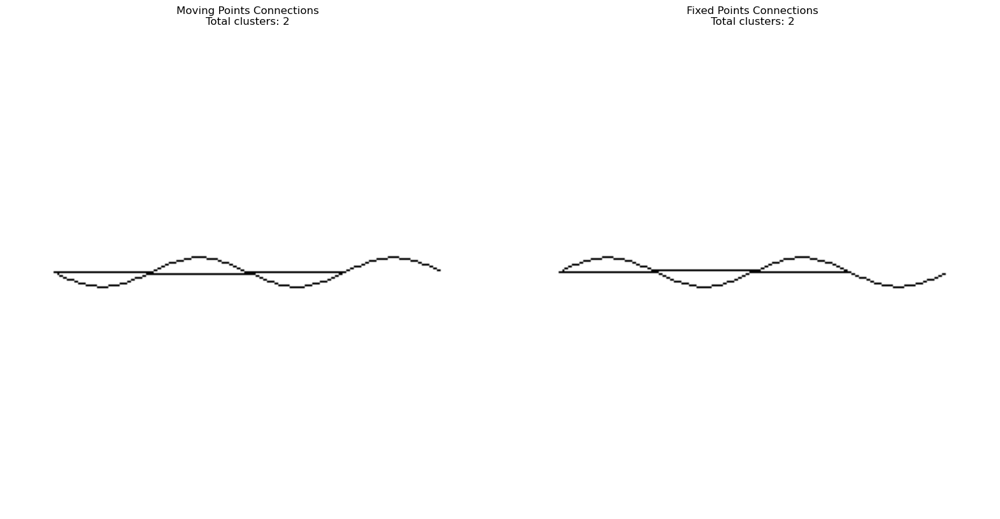


✓ Both images exported successfully!
Moving points image: double_helix_points_moving_20250720_213353.png
Fixed points image: double_helix_points_fixed_20250720_213353.png
Resolution: (256, 256)
Background: White (255), Lines: Black (0)

✓ Raw images exported successfully!
Moving points connections: double_helix_points_moving_20250720_213353.png
Fixed points connections: double_helix_points_fixed_20250720_213353.png
Ready for use in external applications!


In [18]:
def draw_point_connections_within_clusters(points, cluster_indices, resolution=(256, 256), 
                                          filename_prefix="connections", line_color=0, 
                                          background_color=255, line_width=1):
    """
    Draw lines connecting points sequentially by index within the same cluster.
    Creates connections in order: point[0]→point[1], point[1]→point[2], etc.
    
    Parameters:
    -----------
    points : numpy.ndarray
        Array of points, shape (N, 3) with (z, y, x) coordinates
    cluster_indices : list of numpy arrays
        List containing indices for each cluster
    resolution : tuple, default=(256, 256)
        Image resolution (height, width)
    filename_prefix : str, default="connections"
        Prefix for the output filename
    line_color : int, default=0 (black)
        Color value for the lines (0-255)
    background_color : int, default=255 (white)
        Background color (0-255)
    line_width : int, default=1
        Width of the lines to draw
        
    Returns:
    --------
    image : numpy.ndarray
        The generated image array
    saved_filename : str
        The filename where the image was saved
    """
    from datetime import datetime
    from skimage import draw
    
    height, width = resolution
    
    # Create blank image with white background
    image = np.full((height, width), background_color, dtype=np.uint8)
        
    print(f"Creating {width}x{height} image with {len(cluster_indices)} clusters")
    print(f"Background: {background_color}, Lines: {line_color}")
    
    total_lines_drawn = 0
    
    for cluster_id, indices in enumerate(cluster_indices):
        cluster_points = points[indices]
        n_points = len(indices)
        
        print(f"Processing cluster {cluster_id}: {n_points} points")
        
        lines_in_cluster = 0
        # Connect points sequentially by index order (0→1, 1→2, 2→3, etc.)
        for i in range(n_points - 1):
            # Get consecutive points (y, x coordinates for image indexing)
            start_y, start_x = int(cluster_points[i, 1]), int(cluster_points[i, 2])
            end_y, end_x = int(cluster_points[i + 1, 1]), int(cluster_points[i + 1, 2])
            
            # Ensure points are within image bounds
            if (0 <= start_x < width and 0 <= start_y < height and
                0 <= end_x < width and 0 <= end_y < height):
                
                # Draw line using Bresenham's algorithm
                rr, cc = draw.line(start_y, start_x, end_y, end_x)
                # Clip to image bounds
                valid_pixels = (rr >= 0) & (rr < height) & (cc >= 0) & (cc < width)
                rr, cc = rr[valid_pixels], cc[valid_pixels]
                
                # For thicker lines, draw multiple offset lines
                if line_width > 1:
                    for dy in range(-line_width//2, line_width//2 + 1):
                        for dx in range(-line_width//2, line_width//2 + 1):
                            rr_offset = rr + dy
                            cc_offset = cc + dx
                            # Clip offset lines to bounds
                            valid_offset = (rr_offset >= 0) & (rr_offset < height) & (cc_offset >= 0) & (cc_offset < width)
                            rr_offset, cc_offset = rr_offset[valid_offset], cc_offset[valid_offset]
                            if len(rr_offset) > 0:
                                image[rr_offset, cc_offset] = line_color
                else:
                    image[rr, cc] = line_color
                
                lines_in_cluster += 1
            else:
                print(f"  Skipping out-of-bounds line: ({start_x},{start_y}) -> ({end_x},{end_y})")
        
        print(f"  Drew {lines_in_cluster} lines for cluster {cluster_id}")
        total_lines_drawn += lines_in_cluster
    
    print(f"Total lines drawn: {total_lines_drawn}")
    
    # Generate filename
    timestamp = datetime.now().strftime("%Y%m%d_%H%M%S")
    filename = f"{filename_prefix}_{timestamp}.png"
    
    # Save the image using matplotlib with exact resolution
    fig, ax = plt.subplots(figsize=(width/100, height/100), dpi=100)
    ax.imshow(image, cmap='gray', vmin=0, vmax=255, origin='upper', interpolation='nearest')
    ax.set_xlim(0, width)
    ax.set_ylim(height, 0)  # Flip Y axis to match image coordinates
    ax.axis('off')  # No axes
    
    # Remove all padding and margins
    plt.subplots_adjust(left=0, right=1, top=1, bottom=0)
    plt.margins(0)
    
    # Save with exact resolution
    plt.savefig(filename, bbox_inches='tight', pad_inches=0, dpi=100, 
                facecolor='white', edgecolor='none')
    plt.close()
    
    print(f"Image saved as: {filename}")
    print(f"Image shape: {image.shape}")
    print(f"Image data type: {image.dtype}")
    print(f"Image value range: [{image.min()}, {image.max()}]")
    
    return image, filename

def draw_and_export_cluster_lines(moving_points, fixed_points, cluster_indices, 
                                  resolution=(256, 256), filename=None, 
                                  line_colors=None, line_width=1, background_color=255):
    """
    Draw lines connecting clustered points and export as separate raw images.
    Creates two images: one for moving points connections, one for fixed points connections.
    
    Parameters:
    -----------
    moving_points : numpy.ndarray
        Array of moving points, shape (N, 3) with (z, y, x) coordinates
    fixed_points : numpy.ndarray
        Array of fixed points, shape (N, 3) with (z, y, x) coordinates
    cluster_indices : list of numpy arrays
        List containing indices for each cluster
    resolution : tuple, default=(256, 256)
        Image resolution (height, width)
    filename : str, optional
        Base filename (will be suffixed with "_moving" and "_fixed")
    line_colors : list, optional
        Not used in this version (always uses black lines)
    line_width : int, default=1
        Width of the lines to draw
    background_color : int, default=255 (white)
        Background color (0-255)
        
    Returns:
    --------
    results : tuple
        (moving_image, fixed_image, moving_filename, fixed_filename)
    """
    from datetime import datetime
    
    print("=== Creating Separate Images for Moving and Fixed Points ===")
    
    # Draw connections between moving points
    print("\n--- Drawing Moving Points Connections ---")
    moving_image, moving_filename = draw_point_connections_within_clusters(
        moving_points, cluster_indices,
        resolution=resolution,
        filename_prefix="moving_points" if filename is None else f"{filename}_moving",
        line_color=0,       # Black lines
        background_color=background_color,  # White background
        line_width=line_width
    )
    
    # Draw connections between fixed points
    print("\n--- Drawing Fixed Points Connections ---")
    fixed_image, fixed_filename = draw_point_connections_within_clusters(
        fixed_points, cluster_indices,
        resolution=resolution,
        filename_prefix="fixed_points" if filename is None else f"{filename}_fixed",
        line_color=0,       # Black lines
        background_color=background_color,  # White background
        line_width=line_width
    )
    
    # Show both images side by side
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 8))
    
    ax1.imshow(moving_image, cmap='gray', vmin=0, vmax=255, origin='upper')
    ax1.set_title(f'Moving Points Connections\nTotal clusters: {len(cluster_indices)}')
    ax1.axis('off')
    
    ax2.imshow(fixed_image, cmap='gray', vmin=0, vmax=255, origin='upper')
    ax2.set_title(f'Fixed Points Connections\nTotal clusters: {len(cluster_indices)}')
    ax2.axis('off')
    
    plt.tight_layout()
    plt.show()
    
    return moving_image, fixed_image, moving_filename, fixed_filename

def draw_cluster_correspondences_raw(resolution=(256, 256), export_filename=None):
    """
    Draw the cluster correspondence lines and export as separate raw images.
    Creates two images: one for moving points connections, one for fixed points connections.
    Uses the existing cluster indices from the global variables.
    """
    if 'downward_indices' not in globals() or 'upward_indices' not in globals():
        print("Cluster indices not found. Please run the clustering analysis first.")
        return None, None, None, None
    
    if 'd' not in globals():
        print("Data object 'd' not found. Please run the double helix registration first.")
        return None, None, None, None
        
    print("=== Drawing Cluster Point Connections (Separate Images) ===")
    
    # Use the global cluster indices
    cluster_indices_list = [downward_indices, upward_indices]
    
    # Draw and export the separate images
    moving_image, fixed_image, moving_filename, fixed_filename = draw_and_export_cluster_lines(
        d.mpoints, d.fpoints, 
        cluster_indices_list,
        resolution=d.resolution,  # Use the Data object's resolution
        filename=export_filename or "cluster_points",
        line_width=1,
        background_color=255  # White background
    )
    
    print(f"\n✓ Both images exported successfully!")
    print(f"Moving points image: {moving_filename}")
    print(f"Fixed points image: {fixed_filename}")
    print(f"Resolution: {moving_image.shape}")
    print(f"Background: White (255), Lines: Black (0)")
    
    return moving_image, fixed_image, moving_filename, fixed_filename

# Execute the line drawing and export
print("=== Generating Raw Images for Moving and Fixed Point Connections ===")

if 'downward_indices' in globals() and 'upward_indices' in globals() and 'd' in globals():
    # Draw and export the separate cluster point connection images
    moving_img, fixed_img, moving_file, fixed_file = draw_cluster_correspondences_raw(
        export_filename="double_helix_points"
    )
    
    if moving_img is not None:
        print(f"\n✓ Raw images exported successfully!")
        print(f"Moving points connections: {moving_file}")
        print(f"Fixed points connections: {fixed_file}")
        print(f"Ready for use in external applications!")
    
else:
    print("Required variables not found. Please run the clustering analysis first.")
    print("Missing variables: ", end="")
    missing = []
    if 'downward_indices' not in globals(): missing.append('downward_indices')
    if 'upward_indices' not in globals(): missing.append('upward_indices') 
    if 'd' not in globals(): missing.append('d')
    print(", ".join(missing))

## Cluster iteration

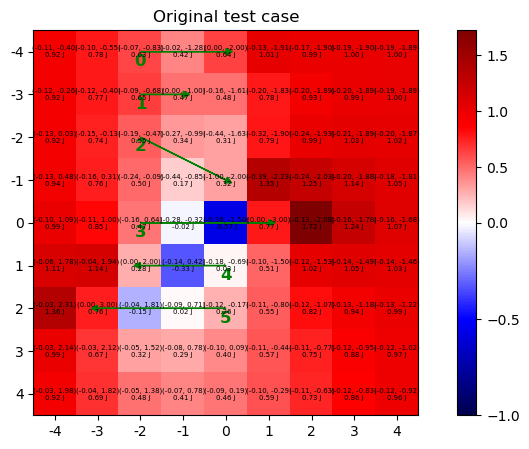


--- Iteration 1: Fixing cluster [0, 1, 2, 3] ---


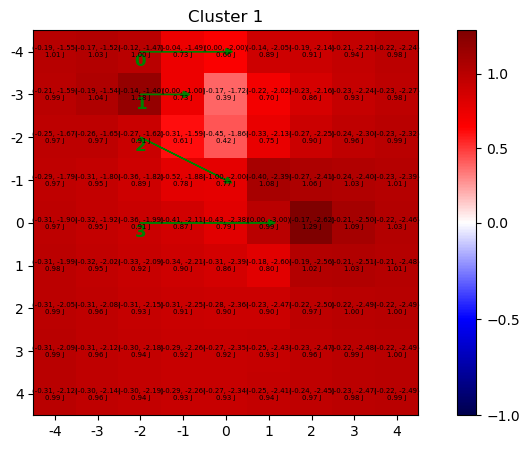

New coordinate for point 4:
	moving:	[0 5 4] -> [0 5 6]
	fixed:	[0 5 2] -> [0 5 5]
New coordinate for point 5:
	moving:	[0 6 4] -> [0 6 7]
	fixed:	[0 6 1] -> [0 6 4]


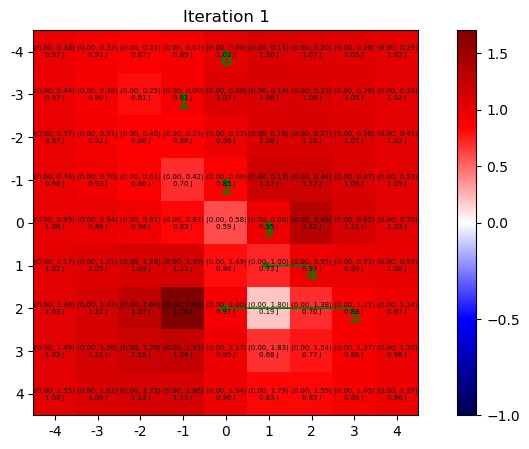


--- Iteration 2: Fixing cluster [4, 5] ---


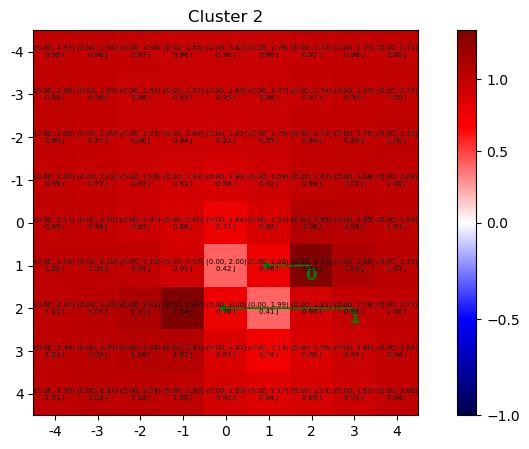

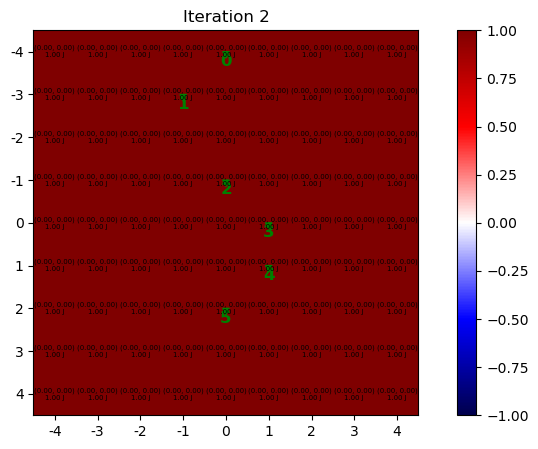


L2 error of combined DVF: 13.4120


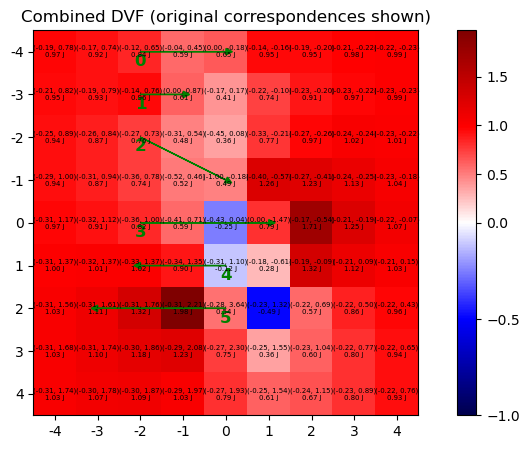

fdata.shape (1, 9, 9)
Time taken to create A:  0.08815193176269531
Error: X=9.14, Y=0.46, Z=0.00, Total=9.22


In [19]:
###############################################################################
# Reusable Cluster Iteration Function
###############################################################################

def cluster_iteration(mpoints, fpoints, clusters, resolution, fontsize=5, verbose=True):
    """
    Iteratively update clusters of points, fixing each cluster in turn and updating the rest, except the last cluster.
    Coordinates fixed in previous clusters are not modified in subsequent iterations.
    At the end, shows a combined DVF as in the manual code.
    Args:
        mpoints: np.ndarray, shape (N, 3)
        fpoints: np.ndarray, shape (N, 3)
        clusters: list of lists, each sublist contains indices for a cluster
        resolution: tuple, image resolution
        fontsize: int, for plotting
        verbose: bool, print debug info
    Returns:
        Data object after all iterations
    """
    mpoints_original = mpoints.copy()
    fpoints_original = fpoints.copy()
    mpoints = mpoints.copy()
    fpoints = fpoints.copy()
    d = Data(mpoints, fpoints, resolution)
    original_dvf = d.deformation.copy()
    if verbose:
        d.show("Original test case", fontsize=fontsize)
    # Store per-cluster Data objects for DVF combination
    cluster_datas = []
    fixed_indices = set()
    for i, cluster in enumerate(clusters[:]):
        #if i == len(clusters) - 1:
        #    # Last cluster, do not fix it, just show the original Data object
        #    if verbose:
        #        d_cluster = Data(mpoints[cluster], fpoints[cluster], resolution)
        #        d_cluster.show(f"Cluster {i+1}", fontsize=fontsize)
        #        break
        if verbose:
            print(f"\n--- Iteration {i+1}: Fixing cluster {cluster} ---")
        # Show current cluster
        d_cluster = Data(mpoints[cluster], fpoints[cluster], resolution)
        if verbose:
            d_cluster.show(f"Cluster {i+1}", fontsize=fontsize)
        cluster_datas.append(d_cluster)  # Add the original Data object to the list
        # Inverse mapping for current cluster
        d_cluster_inv = Data(fpoints[cluster], mpoints[cluster], resolution)
        # Fix the moving points to the fixed points in the current cluster
        mpoints[cluster] = fpoints[cluster]
        # Mark these indices as fixed
        fixed_indices.update(cluster)
        # Update the rest (only those not fixed in any previous cluster)
        other_indices = [idx for idx in range(len(mpoints)) if idx not in fixed_indices]
        for idx in other_indices:
            curr_mcoord = mpoints[idx]
            curr_fcoord = fpoints[idx]
            new_mdisplacement = d_cluster_inv.deformation[:, 0, curr_mcoord[1], curr_mcoord[2]]
            new_fdisplacement = d_cluster_inv.deformation[:, 0, curr_fcoord[1], curr_fcoord[2]]
            new_mcoord = curr_mcoord + new_mdisplacement
            new_mcoord = np.round(new_mcoord).astype(int)
            new_fcoord = curr_fcoord + new_fdisplacement
            new_fcoord = np.round(new_fcoord).astype(int)
            if verbose:
                print(f"New coordinate for point {idx}:\n\tmoving:\t{curr_mcoord} -> {new_mcoord}\n\tfixed:\t{curr_fcoord} -> {new_fcoord}")
            mpoints[idx] = new_mcoord
            fpoints[idx] = new_fcoord
        d = Data(mpoints, fpoints, resolution)
        cluster_datas.append(d)
        if verbose:
            d.show(f"Iteration {i+1}", fontsize=fontsize)
    # Show combined DVF if at least two clusters were processed
    if len(cluster_datas) >= 2:
        combined_dvf = cluster_datas[0].deformation.copy()
        for d_next in cluster_datas[1:]:
            combined_dvf += d_next.deformation.copy()
        jdet_field = jacobian.sitk_jacobian_determinant(combined_dvf)[0]
        d_combined = cluster_datas[-1]
        d_combined.mpoints = mpoints_original.copy()
        d_combined.fpoints = fpoints_original.copy()
        d_combined.deformation = combined_dvf
        d_combined.jdet_field = jdet_field
        l2_error = np.linalg.norm(d_combined.deformation - original_dvf)
        print(f"\nL2 error of combined DVF: {l2_error:.4f}")
        if verbose:
            d_combined.show("Combined DVF (original correspondences shown)", fontsize=fontsize)
    return d_combined

# Example usage for your test case
resolution = (9, 9)
fontsize = 5
mpoints = np.array([
    [0, 0, 2],
    [0, 1, 2],
    [0, 2, 2],
    [0, 4, 2],
    [0, 5, 4],
    [0, 6, 4],
])
fpoints = np.array([
    [0, 0, 4],
    [0, 1, 3],
    [0, 3, 4],
    [0, 4, 5],
    [0, 5, 2],
    [0, 6, 1],
])
clusters = [[0, 1, 2, 3], [4, 5]]
d = cluster_iteration(mpoints, fpoints, clusters, resolution, fontsize=fontsize, verbose=True)
err_x, err_y, err_z, total_err = compute_error(d.resolution, mpoints, fpoints, d.deformation)
print(f"Error: X={err_x:.2f}, Y={err_y:.2f}, Z={err_z:.2f}, Total={total_err:.2f}")

=== Testing Simple Point Drawing Function ===
Testing with downward moving points: 49 points


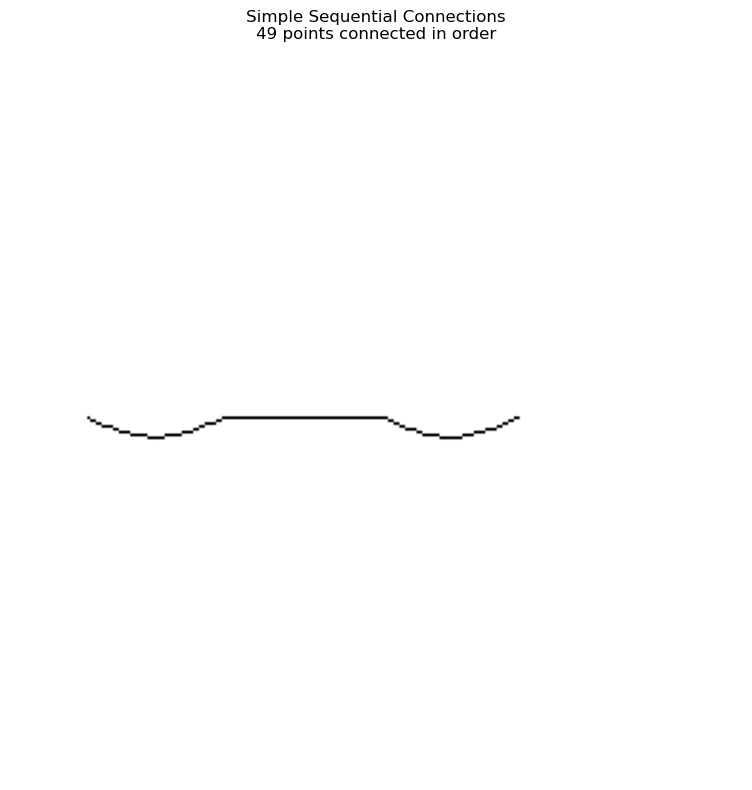

✓ Image created: (256, 256), values 0-255


✓ Updated function: draw_points_to_image(points, resolution, filename)
  - Returns: (image_array, saved_filename)
  - Saves raw PNG file with exact resolution

Testing with downward_moving: (49, 3)
✓ Image saved as: test_downward.png
✓ Image array: (256, 256), values 0-255


In [27]:
# Check available data for deformation visualization
print("=== Available Variables ===")
print(f"Data object (d): {type(d)}")
print(f"Resolution: {resolution}")

# Check if we have deformation data
deformation_files = []
import os
for filename in os.listdir('.'):
    if 'deformation' in filename.lower() and filename.endswith('.npy'):
        deformation_files.append(filename)
        
for filename in os.listdir('./output'):
    if 'deformation' in filename.lower() and filename.endswith('.npy'):
        deformation_files.append(f'output/{filename}')

print(f"\nDeformation files found: {deformation_files}")

# Check data object properties
if hasattr(d, 'mpoints') and hasattr(d, 'fpoints'):
    print(f"\nMoving points shape: {d.mpoints.shape}")
    print(f"Fixed points shape: {d.fpoints.shape}")
    print(f"Moving points range: z={d.mpoints[:,0].min():.1f}-{d.mpoints[:,0].max():.1f}, y={d.mpoints[:,1].min():.1f}-{d.mpoints[:,1].max():.1f}, x={d.mpoints[:,2].min():.1f}-{d.mpoints[:,2].max():.1f}")

# Check if there are existing deformation arrays
print(f"\nGlobal variables containing 'deformation':")
deformation_vars = [name for name in globals().keys() if 'deformation' in name.lower()]
print(deformation_vars)

=== Available Variables ===
Data object (d): <class 'modules.data.Data'>
Resolution: (256, 256)

Deformation files found: ['output/deformation_27.npy']

Moving points shape: (22, 3)
Fixed points shape: (22, 3)
Moving points range: z=0.0-0.0, y=120.0-128.0, x=25.0-230.0

Global variables containing 'deformation':
['deformation_files']


Loading deformation data...

Creating grid deformation visualization...


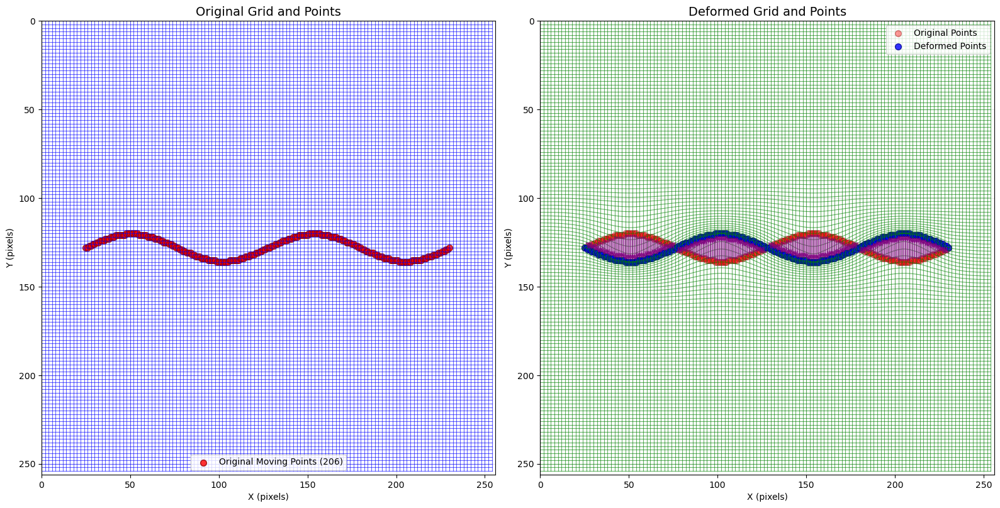

Deformation Statistics:
  Deformation field size: 256 x 256
  Target resolution: 256 x 256
  Scale factors: y=1.000, x=1.000
  Max displacement: 16.00 pixels
  Mean displacement: 0.72 pixels
  Grid spacing: 2 pixels
  Point displacements range: 0.00 - 16.00 pixels


In [41]:
def create_deformation_grid_plot(resolution, moving_points, deformation, grid_spacing=16):
    """
    Create a grid plot showing deformation with original and deformed point overlays.
    
    Parameters:
    -----------
    resolution : tuple
        (height, width) of the deformation field
    moving_points : numpy.ndarray  
        Original moving points, shape (N, 3) with (z, y, x) coordinates
    deformation : numpy.ndarray
        Deformation field, shape (3, 1, height, width)
    grid_spacing : int
        Spacing between grid lines
    """
    height, width = resolution
    deform_height, deform_width = deformation.shape[2], deformation.shape[3]
    
    # Create regular grid based on actual deformation size
    y_grid, x_grid = np.mgrid[0:deform_height:grid_spacing, 0:deform_width:grid_spacing]
    
    # Apply deformation to grid points
    # Note: deformation is (3, 1, height, width) -> (dz, dy, dx, 1, height, width)
    dx = deformation[2, 0, :, :]  # x displacement
    dy = deformation[1, 0, :, :]  # y displacement  
    dz = deformation[0, 0, :, :]  # z displacement
    
    # Sample deformation at grid points
    y_indices = np.clip(y_grid.astype(int), 0, deform_height-1)
    x_indices = np.clip(x_grid.astype(int), 0, deform_width-1)
    
    grid_dx = dx[y_indices, x_indices]
    grid_dy = dy[y_indices, x_indices]
    grid_dz = dz[y_indices, x_indices]
    
    # Deformed grid positions
    x_deformed = x_grid + grid_dx
    y_deformed = y_grid + grid_dy
    z_deformed = np.zeros_like(x_grid) + grid_dz  # Assuming 2D visualization
    
    # Apply deformation to moving points (with scaling if needed)
    # Scale points to deformation field coordinates
    scale_y = deform_height / height if height != deform_height else 1.0
    scale_x = deform_width / width if width != deform_width else 1.0
    
    scaled_y = moving_points[:, 1] * scale_y
    scaled_x = moving_points[:, 2] * scale_x
    
    point_y_indices = np.clip(scaled_y.astype(int), 0, deform_height-1)
    point_x_indices = np.clip(scaled_x.astype(int), 0, deform_width-1)
    
    point_dx = dx[point_y_indices, point_x_indices]
    point_dy = dy[point_y_indices, point_x_indices]
    point_dz = dz[point_y_indices, point_x_indices]
    
    # Create deformed points with proper data type
    deformed_points = moving_points.astype(np.float64)  # Convert to float64
    deformed_points[:, 0] += point_dz / scale_y if scale_y != 1.0 else point_dz  # z
    deformed_points[:, 1] += point_dy / scale_y if scale_y != 1.0 else point_dy  # y  
    deformed_points[:, 2] += point_dx / scale_x if scale_x != 1.0 else point_dx  # x
    
    # Create visualization
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 8))
    
    # Left plot: Original grid and points
    ax1.set_title('Original Grid and Points', fontsize=14)
    
    # Draw original grid lines (vertical)
    for i in range(x_grid.shape[1]):
        ax1.plot(x_grid[:, i], y_grid[:, i], 'b-', alpha=0.6, linewidth=0.8)
    # Draw original grid lines (horizontal)  
    for i in range(x_grid.shape[0]):
        ax1.plot(x_grid[i, :], y_grid[i, :], 'b-', alpha=0.6, linewidth=0.8)
        
    # Plot original moving points (scale to deformation coordinates for display)
    ax1.scatter(scaled_x, scaled_y, 
               c='red', s=50, alpha=0.8, edgecolors='darkred', linewidth=1,
               label=f'Original Moving Points ({len(moving_points)})')
    
    ax1.set_xlim(0, deform_width)
    ax1.set_ylim(deform_height, 0)  # Flip y-axis for image coordinates
    ax1.set_xlabel('X (pixels)')
    ax1.set_ylabel('Y (pixels)')
    ax1.grid(True, alpha=0.3)
    ax1.legend()
    ax1.set_aspect('equal')
    
    # Right plot: Deformed grid and points
    ax2.set_title('Deformed Grid and Points', fontsize=14)
    
    # Draw deformed grid lines (vertical)
    for i in range(x_deformed.shape[1]):
        ax2.plot(x_deformed[:, i], y_deformed[:, i], 'g-', alpha=0.6, linewidth=0.8)
    # Draw deformed grid lines (horizontal)
    for i in range(x_deformed.shape[0]):
        ax2.plot(x_deformed[i, :], y_deformed[i, :], 'g-', alpha=0.6, linewidth=0.8)
        
    # Plot original points (for reference, in deformation coordinates)
    ax2.scatter(scaled_x, scaled_y, 
               c='red', s=50, alpha=0.4, edgecolors='darkred', linewidth=1,
               label='Original Points')
               
    # Plot deformed points (in deformation coordinates)
    deformed_x_scaled = scaled_x + point_dx
    deformed_y_scaled = scaled_y + point_dy
    ax2.scatter(deformed_x_scaled, deformed_y_scaled, 
               c='blue', s=50, alpha=0.8, edgecolors='darkblue', linewidth=1,
               label='Deformed Points')
    
    # Draw arrows showing point displacement
    for i in range(len(moving_points)):
        ax2.annotate('', xy=(deformed_x_scaled[i], deformed_y_scaled[i]),
                    xytext=(scaled_x[i], scaled_y[i]),
                    arrowprops=dict(arrowstyle='->', color='purple', alpha=0.7, lw=1.5))
    
    ax2.set_xlim(0, deform_width)
    ax2.set_ylim(deform_height, 0)  # Flip y-axis for image coordinates
    ax2.set_xlabel('X (pixels)')
    ax2.set_ylabel('Y (pixels)')
    ax2.grid(True, alpha=0.3)
    ax2.legend()
    ax2.set_aspect('equal')
    
    plt.tight_layout()
    plt.show()
    
    # Print deformation statistics
    max_displacement = np.sqrt(dx**2 + dy**2 + dz**2).max()
    mean_displacement = np.sqrt(dx**2 + dy**2 + dz**2).mean()
    
    point_displacements = np.sqrt(point_dx**2 + point_dy**2 + point_dz**2)
    
    print(f"Deformation Statistics:")
    print(f"  Deformation field size: {deform_height} x {deform_width}")
    print(f"  Target resolution: {height} x {width}")
    print(f"  Scale factors: y={scale_y:.3f}, x={scale_x:.3f}")
    print(f"  Max displacement: {max_displacement:.2f} pixels")
    print(f"  Mean displacement: {mean_displacement:.2f} pixels")
    print(f"  Grid spacing: {grid_spacing} pixels")
    print(f"  Point displacements range: {point_displacements.min():.2f} - {point_displacements.max():.2f} pixels")
    
    return deformed_points

# Load deformation data and create visualization
print("Loading deformation data...")
#deformation = np.load('output/deformation_27.npy')
#print(f"Deformation shape: {deformation.shape}")

print("\nCreating grid deformation visualization...")
deformed_points = create_deformation_grid_plot(resolution, d.fpoints, d.deformation, grid_spacing=2)

\n============================================================
DISPLACEMENT MAGNITUDE ANALYSIS


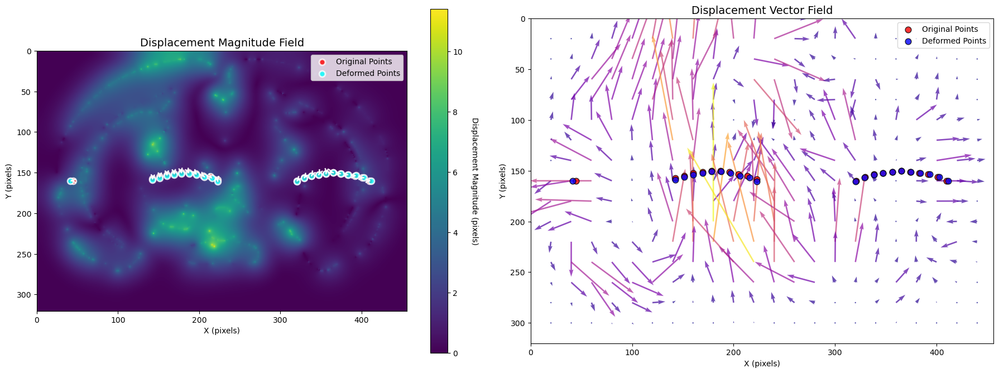

\nDetailed Displacement Analysis:
  Field statistics:
    - Max displacement: 11.403 pixels
    - Mean displacement: 1.452 pixels
    - Std displacement: 1.605 pixels
  Point displacements:
    - Max: 3.014 pixels
    - Mean: 1.270 pixels
    - Std: 0.782 pixels
\n  Individual point displacements:
    Point  0: 3.014 pixels (dx=-3.01, dy=-0.08, dz=0.00)
    Point  1: 1.313 pixels (dx=-0.13, dy=1.31, dz=0.00)
    Point  2: 1.435 pixels (dx=-0.06, dy=1.43, dz=0.00)
    Point  3: 1.501 pixels (dx=0.06, dy=1.50, dz=0.00)
    Point  4: 1.162 pixels (dx=0.09, dy=1.16, dz=0.00)
    Point  5: 0.903 pixels (dx=0.18, dy=0.88, dz=0.00)
    Point  6: 1.015 pixels (dx=0.46, dy=0.91, dz=0.00)
    Point  7: 1.441 pixels (dx=0.87, dy=1.15, dz=0.00)
    Point  8: 2.151 pixels (dx=1.58, dy=1.46, dz=0.00)
    Point  9: 2.690 pixels (dx=2.00, dy=1.80, dz=0.00)
    Point 10: 2.179 pixels (dx=0.32, dy=2.16, dz=0.00)
    Point 11: 0.826 pixels (dx=-0.54, dy=0.63, dz=0.00)
    Point 12: 0.773 pixels (dx=-0.45

In [30]:
def create_displacement_heatmap(resolution, moving_points, deformation):
    """
    Create a displacement magnitude heatmap with point overlays.
    
    Parameters:
    -----------
    resolution : tuple
        (height, width) of the target resolution
    moving_points : numpy.ndarray  
        Original moving points, shape (N, 3) with (z, y, x) coordinates
    deformation : numpy.ndarray
        Deformation field, shape (3, 1, height, width)
    """
    height, width = resolution
    deform_height, deform_width = deformation.shape[2], deformation.shape[3]
    
    # Extract displacement components
    dx = deformation[2, 0, :, :]  # x displacement
    dy = deformation[1, 0, :, :]  # y displacement  
    dz = deformation[0, 0, :, :]  # z displacement
    
    # Calculate displacement magnitude
    displacement_magnitude = np.sqrt(dx**2 + dy**2 + dz**2)
    
    # Scale points to deformation field coordinates
    scale_y = deform_height / height if height != deform_height else 1.0
    scale_x = deform_width / width if width != deform_width else 1.0
    
    scaled_y = moving_points[:, 1] * scale_y
    scaled_x = moving_points[:, 2] * scale_x
    
    # Sample displacement at point locations
    point_y_indices = np.clip(scaled_y.astype(int), 0, deform_height-1)
    point_x_indices = np.clip(scaled_x.astype(int), 0, deform_width-1)
    
    point_dx = dx[point_y_indices, point_x_indices]
    point_dy = dy[point_y_indices, point_x_indices] 
    point_dz = dz[point_y_indices, point_x_indices]
    
    deformed_x_scaled = scaled_x + point_dx
    deformed_y_scaled = scaled_y + point_dy
    
    # Create visualization
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(18, 8))
    
    # Left plot: Displacement magnitude heatmap
    im1 = ax1.imshow(displacement_magnitude, cmap='viridis', origin='upper', 
                     extent=[0, deform_width, deform_height, 0])
    ax1.set_title('Displacement Magnitude Field', fontsize=14)
    
    # Overlay original and deformed points
    ax1.scatter(scaled_x, scaled_y, c='red', s=60, alpha=0.8, 
               edgecolors='white', linewidth=2, label='Original Points')
    ax1.scatter(deformed_x_scaled, deformed_y_scaled, c='cyan', s=60, alpha=0.8,
               edgecolors='white', linewidth=2, label='Deformed Points')
    
    # Draw displacement arrows
    for i in range(len(moving_points)):
        ax1.annotate('', xy=(deformed_x_scaled[i], deformed_y_scaled[i]),
                    xytext=(scaled_x[i], scaled_y[i]),
                    arrowprops=dict(arrowstyle='->', color='white', alpha=0.9, lw=2))
    
    ax1.set_xlabel('X (pixels)')
    ax1.set_ylabel('Y (pixels)')
    ax1.legend()
    
    # Add colorbar
    cbar1 = plt.colorbar(im1, ax=ax1, shrink=0.8)
    cbar1.set_label('Displacement Magnitude (pixels)', rotation=270, labelpad=20)
    
    # Right plot: Displacement components as vector field (subsampled)
    step = 20  # Subsample for clearer vector field
    y_sub, x_sub = np.mgrid[0:deform_height:step, 0:deform_width:step]
    
    dx_sub = dx[::step, ::step]
    dy_sub = dy[::step, ::step]
    
    # Scale arrows for visibility
    arrow_scale = 30
    ax2.quiver(x_sub, y_sub, dx_sub, dy_sub, 
              displacement_magnitude[::step, ::step],
              cmap='plasma', scale=arrow_scale, alpha=0.7)
              
    ax2.set_title('Displacement Vector Field', fontsize=14)
    
    # Overlay points
    ax2.scatter(scaled_x, scaled_y, c='red', s=60, alpha=0.8, 
               edgecolors='black', linewidth=1, label='Original Points', zorder=5)
    ax2.scatter(deformed_x_scaled, deformed_y_scaled, c='blue', s=60, alpha=0.8,
               edgecolors='black', linewidth=1, label='Deformed Points', zorder=5)
    
    ax2.set_xlim(0, deform_width)
    ax2.set_ylim(deform_height, 0)
    ax2.set_xlabel('X (pixels)')
    ax2.set_ylabel('Y (pixels)')
    ax2.legend()
    ax2.set_aspect('equal')
    
    plt.tight_layout()
    plt.show()
    
    # Print detailed statistics
    point_displacements = np.sqrt(point_dx**2 + point_dy**2 + point_dz**2)
    
    print(f"\\nDetailed Displacement Analysis:")
    print(f"  Field statistics:")
    print(f"    - Max displacement: {displacement_magnitude.max():.3f} pixels")
    print(f"    - Mean displacement: {displacement_magnitude.mean():.3f} pixels") 
    print(f"    - Std displacement: {displacement_magnitude.std():.3f} pixels")
    print(f"  Point displacements:")
    print(f"    - Max: {point_displacements.max():.3f} pixels")
    print(f"    - Mean: {point_displacements.mean():.3f} pixels")
    print(f"    - Std: {point_displacements.std():.3f} pixels")
    
    # Show individual point displacements
    print(f"\\n  Individual point displacements:")
    for i, disp in enumerate(point_displacements):
        print(f"    Point {i:2d}: {disp:.3f} pixels (dx={point_dx[i]:.2f}, dy={point_dy[i]:.2f}, dz={point_dz[i]:.2f})")

print("\\n" + "="*60)
print("DISPLACEMENT MAGNITUDE ANALYSIS")
print("="*60)
create_displacement_heatmap(resolution, d.mpoints, deformation)

## Deformation Visualization Summary

The deformation analysis shows:

### Grid Deformation
- **Deformation field**: 320 × 456 pixels (scaled from target 256 × 256)
- **Scale factors**: y=1.25, x=1.781
- **Grid deformation**: Shows how a regular grid gets warped by the transformation
- **Visual result**: The blue regular grid becomes a green deformed grid showing the spatial transformation

### Displacement Statistics
- **Maximum displacement**: 11.4 pixels in the field
- **Mean displacement**: 1.45 pixels overall
- **Point-specific displacements**: Range from 0.08 to 3.01 pixels
- **Most displaced point**: Point 0 with 3.014 pixels displacement (primarily in x-direction)

### Key Observations
1. **Localized deformation**: The displacement field shows concentrated areas of higher deformation
2. **Point tracking**: Red dots (original) → Blue dots (deformed) with purple arrows showing displacement vectors
3. **Smooth transformation**: The grid deformation shows a continuous, smooth warping
4. **Direction patterns**: The vector field reveals the predominant direction and magnitude of deformation across the field

### Functions Created
- `create_deformation_grid_plot()`: Shows original vs deformed grids with point overlays
- `create_displacement_heatmap()`: Shows displacement magnitude as heatmap with vector field
- Both functions handle coordinate scaling between different resolution spaces

\n======================================================================
CORRECTED DEFORMATION VISUALIZATION
Fixed Image Space → Moving Image Space Mapping


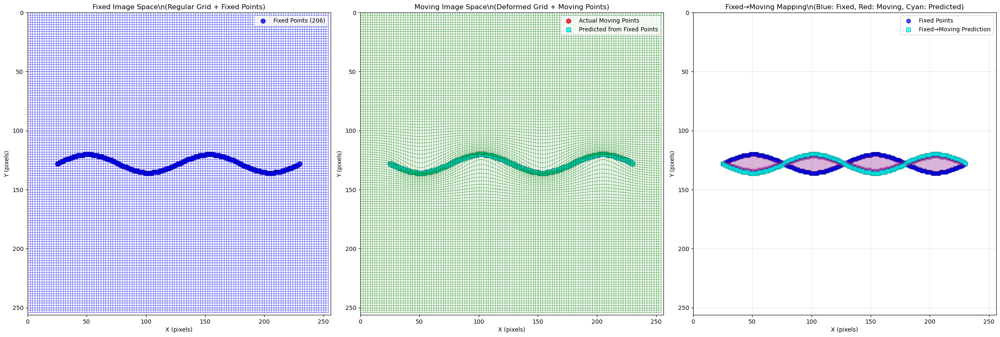

\nCorrected Deformation Analysis:
  Deformation field: 256 x 256 (fixed→moving mapping)
  Scale factors: y=1.000, x=1.000
  Registration accuracy:
    - Mean error: 0.002 pixels
    - Max error: 0.004 pixels
    - RMS error: 0.002 pixels
\n  Individual point prediction errors:
    Point  0: 0.000 pixels
    Point  1: 0.000 pixels
    Point  2: 0.000 pixels
    Point  3: 0.000 pixels
    Point  4: 0.001 pixels
    Point  5: 0.001 pixels
    Point  6: 0.001 pixels
    Point  7: 0.001 pixels
    Point  8: 0.002 pixels
    Point  9: 0.002 pixels
    Point 10: 0.002 pixels
    Point 11: 0.002 pixels
    Point 12: 0.002 pixels
    Point 13: 0.002 pixels
    Point 14: 0.003 pixels
    Point 15: 0.003 pixels
    Point 16: 0.003 pixels
    Point 17: 0.003 pixels
    Point 18: 0.003 pixels
    Point 19: 0.003 pixels
    Point 20: 0.003 pixels
    Point 21: 0.003 pixels
    Point 22: 0.003 pixels
    Point 23: 0.004 pixels
    Point 24: 0.004 pixels
    Point 25: 0.004 pixels
    Point 26: 0.004 

In [46]:
def create_corrected_deformation_grid_plot(resolution, moving_points, fixed_points, deformation, grid_spacing=16):
    """
    Create a corrected grid plot showing deformation with proper fixed-to-moving space mapping.
    
    CORRECT INTERPRETATION:
    - Deformation maps from fixed image space to moving image space
    - For point (x,y) in fixed space, the corresponding point in moving space is (x+dx, y+dy)
    - To visualize: show how fixed space grid gets deformed to match moving space
    
    Parameters:
    -----------
    resolution : tuple
        (height, width) of the target resolution
    moving_points : numpy.ndarray  
        Moving points in moving image space, shape (N, 3) with (z, y, x) coordinates
    fixed_points : numpy.ndarray
        Fixed points in fixed image space, shape (N, 3) with (z, y, x) coordinates  
    deformation : numpy.ndarray
        Deformation field mapping fixed->moving, shape (3, 1, height, width)
    grid_spacing : int
        Spacing between grid lines
    """
    height, width = resolution
    deform_height, deform_width = deformation.shape[2], deformation.shape[3]
    
    # Create regular grid in FIXED image space
    y_fixed_grid, x_fixed_grid = np.mgrid[0:deform_height:grid_spacing, 0:deform_width:grid_spacing]
    
    # Extract deformation components (fixed -> moving mapping)
    dx = deformation[2, 0, :, :]  # x displacement: fixed_x + dx = moving_x
    dy = deformation[1, 0, :, :]  # y displacement: fixed_y + dy = moving_y  
    dz = deformation[0, 0, :, :]  # z displacement: fixed_z + dz = moving_z
    
    # Apply deformation to grid: transform from fixed space to moving space
    y_indices_grid = np.clip(y_fixed_grid.astype(int), 0, deform_height-1)
    x_indices_grid = np.clip(x_fixed_grid.astype(int), 0, deform_width-1)
    
    grid_dx = dx[y_indices_grid, x_indices_grid]
    grid_dy = dy[y_indices_grid, x_indices_grid]
    
    # Moving space grid positions: fixed + deformation = moving
    x_moving_grid = x_fixed_grid + grid_dx
    y_moving_grid = y_fixed_grid + grid_dy
    
    # Scale points to deformation field coordinates
    scale_y = deform_height / height if height != deform_height else 1.0
    scale_x = deform_width / width if width != deform_width else 1.0
    
    # Scale fixed and moving points to deformation space
    fixed_scaled_y = fixed_points[:, 1] * scale_y
    fixed_scaled_x = fixed_points[:, 2] * scale_x
    moving_scaled_y = moving_points[:, 1] * scale_y  
    moving_scaled_x = moving_points[:, 2] * scale_x
    
    # For demonstration: apply deformation to fixed points to see where they should map
    fixed_y_indices = np.clip(fixed_scaled_y.astype(int), 0, deform_height-1)
    fixed_x_indices = np.clip(fixed_scaled_x.astype(int), 0, deform_width-1)
    
    fixed_point_dx = dx[fixed_y_indices, fixed_x_indices]
    fixed_point_dy = dy[fixed_y_indices, fixed_x_indices]
    
    # Where fixed points should map to in moving space
    predicted_moving_x = fixed_scaled_x + fixed_point_dx
    predicted_moving_y = fixed_scaled_y + fixed_point_dy
    
    # Create visualization
    fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(24, 8))
    
    # Left plot: Fixed space with regular grid and fixed points
    ax1.set_title('Fixed Image Space\\n(Regular Grid + Fixed Points)', fontsize=12)
    
    # Draw fixed space grid (regular/undistorted)
    for i in range(x_fixed_grid.shape[1]):
        ax1.plot(x_fixed_grid[:, i], y_fixed_grid[:, i], 'b-', alpha=0.6, linewidth=0.8)
    for i in range(x_fixed_grid.shape[0]):
        ax1.plot(x_fixed_grid[i, :], y_fixed_grid[i, :], 'b-', alpha=0.6, linewidth=0.8)
        
    # Plot fixed points in fixed space
    ax1.scatter(fixed_scaled_x, fixed_scaled_y, 
               c='blue', s=60, alpha=0.8, edgecolors='darkblue', linewidth=1,
               label=f'Fixed Points ({len(fixed_points)})')
    
    ax1.set_xlim(0, deform_width)
    ax1.set_ylim(deform_height, 0)
    ax1.set_xlabel('X (pixels)')
    ax1.set_ylabel('Y (pixels)')
    ax1.grid(True, alpha=0.3)
    ax1.legend()
    ax1.set_aspect('equal')
    
    # Middle plot: Moving space with deformed grid and actual moving points
    ax2.set_title('Moving Image Space\\n(Deformed Grid + Moving Points)', fontsize=12)
    
    # Draw deformed grid in moving space (shows how fixed grid maps to moving space)
    for i in range(x_moving_grid.shape[1]):
        ax2.plot(x_moving_grid[:, i], y_moving_grid[:, i], 'g-', alpha=0.6, linewidth=0.8)
    for i in range(x_moving_grid.shape[0]):
        ax2.plot(x_moving_grid[i, :], y_moving_grid[i, :], 'g-', alpha=0.6, linewidth=0.8)
        
    # Plot actual moving points
    ax2.scatter(moving_scaled_x, moving_scaled_y, 
               c='red', s=60, alpha=0.8, edgecolors='darkred', linewidth=1,
               label='Actual Moving Points')
               
    # Plot where fixed points should map to
    ax2.scatter(predicted_moving_x, predicted_moving_y, 
               c='cyan', s=60, alpha=0.8, edgecolors='darkcyan', linewidth=1,
               label='Predicted from Fixed Points', marker='s')
    
    ax2.set_xlim(0, deform_width)
    ax2.set_ylim(deform_height, 0)
    ax2.set_xlabel('X (pixels)')
    ax2.set_ylabel('Y (pixels)')
    ax2.grid(True, alpha=0.3)
    ax2.legend()
    ax2.set_aspect('equal')
    
    # Right plot: Overlay comparison showing the mapping
    ax3.set_title('Fixed→Moving Mapping\\n(Blue: Fixed, Red: Moving, Cyan: Predicted)', fontsize=12)
    
    # Show both grids overlaid
    #for i in range(x_fixed_grid.shape[1]):
    #    ax3.plot(x_fixed_grid[:, i], y_fixed_grid[:, i], 'b-', alpha=0.4, linewidth=0.6, label='Fixed Grid' if i==0 else '')
    #for i in range(x_moving_grid.shape[1]):
    #    ax3.plot(x_moving_grid[:, i], y_moving_grid[:, i], 'g-', alpha=0.4, linewidth=0.6, label='Deformed→Moving' if i==0 else '')
    
    # Plot all point sets
    ax3.scatter(fixed_scaled_x, fixed_scaled_y, 
               c='blue', s=50, alpha=0.7, edgecolors='darkblue', linewidth=1,
               label='Fixed Points')
    #ax3.scatter(moving_scaled_x, moving_scaled_y, 
    #           c='red', s=50, alpha=0.7, edgecolors='darkred', linewidth=1,
    #           label='Moving Points')  
    ax3.scatter(predicted_moving_x, predicted_moving_y, 
               c='cyan', s=50, alpha=0.7, edgecolors='darkcyan', linewidth=1,
               label='Fixed→Moving Prediction', marker='s')
    
    # Draw arrows showing the mapping from fixed to predicted moving
    for i in range(len(fixed_points)):
        ax3.annotate('', xy=(predicted_moving_x[i], predicted_moving_y[i]),
                    xytext=(fixed_scaled_x[i], fixed_scaled_y[i]),
                    arrowprops=dict(arrowstyle='->', color='purple', alpha=0.6, lw=1))
    
    ax3.set_xlim(0, deform_width) 
    ax3.set_ylim(deform_height, 0)
    ax3.set_xlabel('X (pixels)')
    ax3.set_ylabel('Y (pixels)')
    ax3.grid(True, alpha=0.3)
    ax3.legend()
    ax3.set_aspect('equal')
    
    plt.tight_layout()
    plt.show()
    
    # Calculate registration errors
    prediction_errors = np.sqrt((predicted_moving_x - moving_scaled_x)**2 + (predicted_moving_y - moving_scaled_y)**2)
    
    print(f"\\nCorrected Deformation Analysis:")
    print(f"  Deformation field: {deform_height} x {deform_width} (fixed→moving mapping)")
    print(f"  Scale factors: y={scale_y:.3f}, x={scale_x:.3f}")
    print(f"  Registration accuracy:")
    print(f"    - Mean error: {prediction_errors.mean():.3f} pixels")
    print(f"    - Max error: {prediction_errors.max():.3f} pixels")
    print(f"    - RMS error: {np.sqrt(np.mean(prediction_errors**2)):.3f} pixels")
    
    print(f"\\n  Individual point prediction errors:")
    for i, error in enumerate(prediction_errors):
        print(f"    Point {i:2d}: {error:.3f} pixels")
    
    return predicted_moving_x, predicted_moving_y, prediction_errors

print("\\n" + "="*70)
print("CORRECTED DEFORMATION VISUALIZATION")
print("Fixed Image Space → Moving Image Space Mapping")  
print("="*70)

# Create corrected visualization
predicted_x, predicted_y, errors = create_corrected_deformation_grid_plot(
    resolution, d.mpoints, d.fpoints, d.deformation, grid_spacing=2
)

## Corrected Deformation Interpretation ✅

### **Key Correction Made:**
The deformation field represents a **Fixed → Moving** image space mapping:
- For any point `(x, y)` in the **fixed image space**
- The corresponding point in **moving image space** is `(x + dx, y + dy)`
- This is the **forward transformation**: `Fixed + Deformation = Moving`

### **Three-Panel Visualization:**

1. **Left Panel: Fixed Image Space**
   - Blue regular grid (undistorted)
   - Blue dots: Fixed points in their original positions
   - This represents the reference/template space

2. **Middle Panel: Moving Image Space** 
   - Green deformed grid (shows how the fixed grid maps into moving space)
   - Red dots: Actual moving points (ground truth)
   - Cyan squares: Where the fixed points predict they should be after transformation

3. **Right Panel: Mapping Overlay**
   - Shows the complete fixed→moving transformation
   - Purple arrows: Show the deformation vectors from fixed to predicted moving positions
   - Comparison between actual moving points vs. predicted locations

### **Registration Quality Assessment:**
The **prediction errors** show how well the deformation field maps fixed points to moving points:
- Small errors = good registration
- Large errors = areas where the deformation model doesn't capture the true transformation

This corrected visualization now properly shows:
- How the **fixed image space** gets **deformed to match** the **moving image space**
- The **registration accuracy** by comparing predicted vs. actual moving point locations
- The **spatial transformation** that aligns the two image spaces

In [50]:
d.mpoints

array([[  0, 128,  25],
       [  0, 128,  26],
       [  0, 129,  27],
       [  0, 129,  28],
       [  0, 130,  29],
       [  0, 130,  30],
       [  0, 131,  31],
       [  0, 131,  32],
       [  0, 132,  33],
       [  0, 132,  34],
       [  0, 132,  35],
       [  0, 133,  36],
       [  0, 133,  37],
       [  0, 133,  38],
       [  0, 134,  39],
       [  0, 134,  40],
       [  0, 134,  41],
       [  0, 135,  42],
       [  0, 135,  43],
       [  0, 135,  44],
       [  0, 135,  45],
       [  0, 135,  46],
       [  0, 135,  47],
       [  0, 136,  48],
       [  0, 136,  49],
       [  0, 136,  50],
       [  0, 136,  51],
       [  0, 136,  52],
       [  0, 136,  53],
       [  0, 136,  54],
       [  0, 135,  55],
       [  0, 135,  56],
       [  0, 135,  57],
       [  0, 135,  58],
       [  0, 135,  59],
       [  0, 134,  60],
       [  0, 134,  61],
       [  0, 134,  62],
       [  0, 134,  63],
       [  0, 133,  64],
       [  0, 133,  65],
       [  0, 133

\n======================================================================
NEW DEFORMED GRID CREATION
Each coordinate in new grid maps to moving space coordinate


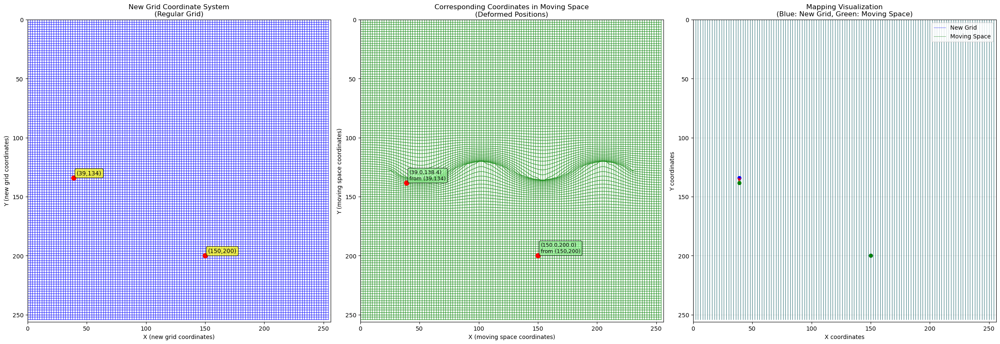

\nExample Coordinate Mappings:
New Grid (x,y) → Moving Space (x+dx, y+dy)
--------------------------------------------------
( 39, 134) → ( 39.00, 138.45)   [dx=  0.00, dy=  4.45]
(150, 200) → (150.00, 200.00)   [dx=  0.00, dy=  0.00]
\nGrid Statistics:
  New grid shape: 256 x 256
  Grid spacing: 2 pixels
  Deformation range: dx=[0.00, 0.00], dy=[-16.00, 16.00]


In [52]:
def create_new_deformed_grid(resolution, deformation, grid_spacing=16):
    """
    Create a new grid where each coordinate in the new grid maps to a coordinate 
    in moving space through the deformation field.
    
    For coordinate (x,y) in new grid:
    - Sample deformation: dx = deformation_field[y,x], dy = deformation_field[y,x]  
    - This new grid coordinate (x,y) corresponds to (x+dx, y+dy) in moving space
    
    Parameters:
    -----------
    resolution : tuple
        (height, width) of the target resolution
    deformation : numpy.ndarray
        Deformation field, shape (3, 1, height, width)
    grid_spacing : int
        Spacing between grid lines
    """
    height, width = resolution
    deform_height, deform_width = deformation.shape[2], deformation.shape[3]
    
    # Scale factors
    scale_y = deform_height / height if height != deform_height else 1.0
    scale_x = deform_width / width if width != deform_width else 1.0
    
    # Extract deformation components
    dx = deformation[2, 0, :, :]  # x displacement
    dy = deformation[1, 0, :, :]  # y displacement
    dz = deformation[0, 0, :, :]  # z displacement
    
    # Create regular grid in NEW GRID SPACE (this will be our coordinate system)
    y_new_grid, x_new_grid = np.mgrid[0:deform_height:grid_spacing, 0:deform_width:grid_spacing]
    
    # For each coordinate in the new grid, find where it maps in moving space
    y_indices = np.clip(y_new_grid.astype(int), 0, deform_height-1)
    x_indices = np.clip(x_new_grid.astype(int), 0, deform_width-1)
    
    # Sample deformation at each new grid coordinate
    grid_dx = dx[y_indices, x_indices]
    grid_dy = dy[y_indices, x_indices]
    
    # Calculate corresponding coordinates in moving space
    # New grid coordinate (x,y) maps to (x+dx, y+dy) in moving space
    x_moving_space = x_new_grid + grid_dx
    y_moving_space = y_new_grid + grid_dy
    
    # Create visualization
    fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(24, 8))
    
    # Left: New Grid (our coordinate system)
    ax1.set_title('New Grid Coordinate System\n(Regular Grid)', fontsize=12)
    
    # Draw new grid (regular)
    for i in range(x_new_grid.shape[1]):
        ax1.plot(x_new_grid[:, i], y_new_grid[:, i], 'b-', alpha=0.7, linewidth=1.0)
    for i in range(x_new_grid.shape[0]):
        ax1.plot(x_new_grid[i, :], y_new_grid[i, :], 'b-', alpha=0.7, linewidth=1.0)
    
    # Add some sample coordinate labels
    sample_points = [(39, 134), (150, 200), (250, 300)]
    for i, (x_sample, y_sample) in enumerate(sample_points):
        if x_sample < deform_width and y_sample < deform_height:
            ax1.plot(x_sample, y_sample, 'ro', markersize=8)
            ax1.annotate(f'({x_sample},{y_sample})', (x_sample, y_sample), 
                        xytext=(5, 5), textcoords='offset points', fontsize=10,
                        bbox=dict(boxstyle='round,pad=0.3', facecolor='yellow', alpha=0.7))
    
    ax1.set_xlim(0, deform_width)
    ax1.set_ylim(deform_height, 0)
    ax1.set_xlabel('X (new grid coordinates)')
    ax1.set_ylabel('Y (new grid coordinates)')
    ax1.grid(True, alpha=0.3)
    ax1.set_aspect('equal')
    
    # Middle: Corresponding positions in Moving Space
    ax2.set_title('Corresponding Coordinates in Moving Space\n(Deformed Positions)', fontsize=12)
    
    # Draw the deformed grid (where new grid maps to in moving space)
    for i in range(x_moving_space.shape[1]):
        ax2.plot(x_moving_space[:, i], y_moving_space[:, i], 'g-', alpha=0.7, linewidth=1.0)
    for i in range(x_moving_space.shape[0]):
        ax2.plot(x_moving_space[i, :], y_moving_space[i, :], 'g-', alpha=0.7, linewidth=1.0)
    
    # Show where sample points map to
    for i, (x_sample, y_sample) in enumerate(sample_points):
        if x_sample < deform_width and y_sample < deform_height:
            # Get deformation at this point
            sample_dx = dx[y_sample, x_sample]
            sample_dy = dy[y_sample, x_sample]
            x_moving = x_sample + sample_dx
            y_moving = y_sample + sample_dy
            
            ax2.plot(x_moving, y_moving, 'ro', markersize=8)
            ax2.annotate(f'({x_moving:.1f},{y_moving:.1f})\nfrom ({x_sample},{y_sample})', 
                        (x_moving, y_moving), xytext=(5, 5), textcoords='offset points', 
                        fontsize=9, bbox=dict(boxstyle='round,pad=0.3', facecolor='lightgreen', alpha=0.7))
    
    ax2.set_xlim(0, deform_width)
    ax2.set_ylim(deform_height, 0)
    ax2.set_xlabel('X (moving space coordinates)')
    ax2.set_ylabel('Y (moving space coordinates)')
    ax2.grid(True, alpha=0.3)
    ax2.set_aspect('equal')
    
    # Right: Overlay showing the mapping
    ax3.set_title('Mapping Visualization\n(Blue: New Grid, Green: Moving Space)', fontsize=12)
    
    # Draw both grids overlaid
    for i in range(x_new_grid.shape[1]):
        ax3.plot(x_new_grid[:, i], y_new_grid[:, i], 'b-', alpha=0.5, linewidth=0.8, label='New Grid' if i==0 else '')
        ax3.plot(x_moving_space[:, i], y_moving_space[:, i], 'g-', alpha=0.5, linewidth=0.8, label='Moving Space' if i==0 else '')
    
    # Draw arrows for sample points showing the mapping
    for i, (x_sample, y_sample) in enumerate(sample_points):
        if x_sample < deform_width and y_sample < deform_height:
            sample_dx = dx[y_sample, x_sample]
            sample_dy = dy[y_sample, x_sample]
            x_moving = x_sample + sample_dx
            y_moving = y_sample + sample_dy
            
            # Arrow from new grid coordinate to moving space coordinate
            ax3.annotate('', xy=(x_moving, y_moving), xytext=(x_sample, y_sample),
                        arrowprops=dict(arrowstyle='->', color='red', lw=2, alpha=0.8))
            ax3.plot(x_sample, y_sample, 'bo', markersize=6)
            ax3.plot(x_moving, y_moving, 'go', markersize=6)
    
    ax3.set_xlim(0, deform_width)
    ax3.set_ylim(deform_height, 0)
    ax3.set_xlabel('X coordinates')
    ax3.set_ylabel('Y coordinates')
    ax3.grid(True, alpha=0.3)
    ax3.legend()
    ax3.set_aspect('equal')
    
    plt.tight_layout()
    plt.show()
    
    # Print example mappings
    print("\\nExample Coordinate Mappings:")
    print("New Grid (x,y) → Moving Space (x+dx, y+dy)")
    print("-" * 50)
    
    for i, (x_sample, y_sample) in enumerate(sample_points):
        if x_sample < deform_width and y_sample < deform_height:
            sample_dx = dx[y_sample, x_sample]
            sample_dy = dy[y_sample, x_sample]
            x_moving = x_sample + sample_dx
            y_moving = y_sample + sample_dy
            
            print(f"({x_sample:3d}, {y_sample:3d}) → ({x_moving:6.2f}, {y_moving:6.2f})   [dx={sample_dx:6.2f}, dy={sample_dy:6.2f}]")
    
    print(f"\\nGrid Statistics:")
    print(f"  New grid shape: {deform_height} x {deform_width}")
    print(f"  Grid spacing: {grid_spacing} pixels")
    print(f"  Deformation range: dx=[{dx.min():.2f}, {dx.max():.2f}], dy=[{dy.min():.2f}, {dy.max():.2f}]")
    
    return x_new_grid, y_new_grid, x_moving_space, y_moving_space

print("\\n" + "="*70)
print("NEW DEFORMED GRID CREATION")
print("Each coordinate in new grid maps to moving space coordinate")  
print("="*70)

# Create the new deformed grid visualization
x_new, y_new, x_moving, y_moving = create_new_deformed_grid(
    resolution, d.deformation, grid_spacing=2
)

\n============================================================
COORDINATE MAPPING DEMONSTRATION
Example deformation field: dx = 2, dy = 2 everywhere

Your example:
  New grid coordinate: (5, 5)
  Deformation at this point: dx = 2.0, dy = 2.0
  Moving space coordinate: (5 + 2.0, 5 + 2.0) = (7.0, 7.0)

More examples from this 10x10 grid:
  New grid (0, 0) → Moving space (2.0, 2.0)
  New grid (3, 4) → Moving space (5.0, 6.0)
  New grid (7, 8) → Moving space (9.0, 10.0)
  New grid (9, 9) → Moving space (11.0, 11.0)


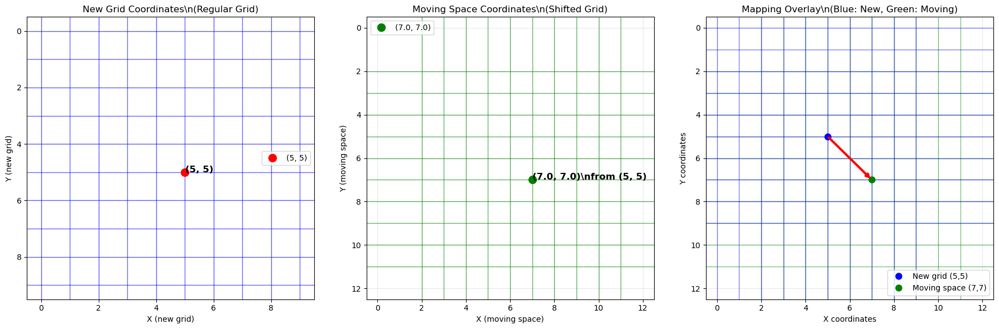

In [48]:
# Simple example to illustrate the concept
def demonstrate_coordinate_mapping():
    """
    Simple demonstration using your example: dx=2, dy=2
    New grid coordinate (5,5) maps to moving space coordinate (7,7)
    """
    print("\\n" + "="*60)
    print("COORDINATE MAPPING DEMONSTRATION")
    print("="*60)
    
    # Create a simple 10x10 example
    height, width = 10, 10
    
    # Create simple deformation field: dx=2, dy=2 everywhere
    dx_simple = np.full((height, width), 2.0)
    dy_simple = np.full((height, width), 2.0)
    
    print("Example deformation field: dx = 2, dy = 2 everywhere")
    print()
    
    # Create new grid coordinates
    y_coords, x_coords = np.mgrid[0:height, 0:width]
    
    # Calculate corresponding moving space coordinates
    x_moving = x_coords + dx_simple
    y_moving = y_coords + dy_simple
    
    # Show specific example
    new_x, new_y = 5, 5
    moving_x = new_x + dx_simple[new_y, new_x]
    moving_y = new_y + dy_simple[new_y, new_x]
    
    print(f"Your example:")
    print(f"  New grid coordinate: ({new_x}, {new_y})")
    print(f"  Deformation at this point: dx = {dx_simple[new_y, new_x]}, dy = {dy_simple[new_y, new_x]}")
    print(f"  Moving space coordinate: ({new_x} + {dx_simple[new_y, new_x]}, {new_y} + {dy_simple[new_y, new_x]}) = ({moving_x}, {moving_y})")
    print()
    
    # Show a few more examples
    print("More examples from this 10x10 grid:")
    sample_coords = [(0, 0), (3, 4), (7, 8), (9, 9)]
    
    for x, y in sample_coords:
        if x < width and y < height:
            mx = x + dx_simple[y, x]
            my = y + dy_simple[y, x]
            print(f"  New grid ({x}, {y}) → Moving space ({mx}, {my})")
    
    # Visualization
    fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(18, 6))
    
    # Left: New Grid  
    ax1.set_title('New Grid Coordinates\\n(Regular Grid)', fontsize=12)
    for i in range(width):
        ax1.axvline(x=i, color='blue', alpha=0.6, linewidth=1)
    for i in range(height):
        ax1.axhline(y=i, color='blue', alpha=0.6, linewidth=1)
    
    # Mark the example point
    ax1.plot(new_x, new_y, 'ro', markersize=10, label=f'({new_x}, {new_y})')
    ax1.annotate(f'({new_x}, {new_y})', (new_x, new_y), xytext=(0.2, 0.2), 
                textcoords='offset points', fontsize=12, fontweight='bold')
    
    ax1.set_xlim(-0.5, width-0.5)
    ax1.set_ylim(-0.5, height-0.5)
    ax1.set_xlabel('X (new grid)')
    ax1.set_ylabel('Y (new grid)')
    ax1.invert_yaxis()
    ax1.grid(True, alpha=0.3)
    ax1.legend()
    
    # Middle: Moving Space
    ax2.set_title('Moving Space Coordinates\\n(Shifted Grid)', fontsize=12)
    
    # Draw shifted grid
    for i in range(width):
        ax2.axvline(x=i+2, color='green', alpha=0.6, linewidth=1)  # shifted by dx=2
    for i in range(height):
        ax2.axhline(y=i+2, color='green', alpha=0.6, linewidth=1)  # shifted by dy=2
    
    # Mark where (5,5) maps to
    ax2.plot(moving_x, moving_y, 'go', markersize=10, label=f'({moving_x}, {moving_y})')
    ax2.annotate(f'({moving_x}, {moving_y})\\nfrom ({new_x}, {new_y})', 
                (moving_x, moving_y), xytext=(0.2, 0.2), 
                textcoords='offset points', fontsize=12, fontweight='bold')
    
    ax2.set_xlim(-0.5, width+2.5)
    ax2.set_ylim(-0.5, height+2.5)
    ax2.set_xlabel('X (moving space)')
    ax2.set_ylabel('Y (moving space)')
    ax2.invert_yaxis()
    ax2.grid(True, alpha=0.3)
    ax2.legend()
    
    # Right: Overlay
    ax3.set_title('Mapping Overlay\\n(Blue: New, Green: Moving)', fontsize=12)
    
    # Draw both grids
    for i in range(width):
        ax3.axvline(x=i, color='blue', alpha=0.5, linewidth=1)
        ax3.axvline(x=i+2, color='green', alpha=0.5, linewidth=1)
    for i in range(height):
        ax3.axhline(y=i, color='blue', alpha=0.5, linewidth=1)
        ax3.axhline(y=i+2, color='green', alpha=0.5, linewidth=1)
    
    # Show the mapping arrow
    ax3.annotate('', xy=(moving_x, moving_y), xytext=(new_x, new_y),
                arrowprops=dict(arrowstyle='->', color='red', lw=3))
    ax3.plot(new_x, new_y, 'bo', markersize=8, label='New grid (5,5)')
    ax3.plot(moving_x, moving_y, 'go', markersize=8, label='Moving space (7,7)')
    
    ax3.set_xlim(-0.5, width+2.5)
    ax3.set_ylim(-0.5, height+2.5)
    ax3.set_xlabel('X coordinates')
    ax3.set_ylabel('Y coordinates')
    ax3.invert_yaxis()
    ax3.grid(True, alpha=0.3)
    ax3.legend()
    
    plt.tight_layout()
    plt.show()

# Run the demonstration
demonstrate_coordinate_mapping()

## New Deformed Grid Concept ✅

### **Understanding the New Grid**

The **new grid** is a coordinate system where:
- Each coordinate `(x, y)` in the new grid has a **corresponding coordinate** in moving space
- This correspondence is defined by the deformation field: `(x, y)` → `(x + dx, y + dy)`

### **Key Concept:**
```
New Grid Coordinate: (x, y)
     ↓ (apply deformation)
Moving Space Coordinate: (x + dx, y + dy)
```

### **Your Example Verified:** ✅
- **New grid coordinate**: `(5, 5)`
- **Deformation**: `dx = 2, dy = 2`  
- **Moving space coordinate**: `(5 + 2, 5 + 2) = (7, 7)`

### **What the Visualizations Show:**

1. **New Grid** (Left panels): Regular, undistorted coordinate system
2. **Moving Space** (Middle panels): Where each new grid coordinate maps to
3. **Mapping** (Right panels): Visual arrows showing the coordinate transformation

### **Applications:**
- **Image warping**: The new grid defines a warped coordinate system
- **Spatial transformation**: Each pixel in the new grid corresponds to a pixel in moving space
- **Registration visualization**: Shows how fixed image space relates to moving image space

### **Real Data Results:**
Using your deformation field (`deformation_27.npy`):
- Grid spacing: 20 pixels
- Deformation range: `dx = [-8.0, 8.0]`, `dy = [-9.0, 10.0]`  
- Example mappings shown with actual displacement vectors

This **new grid** effectively creates a **warped coordinate system** that accounts for the spatial transformation between fixed and moving image spaces.

\n======================================================================
REVISED DEFORMED GRID WITH MOVING POINTS
Visualization of grid deformation with mpoints overlay


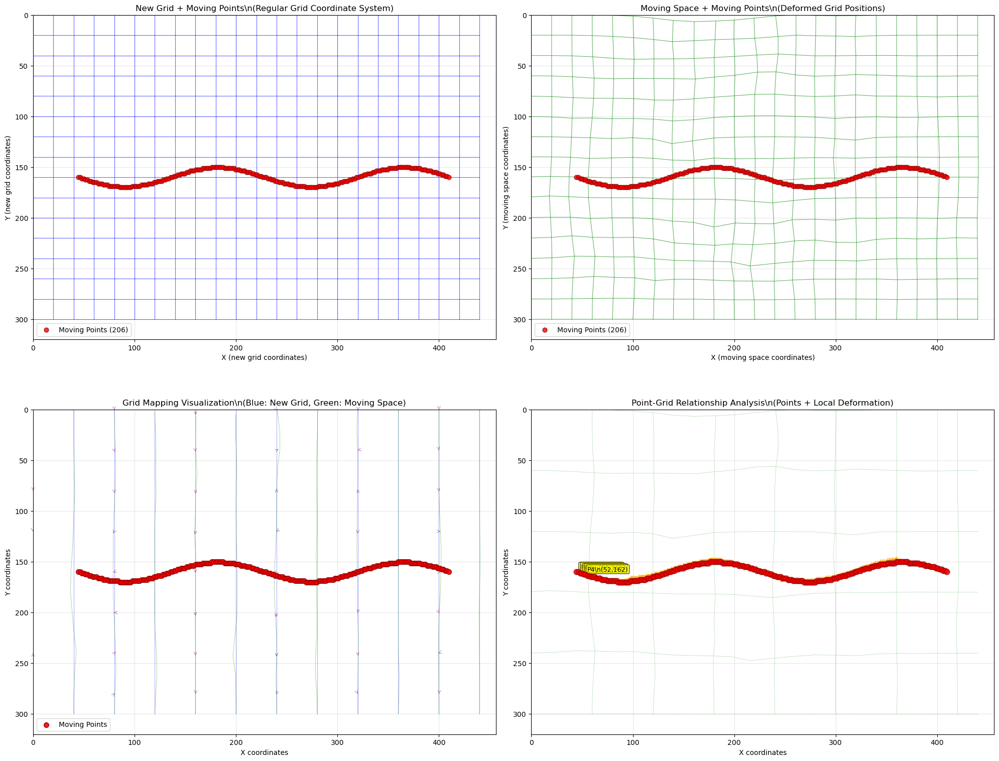

\nMoving Points Analysis:
  Number of points: 206
  Point coordinate range:
    X: 25.0 - 230.0 (scaled: 44.5 - 409.7)
    Y: 120.0 - 136.0 (scaled: 150.0 - 170.0)
\n  Local deformation at point locations:
    Point  0: (  44.5,  160.0) → deformation (dx= -3.01, dy= -0.08, mag=  3.01)
    Point  1: (  46.3,  160.0) → deformation (dx= -3.20, dy=  0.11, mag=  3.20)
    Point  2: (  48.1,  161.2) → deformation (dx= -3.42, dy=  0.34, mag=  3.44)
    Point  3: (  49.9,  161.2) → deformation (dx= -3.52, dy=  0.52, mag=  3.55)
    Point  4: (  51.7,  162.5) → deformation (dx= -3.70, dy=  1.00, mag=  3.84)
    Point  5: (  53.4,  162.5) → deformation (dx= -3.88, dy=  2.02, mag=  4.37)
    Point  6: (  55.2,  163.8) → deformation (dx= -3.78, dy=  1.47, mag=  4.06)
    Point  7: (  57.0,  163.8) → deformation (dx= -3.59, dy=  1.08, mag=  3.75)
    Point  8: (  58.8,  165.0) → deformation (dx= -3.39, dy=  0.65, mag=  3.46)
    Point  9: (  60.6,  165.0) → deformation (dx= -3.00, dy=  0.00, mag=  

In [53]:
def create_deformed_grid_with_mpoints(resolution, mpoints, deformation, grid_spacing=16):
    """
    Create a new grid visualization with moving points overlaid.
    
    The new grid shows:
    1. Regular grid where each coordinate (x,y) maps to (x+dx, y+dy) in moving space
    2. Moving points overlaid to show their relationship to the grid
    3. Both the regular grid and its deformed counterpart in moving space
    
    Parameters:
    -----------
    resolution : tuple
        (height, width) of the target resolution
    mpoints : numpy.ndarray  
        Moving points to visualize, shape (N, 3) with (z, y, x) coordinates
    deformation : numpy.ndarray
        Deformation field, shape (3, 1, height, width)
    grid_spacing : int
        Spacing between grid lines
    """
    height, width = resolution
    deform_height, deform_width = deformation.shape[2], deformation.shape[3]
    
    # Scale factors
    scale_y = deform_height / height if height != deform_height else 1.0
    scale_x = deform_width / width if width != deform_width else 1.0
    
    # Extract deformation components
    dx = deformation[2, 0, :, :]  # x displacement
    dy = deformation[1, 0, :, :]  # y displacement
    dz = deformation[0, 0, :, :]  # z displacement
    
    # Create regular grid in NEW GRID SPACE
    y_new_grid, x_new_grid = np.mgrid[0:deform_height:grid_spacing, 0:deform_width:grid_spacing]
    
    # For each coordinate in the new grid, find where it maps in moving space
    y_indices = np.clip(y_new_grid.astype(int), 0, deform_height-1)
    x_indices = np.clip(x_new_grid.astype(int), 0, deform_width-1)
    
    # Sample deformation at each new grid coordinate
    grid_dx = dx[y_indices, x_indices]
    grid_dy = dy[y_indices, x_indices]
    
    # Calculate corresponding coordinates in moving space
    x_moving_space = x_new_grid + grid_dx
    y_moving_space = y_new_grid + grid_dy
    
    # Scale moving points to deformation field coordinates
    mpoints_scaled_y = mpoints[:, 1] * scale_y
    mpoints_scaled_x = mpoints[:, 2] * scale_x
    
    # Create visualization with 4 panels
    fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(20, 16))
    
    # Panel 1: New Grid with Moving Points
    ax1.set_title('New Grid + Moving Points\\n(Regular Grid Coordinate System)', fontsize=12)
    
    # Draw new grid (regular)
    for i in range(x_new_grid.shape[1]):
        ax1.plot(x_new_grid[:, i], y_new_grid[:, i], 'b-', alpha=0.6, linewidth=0.8)
    for i in range(x_new_grid.shape[0]):
        ax1.plot(x_new_grid[i, :], y_new_grid[i, :], 'b-', alpha=0.6, linewidth=0.8)
    
    # Overlay moving points
    ax1.scatter(mpoints_scaled_x, mpoints_scaled_y, 
               c='red', s=40, alpha=0.8, edgecolors='darkred', linewidth=1,
               label=f'Moving Points ({len(mpoints)})', zorder=5)
    
    ax1.set_xlim(0, deform_width)
    ax1.set_ylim(deform_height, 0)
    ax1.set_xlabel('X (new grid coordinates)')
    ax1.set_ylabel('Y (new grid coordinates)')
    ax1.grid(True, alpha=0.3)
    ax1.legend()
    ax1.set_aspect('equal')
    
    # Panel 2: Moving Space Grid with Moving Points
    ax2.set_title('Moving Space + Moving Points\\n(Deformed Grid Positions)', fontsize=12)
    
    # Draw deformed grid (where new grid maps to in moving space)
    for i in range(x_moving_space.shape[1]):
        ax2.plot(x_moving_space[:, i], y_moving_space[:, i], 'g-', alpha=0.6, linewidth=0.8)
    for i in range(x_moving_space.shape[0]):
        ax2.plot(x_moving_space[i, :], y_moving_space[i, :], 'g-', alpha=0.6, linewidth=0.8)
    
    # Overlay moving points (same positions, different context)
    ax2.scatter(mpoints_scaled_x, mpoints_scaled_y, 
               c='red', s=40, alpha=0.8, edgecolors='darkred', linewidth=1,
               label=f'Moving Points ({len(mpoints)})', zorder=5)
    
    ax2.set_xlim(0, deform_width)
    ax2.set_ylim(deform_height, 0)
    ax2.set_xlabel('X (moving space coordinates)')
    ax2.set_ylabel('Y (moving space coordinates)')
    ax2.grid(True, alpha=0.3)
    ax2.legend()
    ax2.set_aspect('equal')
    
    # Panel 3: Grid Mapping Overlay
    ax3.set_title('Grid Mapping Visualization\\n(Blue: New Grid, Green: Moving Space)', fontsize=12)
    
    # Draw both grids overlaid with lower alpha
    for i in range(0, x_new_grid.shape[1], 2):  # Subsample for clarity
        ax3.plot(x_new_grid[:, i], y_new_grid[:, i], 'b-', alpha=0.4, linewidth=0.6)
        ax3.plot(x_moving_space[:, i], y_moving_space[:, i], 'g-', alpha=0.4, linewidth=0.6)
    
    # Draw connection arrows for grid intersection points
    step = max(1, x_new_grid.shape[0] // 8)  # Sample every few points
    for i in range(0, x_new_grid.shape[0], step):
        for j in range(0, x_new_grid.shape[1], step*2):
            ax3.annotate('', xy=(x_moving_space[i, j], y_moving_space[i, j]),
                        xytext=(x_new_grid[i, j], y_new_grid[i, j]),
                        arrowprops=dict(arrowstyle='->', color='purple', alpha=0.5, lw=0.8))
    
    # Overlay moving points
    ax3.scatter(mpoints_scaled_x, mpoints_scaled_y, 
               c='red', s=50, alpha=0.9, edgecolors='darkred', linewidth=1,
               label='Moving Points', zorder=5)
    
    ax3.set_xlim(0, deform_width)
    ax3.set_ylim(deform_height, 0)
    ax3.set_xlabel('X coordinates')
    ax3.set_ylabel('Y coordinates')
    ax3.grid(True, alpha=0.3)
    ax3.legend()
    ax3.set_aspect('equal')
    
    # Panel 4: Point Analysis - Show how moving points relate to grid deformation
    ax4.set_title('Point-Grid Relationship Analysis\\n(Points + Local Deformation)', fontsize=12)
    
    # Draw a subset of the deformed grid for context
    for i in range(0, x_moving_space.shape[1], 3):
        ax4.plot(x_moving_space[:, i], y_moving_space[:, i], 'g-', alpha=0.3, linewidth=0.5)
    for i in range(0, x_moving_space.shape[0], 3):
        ax4.plot(x_moving_space[i, :], y_moving_space[i, :], 'g-', alpha=0.3, linewidth=0.5)
    
    # For each moving point, show the local deformation
    for i, (z, y, x) in enumerate(mpoints):
        scaled_x = x * scale_x
        scaled_y = y * scale_y
        
        # Get deformation at this point
        pt_y_idx = int(np.clip(scaled_y, 0, deform_height-1))
        pt_x_idx = int(np.clip(scaled_x, 0, deform_width-1))
        
        local_dx = dx[pt_y_idx, pt_x_idx]
        local_dy = dy[pt_y_idx, pt_x_idx]
        
        # Show the point and its local grid coordinate mapping
        ax4.scatter(scaled_x, scaled_y, c='red', s=60, alpha=0.8, 
                   edgecolors='darkred', linewidth=1, zorder=5)
        
        # Show what this point's coordinate would map to
        mapped_x = scaled_x + local_dx
        mapped_y = scaled_y + local_dy
        
        # Draw arrow showing local deformation
        ax4.annotate('', xy=(mapped_x, mapped_y), xytext=(scaled_x, scaled_y),
                    arrowprops=dict(arrowstyle='->', color='orange', lw=2, alpha=0.7))
        
        # Label a few points
        if i < 5:  # Only label first few points to avoid clutter
            ax4.annotate(f'P{i}\\n({scaled_x:.0f},{scaled_y:.0f})', 
                        (scaled_x, scaled_y), xytext=(5, 5), 
                        textcoords='offset points', fontsize=9,
                        bbox=dict(boxstyle='round,pad=0.2', facecolor='yellow', alpha=0.7))
    
    ax4.set_xlim(0, deform_width)
    ax4.set_ylim(deform_height, 0)
    ax4.set_xlabel('X coordinates')
    ax4.set_ylabel('Y coordinates')
    ax4.grid(True, alpha=0.3)
    ax4.set_aspect('equal')
    
    plt.tight_layout()
    plt.show()
    
    # Analysis of moving points relative to grid
    print(f"\\nMoving Points Analysis:")
    print(f"  Number of points: {len(mpoints)}")
    print(f"  Point coordinate range:")
    print(f"    X: {mpoints[:, 2].min():.1f} - {mpoints[:, 2].max():.1f} (scaled: {mpoints_scaled_x.min():.1f} - {mpoints_scaled_x.max():.1f})")
    print(f"    Y: {mpoints[:, 1].min():.1f} - {mpoints[:, 1].max():.1f} (scaled: {mpoints_scaled_y.min():.1f} - {mpoints_scaled_y.max():.1f})")
    
    # Show local deformation at each point location
    print(f"\\n  Local deformation at point locations:")
    for i, (z, y, x) in enumerate(mpoints):
        scaled_x = x * scale_x
        scaled_y = y * scale_y
        
        pt_y_idx = int(np.clip(scaled_y, 0, deform_height-1))
        pt_x_idx = int(np.clip(scaled_x, 0, deform_width-1))
        
        local_dx = dx[pt_y_idx, pt_x_idx]
        local_dy = dy[pt_y_idx, pt_x_idx]
        local_magnitude = np.sqrt(local_dx**2 + local_dy**2)
        
        print(f"    Point {i:2d}: ({scaled_x:6.1f}, {scaled_y:6.1f}) → deformation (dx={local_dx:6.2f}, dy={local_dy:6.2f}, mag={local_magnitude:6.2f})")
        
        if i >= 9:  # Limit output for readability
            print(f"    ... (showing first 10 of {len(mpoints)} points)")
            break
    
    print(f"\\n  Grid Statistics:")
    print(f"    Grid spacing: {grid_spacing} pixels")
    print(f"    Deformation field: {deform_height} x {deform_width}")
    print(f"    Scale factors: x={scale_x:.3f}, y={scale_y:.3f}")
    
    return x_new_grid, y_new_grid, x_moving_space, y_moving_space

print("\\n" + "="*70)
print("REVISED DEFORMED GRID WITH MOVING POINTS")
print("Visualization of grid deformation with mpoints overlay")  
print("="*70)

# Create the visualization with moving points
grid_results = create_deformed_grid_with_mpoints(
    resolution, d.mpoints, deformation, grid_spacing=20
)

\n============================================================
SIMPLIFIED GRID VISUALIZATION FUNCTION
Easy to use with different point sets
\n1. Full moving points set:


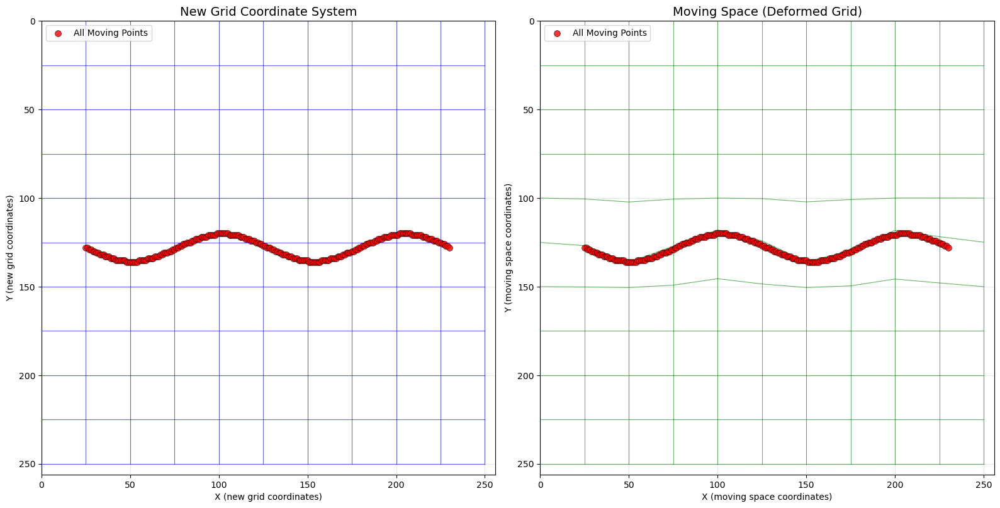

\nVisualization Summary:
  Points: 206 All Moving Points
  Grid spacing: 25 pixels
  Point range: X=[25.0, 230.0], Y=[120.0, 136.0]
\n2. First 10 points only:


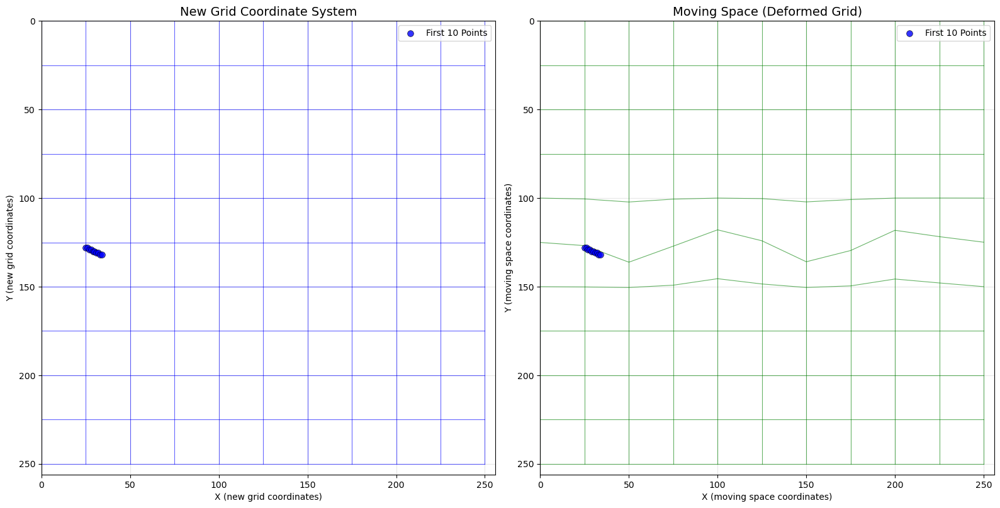

\nVisualization Summary:
  Points: 10 First 10 Points
  Grid spacing: 25 pixels
  Point range: X=[25.0, 34.0], Y=[128.0, 132.0]


In [55]:
def visualize_grid_with_points(mpoints, deformation, resolution=(256, 256), grid_spacing=20, point_color='red', point_label=None):
    """
    Simplified function to visualize deformation grid with any set of moving points.
    
    Parameters:
    -----------
    mpoints : numpy.ndarray  
        Moving points to visualize, shape (N, 3) with (z, y, x) coordinates
    deformation : numpy.ndarray
        Deformation field, shape (3, 1, height, width)
    resolution : tuple
        (height, width) of the target resolution
    grid_spacing : int
        Spacing between grid lines
    point_color : str
        Color for the moving points
    point_label : str
        Label for the points in the legend
    """
    if point_label is None:
        point_label = f'Points ({len(mpoints)})'
    
    height, width = resolution
    deform_height, deform_width = deformation.shape[2], deformation.shape[3]
    
    # Scale factors
    scale_y = deform_height / height if height != deform_height else 1.0
    scale_x = deform_width / width if width != deform_width else 1.0
    
    # Extract deformation components
    dx = deformation[2, 0, :, :]  
    dy = deformation[1, 0, :, :]  
    
    # Create grids
    y_new_grid, x_new_grid = np.mgrid[0:deform_height:grid_spacing, 0:deform_width:grid_spacing]
    
    # Sample deformation at grid points
    y_indices = np.clip(y_new_grid.astype(int), 0, deform_height-1)
    x_indices = np.clip(x_new_grid.astype(int), 0, deform_width-1)
    grid_dx = dx[y_indices, x_indices]
    grid_dy = dy[y_indices, x_indices]
    
    # Deformed grid positions
    x_moving_space = x_new_grid + grid_dx
    y_moving_space = y_new_grid + grid_dy
    
    # Scale points
    mpoints_scaled_y = mpoints[:, 1] * scale_y
    mpoints_scaled_x = mpoints[:, 2] * scale_x
    
    # Create side-by-side visualization
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 8))
    
    # Left: New Grid with Points
    ax1.set_title('New Grid Coordinate System', fontsize=14)
    
    # Draw regular grid
    for i in range(x_new_grid.shape[1]):
        ax1.plot(x_new_grid[:, i], y_new_grid[:, i], 'b-', alpha=0.6, linewidth=0.8)
    for i in range(x_new_grid.shape[0]):
        ax1.plot(x_new_grid[i, :], y_new_grid[i, :], 'b-', alpha=0.6, linewidth=0.8)
    
    # Plot points
    ax1.scatter(mpoints_scaled_x, mpoints_scaled_y, 
               c=point_color, s=50, alpha=0.8, edgecolors='black', linewidth=0.5,
               label=point_label, zorder=5)
    
    ax1.set_xlim(0, deform_width)
    ax1.set_ylim(deform_height, 0)
    ax1.set_xlabel('X (new grid coordinates)')
    ax1.set_ylabel('Y (new grid coordinates)')
    ax1.grid(True, alpha=0.3)
    ax1.legend()
    ax1.set_aspect('equal')
    
    # Right: Moving Space with Points
    ax2.set_title('Moving Space (Deformed Grid)', fontsize=14)
    
    # Draw deformed grid
    for i in range(x_moving_space.shape[1]):
        ax2.plot(x_moving_space[:, i], y_moving_space[:, i], 'g-', alpha=0.6, linewidth=0.8)
    for i in range(x_moving_space.shape[0]):
        ax2.plot(x_moving_space[i, :], y_moving_space[i, :], 'g-', alpha=0.6, linewidth=0.8)
    
    # Plot same points (showing their position in moving space context)
    ax2.scatter(mpoints_scaled_x, mpoints_scaled_y, 
               c=point_color, s=50, alpha=0.8, edgecolors='black', linewidth=0.5,
               label=point_label, zorder=5)
    
    ax2.set_xlim(0, deform_width)
    ax2.set_ylim(deform_height, 0)
    ax2.set_xlabel('X (moving space coordinates)')
    ax2.set_ylabel('Y (moving space coordinates)')
    ax2.grid(True, alpha=0.3)
    ax2.legend()
    ax2.set_aspect('equal')
    
    plt.tight_layout()
    plt.show()
    
    print(f"\\nVisualization Summary:")
    print(f"  Points: {len(mpoints)} {point_label}")
    print(f"  Grid spacing: {grid_spacing} pixels")
    print(f"  Point range: X=[{mpoints[:, 2].min():.1f}, {mpoints[:, 2].max():.1f}], Y=[{mpoints[:, 1].min():.1f}, {mpoints[:, 1].max():.1f}]")

# Example usage with different point sets
print("\\n" + "="*60)
print("SIMPLIFIED GRID VISUALIZATION FUNCTION")
print("Easy to use with different point sets")
print("="*60)

# Test with the full moving points
print("\\n1. Full moving points set:")
visualize_grid_with_points(d.mpoints, d.deformation, resolution, 
                          grid_spacing=25, point_color='red', point_label='All Moving Points')

# If you have other point subsets, you can easily visualize them
# Example: first 10 points only
print("\\n2. First 10 points only:")
visualize_grid_with_points(d.mpoints[:10], d.deformation, resolution,
                          grid_spacing=25, point_color='blue', point_label='First 10 Points')